## Prediction of Obesity levels based on various Classification Algorithms

# Installing Required Libraries

In [528]:
!pip install --upgrade scikit-learn

In [529]:
!pip install mlxtend --upgrade --no-deps

In [149]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import time
import requests

import warnings
warnings.filterwarnings("ignore")

## Data read

In [150]:
url = "https://raw.githubusercontent.com/ThavaseelanMohan/Machine_Learning/main/ObesityDataSet_raw_and_data.csv"
filename = "ObesityDataSet_raw_and_data.csv"

In [151]:
df_obese = pd.read_csv(url)

In [152]:
df_obese.head(5)

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II


In [153]:
df_obese.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

## Column names conversion

In [154]:
#Converting all the fields to lower case
df_obese = df_obese.rename(mapper=str.lower,axis=1)

In [155]:
df_obese.columns

Index(['gender', 'age', 'height', 'weight', 'family_history_with_overweight',
       'favc', 'fcvc', 'ncp', 'caec', 'smoke', 'ch2o', 'scc', 'faf', 'tue',
       'calc', 'mtrans', 'nobeyesdad'],
      dtype='object')

In [156]:
#Renaming the columns
df_obese = df_obese.rename(columns={'family_history_with_overweight':'family history with overweight'})

In [157]:
df_obese.columns

Index(['gender', 'age', 'height', 'weight', 'family history with overweight',
       'favc', 'fcvc', 'ncp', 'caec', 'smoke', 'ch2o', 'scc', 'faf', 'tue',
       'calc', 'mtrans', 'nobeyesdad'],
      dtype='object')

In [158]:
df_obese.iloc[:,:]

,gender,age,height,weight,family history with overweight,favc,fcvc,ncp,caec,smoke,ch2o,scc,faf,tue,calc,mtrans,nobeyesdad
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2106,Female,20.976842,1.710730,131.408528,NaN,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2107,Female,21.982942,1.748584,133.742943,NaN,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2108,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2109,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III


In [159]:
df_obese.iloc[:,-1]

0             Normal_Weight
1             Normal_Weight
2             Normal_Weight
3        Overweight_Level_I
4       Overweight_Level_II
               ...         
2106       Obesity_Type_III
2107       Obesity_Type_III
2108       Obesity_Type_III
2109       Obesity_Type_III
2110       Obesity_Type_III
Name: nobeyesdad, Length: 2111, dtype: object

## Exploratory Data Analysis (EDA)

In [160]:
df_obese.sort_values('nobeyesdad').groupby(by='gender').first()

,age,height,weight,family history with overweight,favc,fcvc,ncp,caec,smoke,ch2o,scc,faf,tue,calc,mtrans,nobeyesdad
gender,,,,,,,,,,,,,,,,
Female,21.376426,1.722527,50.833029,no,no,3.000000,3.285167,Frequently,no,1.569082,no,0.545931,0.469735,Sometimes,Public_Transportation,Insufficient_Weight
Male,18.525525,1.856633,59.258372,yes,yes,2.592247,3.304123,Sometimes,no,2.036764,no,2.038653,1.119877,no,Automobile,Insufficient_Weight


In [161]:
df_obese.sort_values('nobeyesdad').groupby(by='smoke').first()

,gender,age,height,weight,family history with overweight,favc,fcvc,ncp,caec,ch2o,scc,faf,tue,calc,mtrans,nobeyesdad
smoke,,,,,,,,,,,,,,,,
no,Female,21.376426,1.722527,50.833029,no,no,3.0,3.285167,Frequently,1.569082,no,0.545931,0.469735,Sometimes,Public_Transportation,Insufficient_Weight
yes,Female,20.000000,1.640000,49.000000,no,no,3.0,3.000000,Sometimes,2.000000,no,2.000000,1.000000,Sometimes,Automobile,Insufficient_Weight


In [162]:
df_obese.groupby('nobeyesdad').size()

nobeyesdad
Insufficient_Weight    272
Normal_Weight          287
Obesity_Type_I         351
Obesity_Type_II        297
Obesity_Type_III       324
Overweight_Level_I     290
Overweight_Level_II    290
dtype: int64

In [163]:
df_obese.groupby('smoke').size()

smoke
no     2067
yes      44
dtype: int64

In [164]:
df_obese.groupby('gender').size()

gender
Female    1043
Male      1068
dtype: int64

In [165]:
df_obese.groupby('family history with overweight').size()

family history with overweight
no      385
yes    1724
dtype: int64

In [166]:
df_obese.groupby('caec').size()

caec
Always          53
Frequently     239
Sometimes     1761
no              51
dtype: int64

In [167]:
df_obese.groupby('calc').size()

calc
Always           1
Frequently      70
Sometimes     1397
no             637
dtype: int64

In [168]:
df_obese.groupby('mtrans').size()

mtrans
Automobile                455
Bike                        7
Motorbike                  11
Public_Transportation    1578
Walking                    56
dtype: int64

In [169]:
df_obese.isnull().sum()

gender                            0
age                               0
height                            4
weight                            0
family history with overweight    2
favc                              2
fcvc                              0
ncp                               3
caec                              7
smoke                             0
ch2o                              2
scc                               0
faf                               2
tue                               2
calc                              6
mtrans                            4
nobeyesdad                        0
dtype: int64

In [170]:
#Statistical description of dataframe
df_obese.describe().T

,count,mean,std,min,25%,50%,75%,max
age,2111.0,24.312600,6.345968,14.00,19.947192,22.777890,26.000000,61.00
height,2107.0,1.701462,0.093240,1.45,1.630000,1.700181,1.768233,1.98
weight,2111.0,86.586058,26.191172,39.00,65.473343,83.000000,107.430682,173.00
fcvc,2111.0,2.419043,0.533927,1.00,2.000000,2.385502,3.000000,3.00
ncp,2108.0,2.685774,0.778503,1.00,2.663309,3.000000,3.000000,4.00
ch2o,2109.0,2.008369,0.613134,1.00,1.579207,2.000000,2.478838,3.00
faf,2109.0,1.009549,0.850625,0.00,0.121585,1.000000,1.666390,3.00
tue,2109.0,0.656915,0.608426,0.00,0.000000,0.625350,1.000000,2.00


In [171]:
#Statistical description of dataframe
df_obese.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
gender,2111,2,Male,1068,NaN,NaN,NaN,NaN,NaN,NaN,NaN
age,2111.0,NaN,NaN,NaN,24.3126,6.345968,14.0,19.947192,22.77789,26.0,61.0
height,2107.0,NaN,NaN,NaN,1.701462,0.09324,1.45,1.63,1.700181,1.768233,1.98
weight,2111.0,NaN,NaN,NaN,86.586058,26.191172,39.0,65.473343,83.0,107.430682,173.0
family history with overweight,2109,2,yes,1724,NaN,NaN,NaN,NaN,NaN,NaN,NaN
favc,2109,2,yes,1865,NaN,NaN,NaN,NaN,NaN,NaN,NaN
fcvc,2111.0,NaN,NaN,NaN,2.419043,0.533927,1.0,2.0,2.385502,3.0,3.0
ncp,2108.0,NaN,NaN,NaN,2.685774,0.778503,1.0,2.663309,3.0,3.0,4.0
caec,2104,4,Sometimes,1761,NaN,NaN,NaN,NaN,NaN,NaN,NaN
smoke,2111,2,no,2067,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<Axes: >

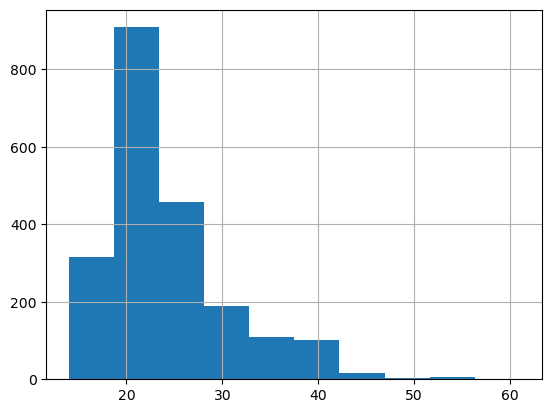

In [172]:
df_obese['age'].hist()

In [173]:
pd.cut(df_obese['age'],bins=10).value_counts()

age
(18.7, 23.4]      909
(23.4, 28.1]      457
(13.953, 18.7]    317
(28.1, 32.8]      190
(32.8, 37.5]      108
(37.5, 42.2]      101
(42.2, 46.9]       17
(51.6, 56.3]        7
(46.9, 51.6]        4
(56.3, 61.0]        1
Name: count, dtype: int64

<Axes: >

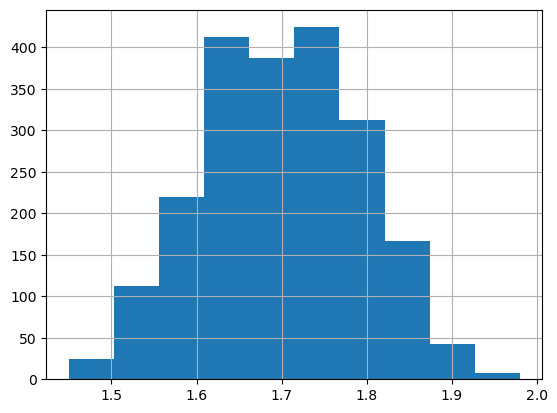

In [174]:
df_obese['height'].hist()

In [175]:
pd.cut(df_obese['height'],bins=10).value_counts()

height
(1.715, 1.768]    424
(1.609, 1.662]    412
(1.662, 1.715]    387
(1.768, 1.821]    312
(1.556, 1.609]    220
(1.821, 1.874]    166
(1.503, 1.556]    112
(1.874, 1.927]     42
(1.449, 1.503]     24
(1.927, 1.98]       8
Name: count, dtype: int64

<Axes: >

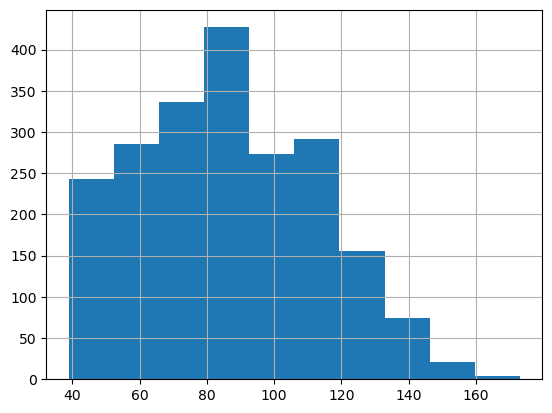

In [176]:
df_obese['weight'].hist()

In [177]:
pd.cut(df_obese['weight'],bins=10).value_counts()

weight
(79.2, 92.6]      427
(65.8, 79.2]      336
(106.0, 119.4]    291
(52.4, 65.8]      286
(92.6, 106.0]     273
(38.866, 52.4]    243
(119.4, 132.8]    156
(132.8, 146.2]     74
(146.2, 159.6]     21
(159.6, 173.0]      4
Name: count, dtype: int64

<Axes: >

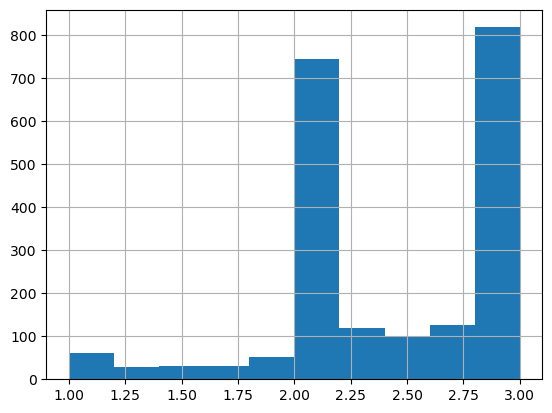

In [178]:
df_obese['fcvc'].hist()

In [179]:
pd.cut(df_obese['fcvc'],bins=10).value_counts()

fcvc
(2.8, 3.0]      819
(1.8, 2.0]      652
(2.0, 2.2]      146
(2.6, 2.8]      126
(2.2, 2.4]      119
(2.4, 2.6]       99
(0.998, 1.2]     60
(1.4, 1.6]       32
(1.6, 1.8]       30
(1.2, 1.4]       28
Name: count, dtype: int64

<Axes: >

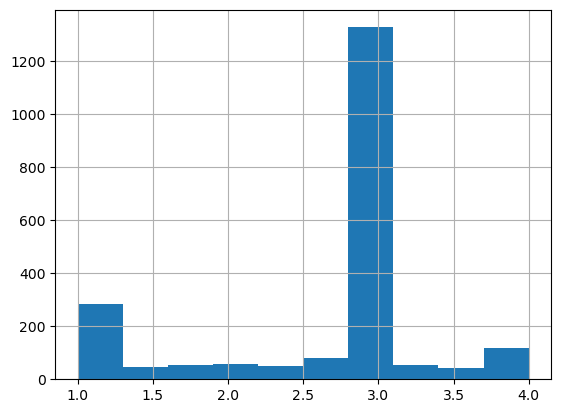

In [180]:
df_obese['ncp'].hist()

In [181]:
pd.cut(df_obese['ncp'],bins=10).value_counts()

ncp
(2.8, 3.1]      1326
(0.997, 1.3]     282
(3.7, 4.0]       118
(2.5, 2.8]        80
(1.9, 2.2]        58
(1.6, 1.9]        54
(3.1, 3.4]        52
(2.2, 2.5]        51
(1.3, 1.6]        45
(3.4, 3.7]        42
Name: count, dtype: int64

<Axes: >

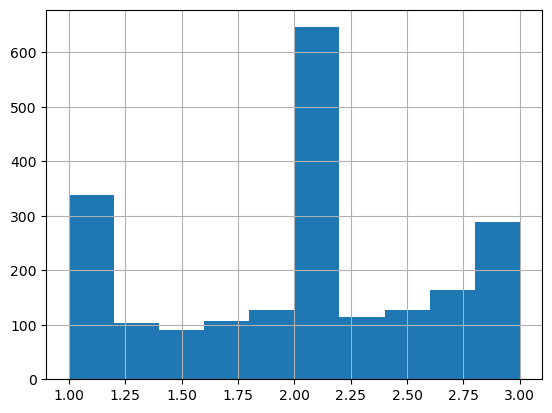

In [182]:
df_obese['ch2o'].hist()

In [183]:
pd.cut(df_obese['ch2o'],bins=10).value_counts()

ch2o
(1.8, 2.0]      575
(0.998, 1.2]    339
(2.8, 3.0]      289
(2.0, 2.2]      198
(2.6, 2.8]      164
(2.4, 2.6]      128
(2.2, 2.4]      115
(1.6, 1.8]      107
(1.2, 1.4]      104
(1.4, 1.6]       90
Name: count, dtype: int64

<Axes: >

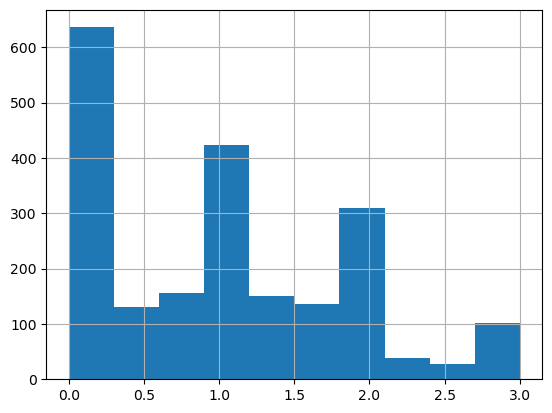

In [184]:
df_obese['faf'].hist()

In [185]:
pd.cut(df_obese['faf'],bins=10).value_counts()

faf
(-0.003, 0.3]    636
(0.9, 1.2]       424
(1.8, 2.1]       310
(0.6, 0.9]       155
(1.2, 1.5]       150
(1.5, 1.8]       136
(0.3, 0.6]       131
(2.7, 3.0]       102
(2.1, 2.4]        38
(2.4, 2.7]        27
Name: count, dtype: int64

<Axes: >

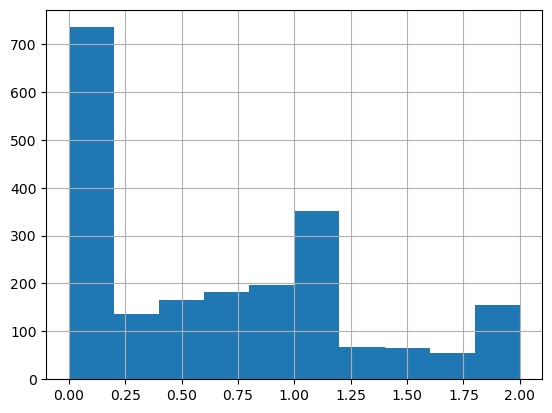

In [186]:
df_obese['tue'].hist()

In [187]:
pd.cut(df_obese['tue'],bins=10).value_counts()

tue
(-0.002, 0.2]    735
(0.8, 1.0]       489
(0.6, 0.8]       182
(0.4, 0.6]       165
(1.8, 2.0]       155
(0.2, 0.4]       136
(1.2, 1.4]        68
(1.4, 1.6]        66
(1.0, 1.2]        59
(1.6, 1.8]        54
Name: count, dtype: int64

## Checking Outliers using Box Plots

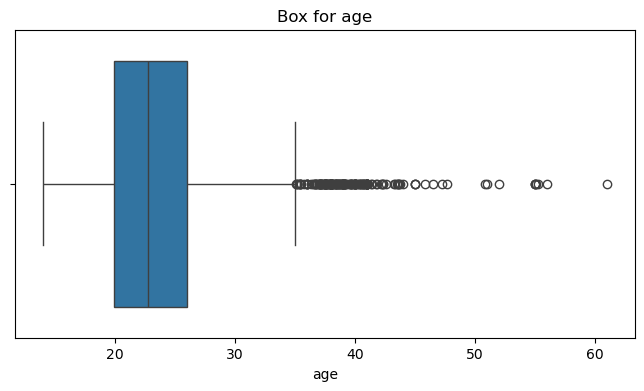

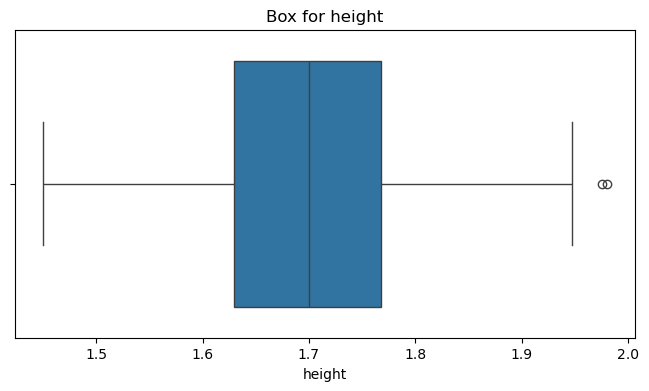

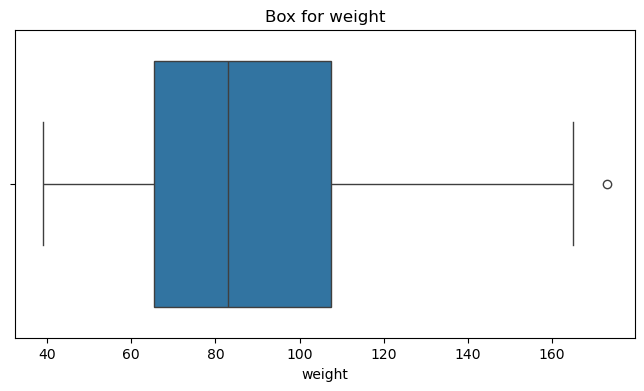

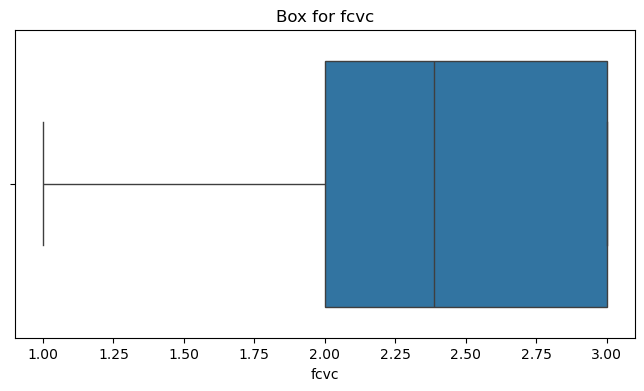

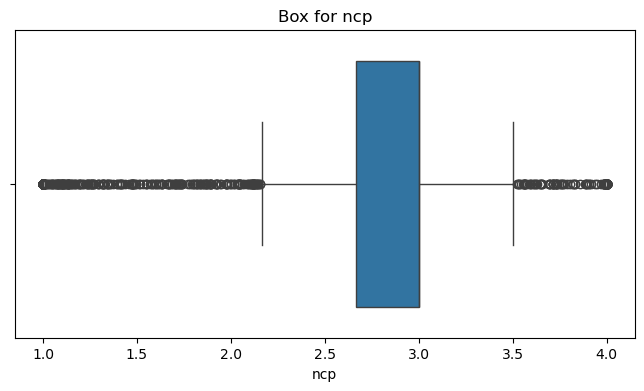

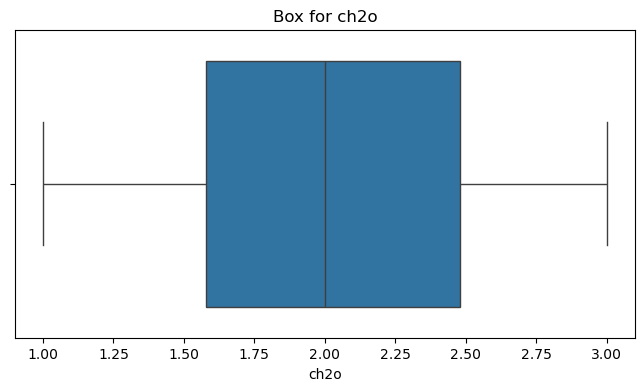

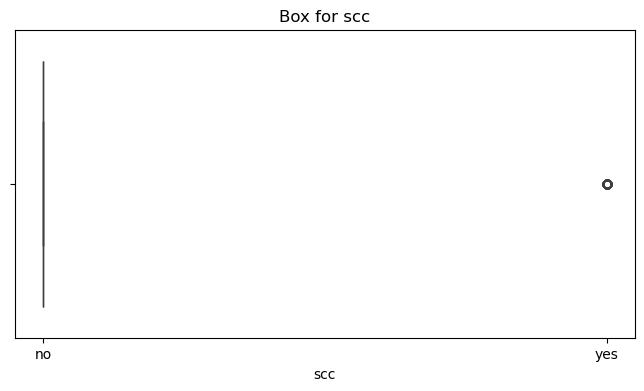

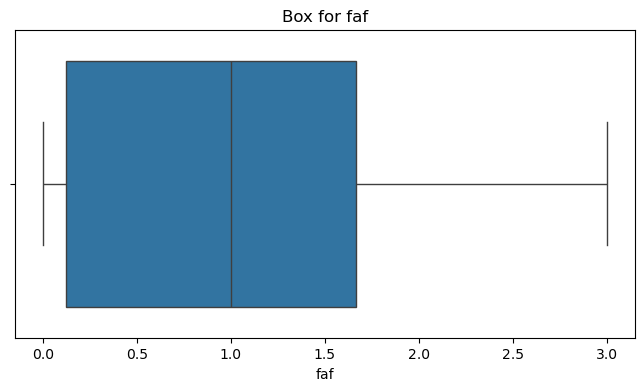

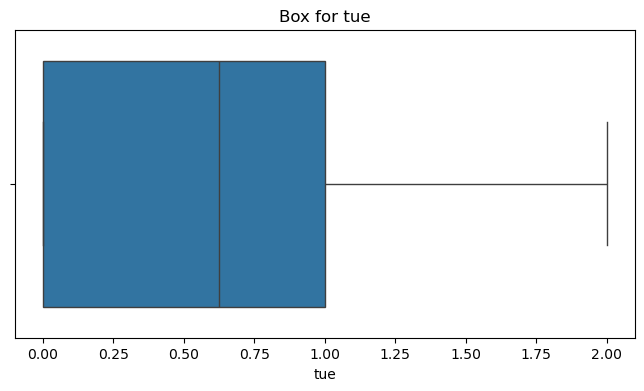

In [188]:
def check_outliers(df_obese, column_name):
    plt.figure(figsize=(8, 4))
    sns.boxplot(x = df_obese[column_name])
    plt.title(f"Box for {column_name}")
    plt.show()
    
column_of_interest = ["age", "height", "weight", "fcvc", "ncp", "ch2o", "scc", "faf", "tue"]
for col in column_of_interest:
    check_outliers(df_obese, col)

## Quantile-Quantile plot

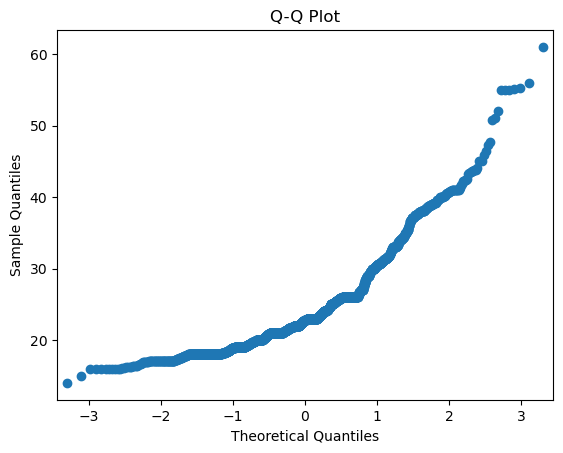

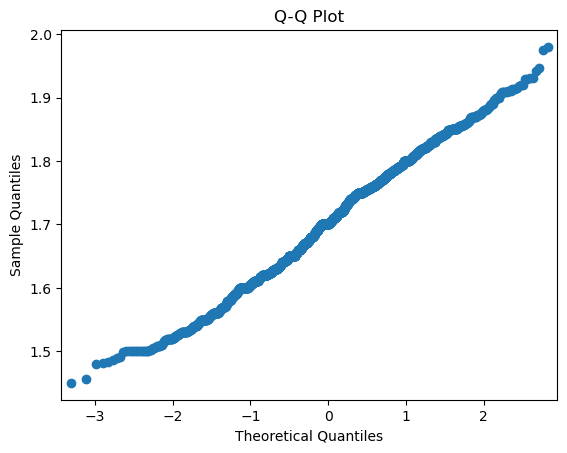

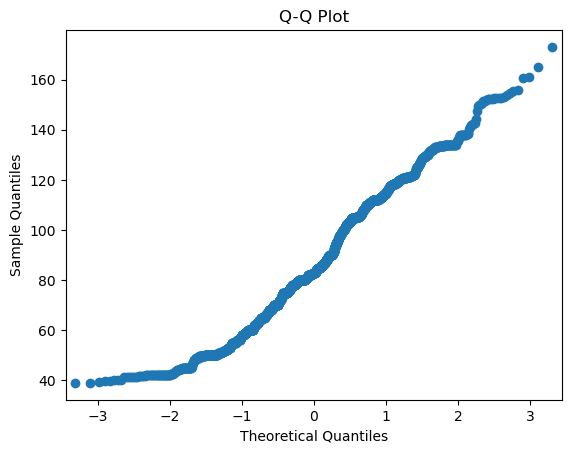

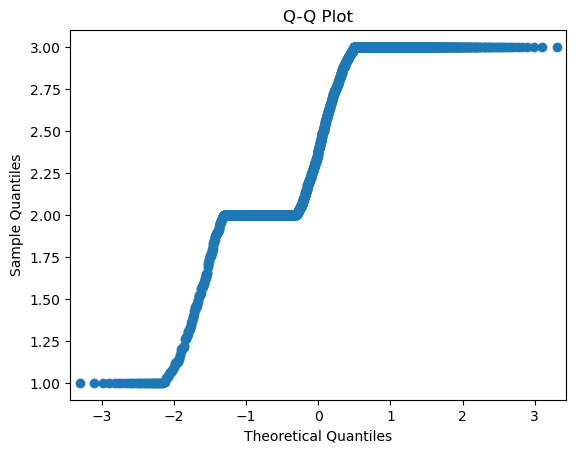

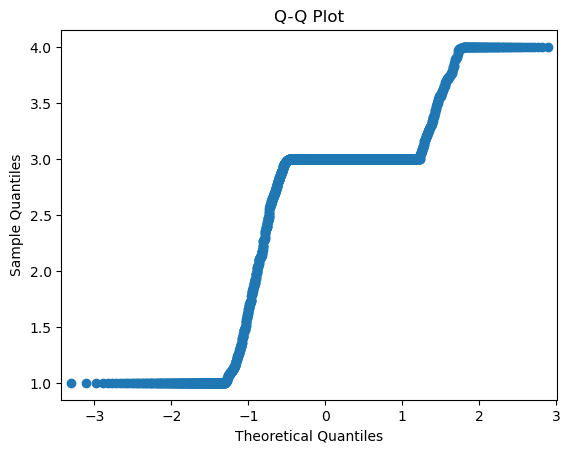

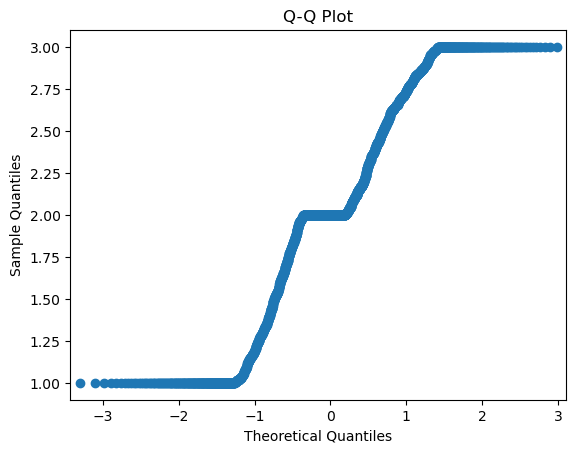

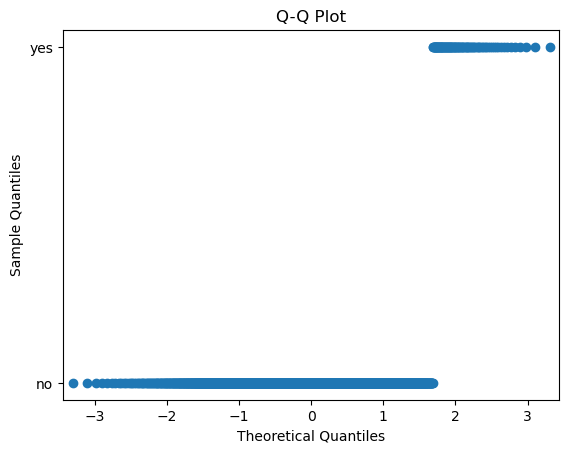

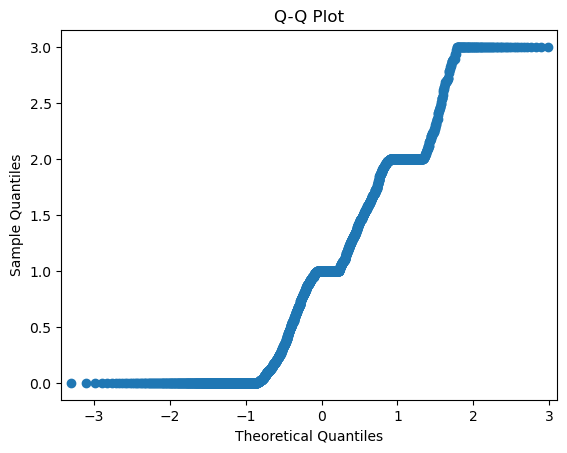

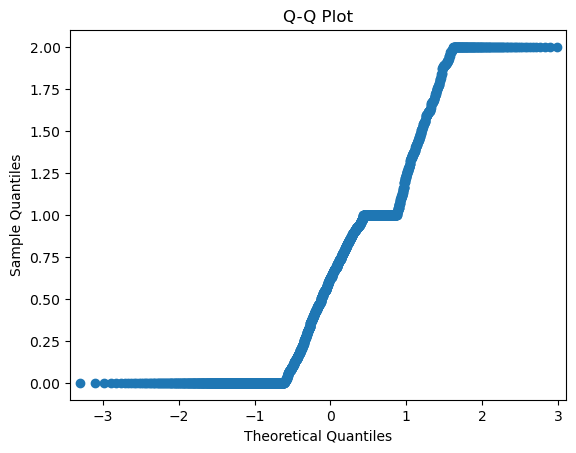

In [189]:
import statsmodels.api as sm
def check_normal(df_obese, column_name):
    sm.qqplot(df_obese[column_name])
    plt.title("Q-Q Plot")
    plt.show()

column_of_interest = ["age", "height", "weight", "fcvc", "ncp", "ch2o", "scc", "faf", "tue"]
for col in column_of_interest:
    check_normal(df_obese, col)

## Univariate analysis

Univariate analysis involves the analysis of a single variable. It is often denes as analyzing and understanding the distribution, central tendency of a single variable from the dataset. It focuses on analysing the variables in isolation one by one.

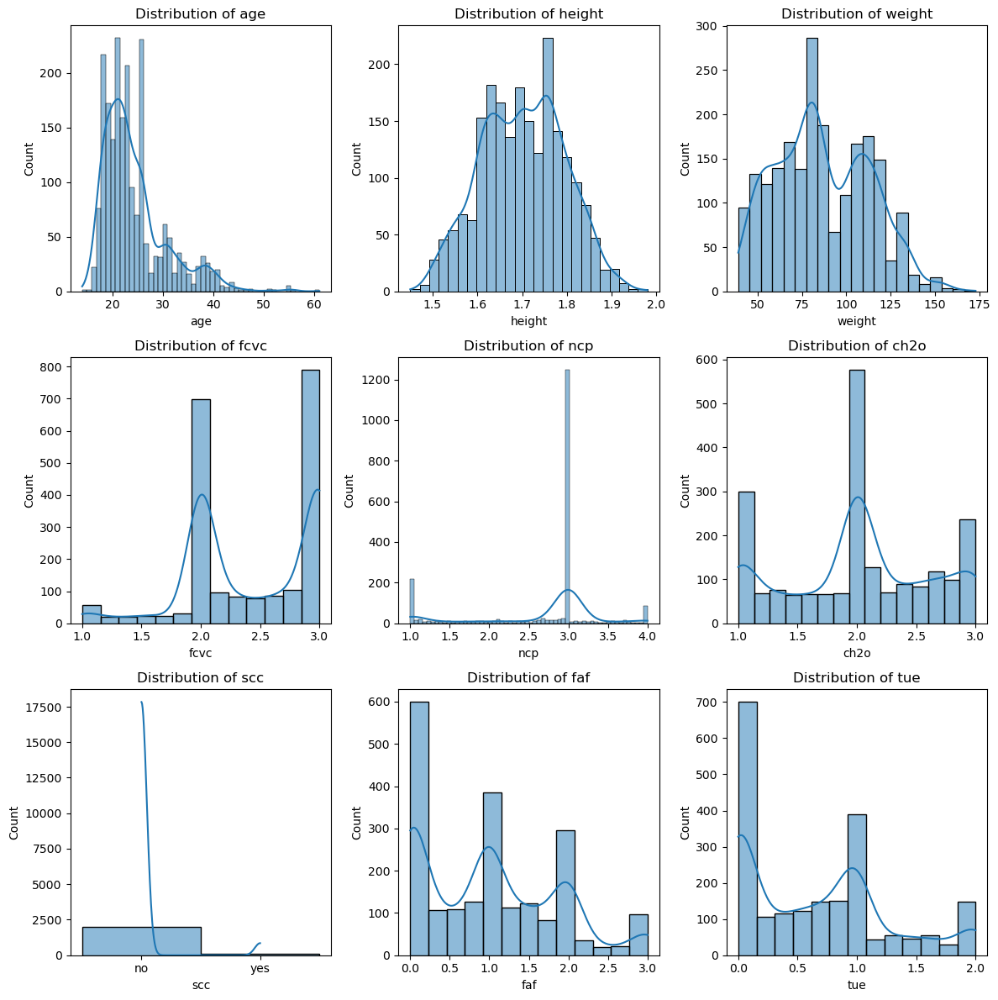

In [190]:
numeric_features = ['age', 'height', 'weight', 'fcvc', 'ncp', 'ch2o', 'scc', 'faf', 'tue']
plt.figure(figsize = (12, 12))
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df_obese[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    
plt.tight_layout()
plt.show()

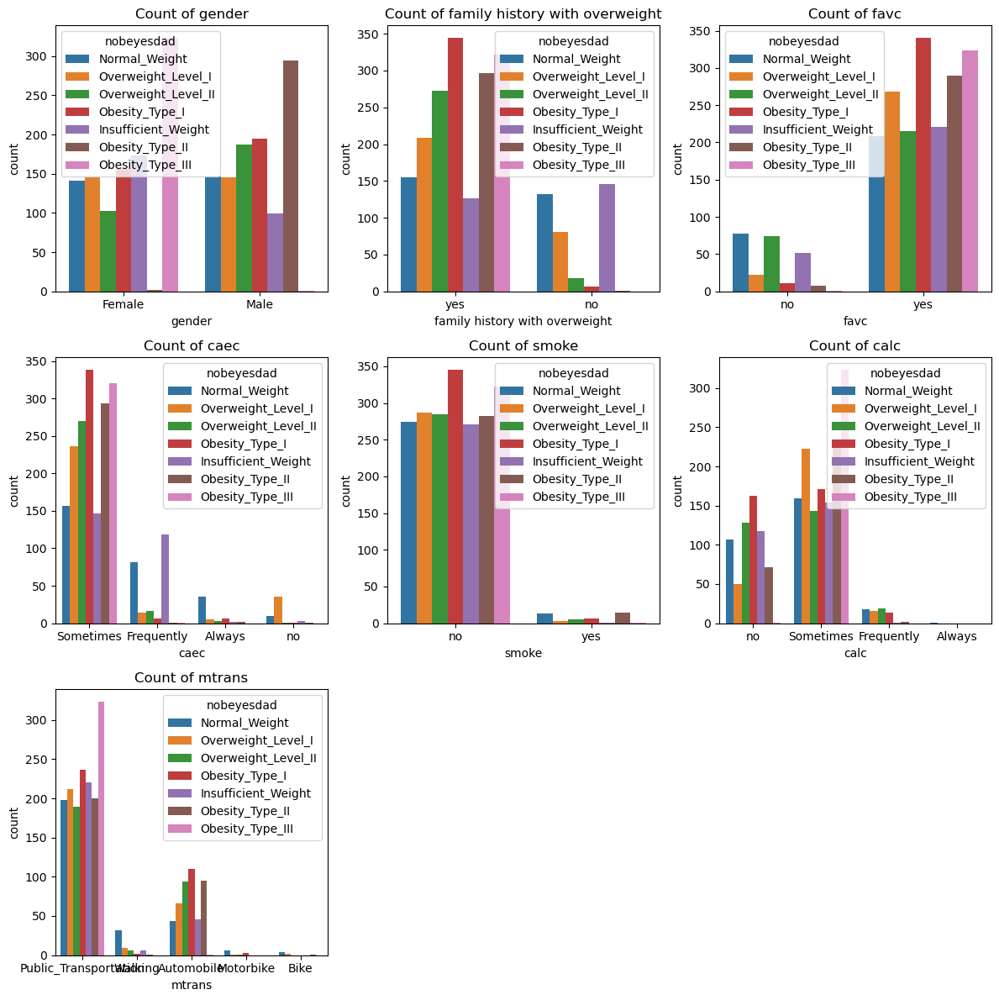

In [191]:
categorical_features = ['gender', 'family history with overweight', 'favc' , 'caec', 'smoke', 'calc', 'mtrans']

plt.figure(figsize = (12, 12))
for i, feature in enumerate(categorical_features, 1):
    plt.subplot(3, 3, i)
    sns.countplot(data = df_obese, x = feature, hue = 'nobeyesdad')
    plt.title(f"Count of {feature}")
    
plt.tight_layout()
plt.show()

## Bivariate Analysis

Bivariate analysis includes the simultanious analysis of two variables like fnding their relation, difference, and how one affect the other. It uses methods like Correlation, Covariance, Scatter Plots, etc to find the relationship between two variables

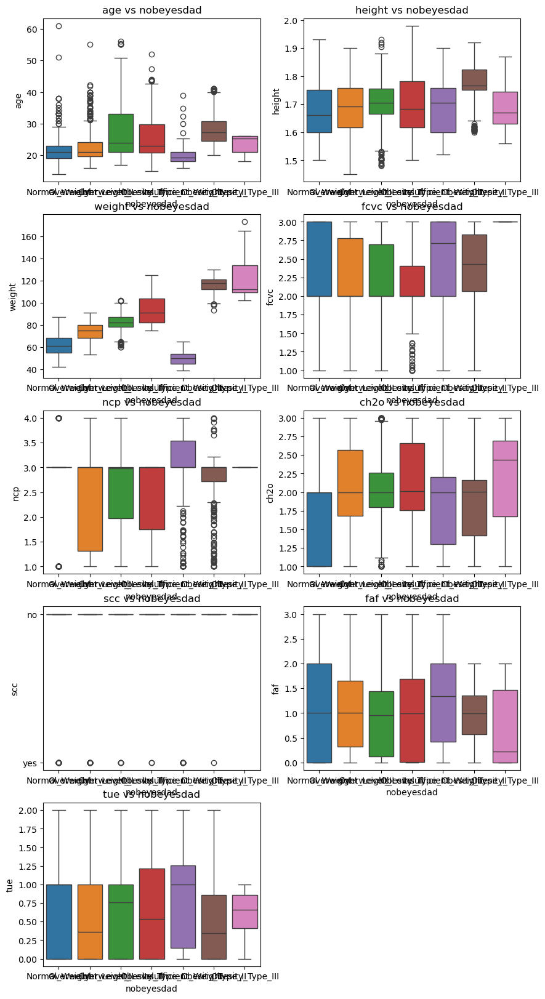

In [192]:
plt.figure(figsize=(10, 20))
numeric_features = ['age', 'height', 'weight', 'fcvc', 'ncp', 'ch2o', 'scc', 'faf', 'tue']
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(5, 2, i)
    sns.boxplot(data = df_obese, x = 'nobeyesdad', y = feature, hue='nobeyesdad')
    plt.title(f"{feature} vs nobeyesdad")

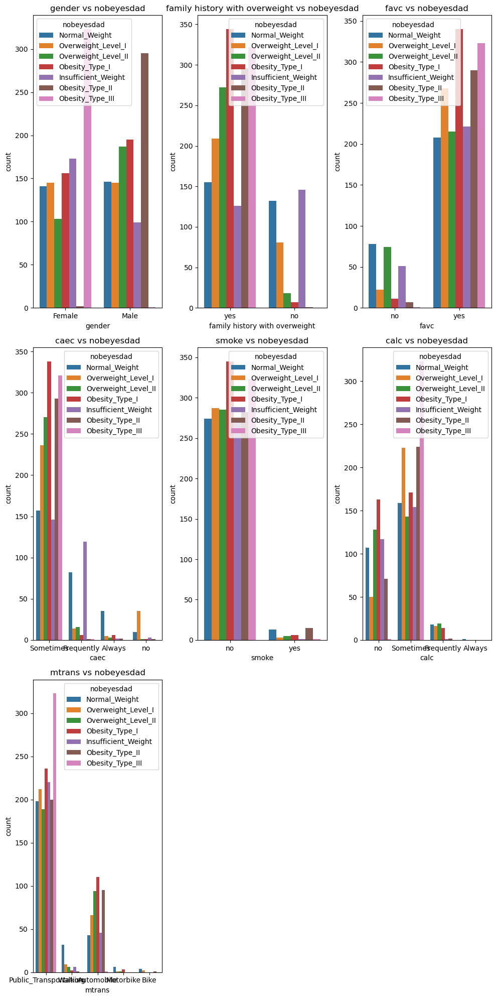

In [193]:
plt.figure(figsize=(10, 20))
categorical_features = ['gender', 'family history with overweight', 'favc' , 'caec', 'smoke', 'calc', 'mtrans']
for i, feature in enumerate(categorical_features, 1):
    plt.subplot(3, 3, i)
    sns.countplot(x = feature, hue='nobeyesdad', data = df_obese)
    plt.title(f"{feature} vs nobeyesdad")
plt.tight_layout()
plt.show()

## Multivariate Analysis

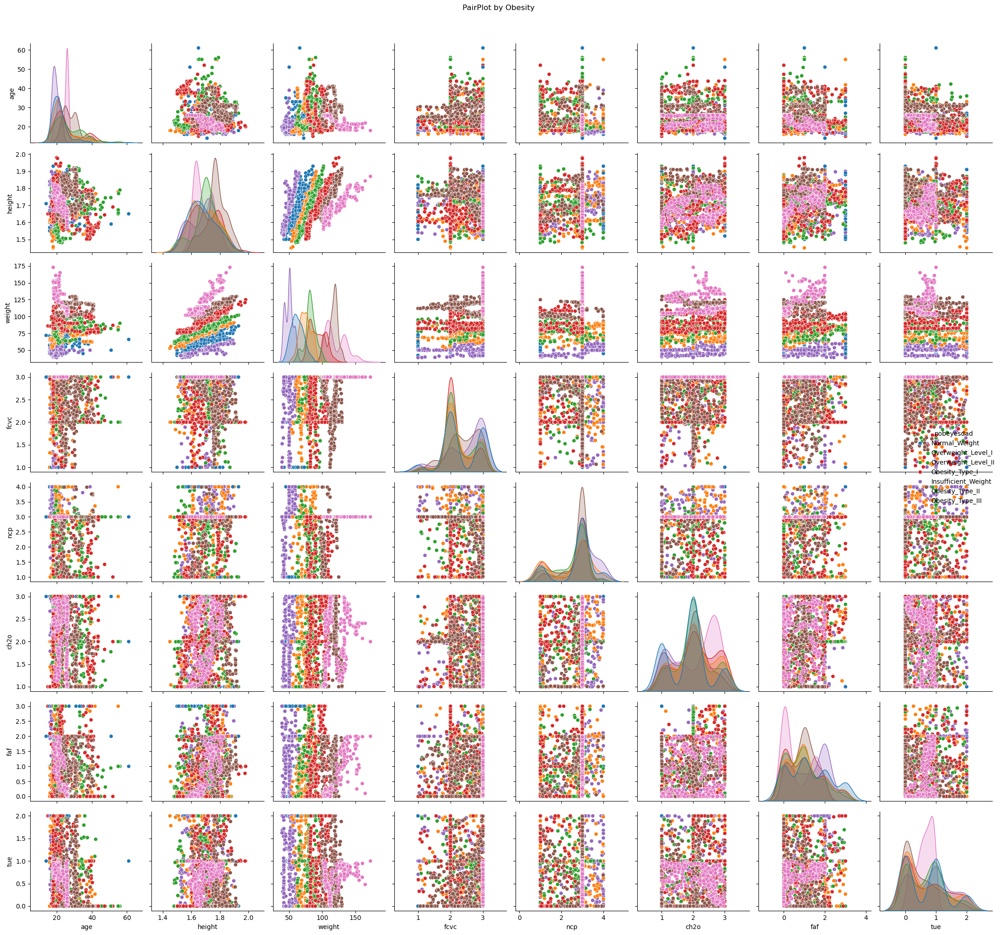

In [194]:
selected_features =  ['age', 'height', 'weight', 'fcvc', 'ncp', 'ch2o', 'scc', 'faf', 'tue', 'nobeyesdad']
sns.pairplot(df_obese[selected_features], hue='nobeyesdad', diag_kind='kde', diag_kws=dict(common_norm=False))
plt.suptitle("PairPlot by Obesity", y = 1.02)
plt.tight_layout()
plt.show()

## Data Imputation

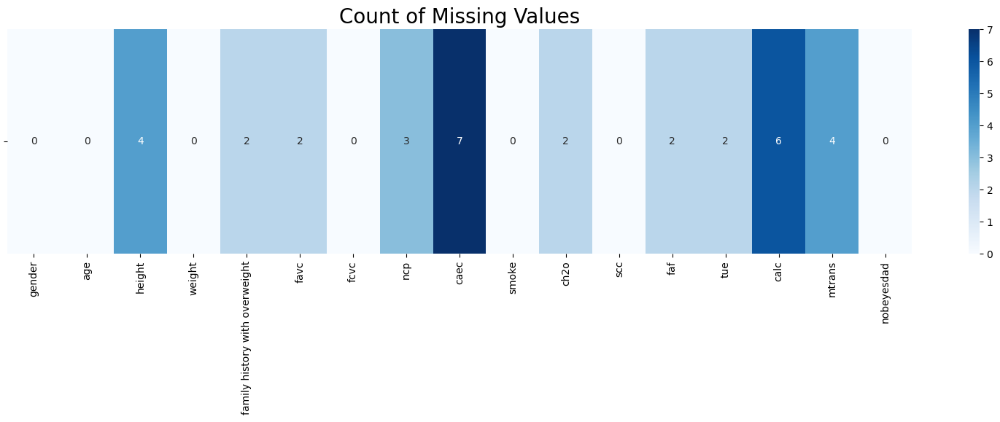

In [195]:
plt.figure(figsize=(20,4))
sns.heatmap((df_obese.isnull().sum()).to_frame(name='').T,cmap='Blues', annot=True,
             fmt='0.0f').set_title('Count of Missing Values', fontsize=20)
plt.show()

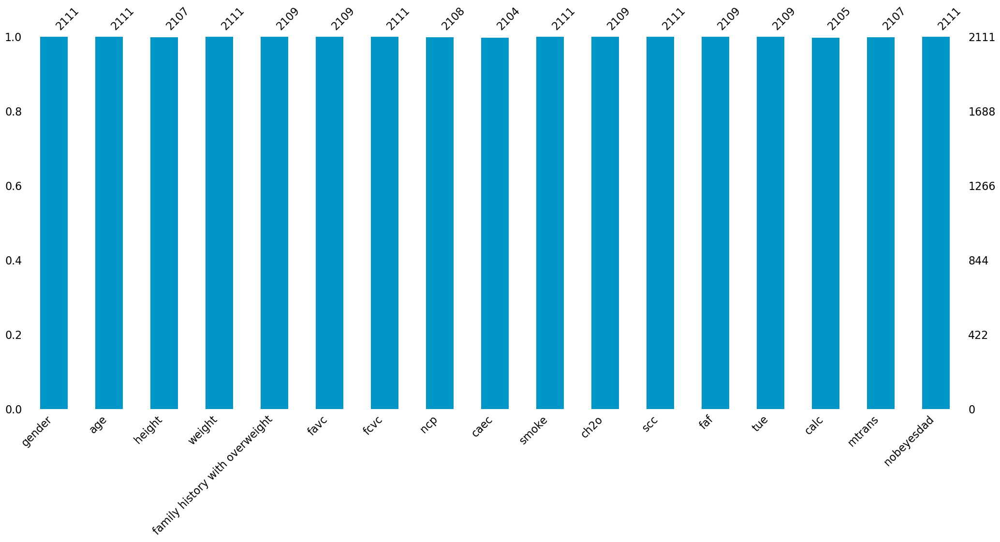

In [196]:
import missingno as msno
msno.bar(df_obese, color='#0096c7')
plt.show()

In [197]:
#Finding Unique values

In [198]:
# finding unique data
df_obese.apply(lambda x: len(x.unique()))

gender                               2
age                               1402
height                            1571
weight                            1525
family history with overweight       3
favc                                 3
fcvc                               810
ncp                                634
caec                                 5
smoke                                2
ch2o                              1267
scc                                  2
faf                               1190
tue                               1128
calc                                 5
mtrans                               6
nobeyesdad                           7
dtype: int64

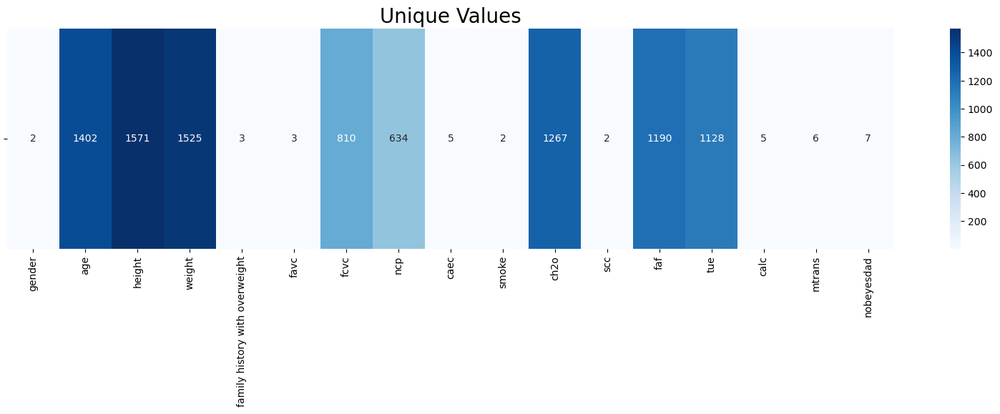

In [199]:
plt.figure(figsize=(20,4))
sns.heatmap((df_obese.apply(lambda x: len(x.unique()))).to_frame(name='').T,cmap='Blues', annot=True,
             fmt='0.0f').set_title('Unique Values', fontsize=20)
plt.show()

In [200]:
unique = df_obese.nunique().sort_values()
unique_values = df_obese.apply(lambda x: x.unique())
pd.DataFrame({'Number of Unique Values': unique, 'Unique Values': unique_values})

,Number of Unique Values,Unique Values
age,1402,"[21.0, 23.0, 27.0, 22.0, 29.0, 24.0, 26.0, 41...."
caec,4,"[Sometimes, Frequently, Always, no, nan]"
calc,4,"[no, Sometimes, Frequently, Always, nan]"
ch2o,1266,"[2.0, 3.0, 1.0, 1.152736, 1.115967, 2.704507, ..."
faf,1189,"[0.0, 3.0, 2.0, 1.0, 0.319156, 1.541072, 1.978..."
family history with overweight,2,"[yes, no, nan]"
favc,2,"[no, yes, nan]"
fcvc,810,"[2.0, 3.0, 1.0, 2.450218, 2.880161, 2.00876, 2..."
gender,2,"[Female, Male]"
height,1570,"[1.62, 1.52, 1.8, 1.78, 1.5, 1.64, 1.72, 1.85,..."


## Remove duplicate rows

In [201]:
print('Number of duplicated rows: ' , len(df_obese[df_obese.duplicated()]))

Number of duplicated rows:  24


In [202]:
df_obese = df_obese.drop_duplicates(ignore_index=True)

In [203]:
df_obese.describe().style.background_gradient(cmap='Blues', axis=1)

,age,height,weight,fcvc,ncp,ch2o,faf,tue
count,2087.000000,2083.000000,2087.000000,2087.000000,2084.000000,2085.000000,2085.000000,2085.000000
mean,24.353090,1.702458,86.858730,2.421466,2.701349,2.005108,1.012057,0.662078
std,6.368801,0.093123,26.190847,0.534737,0.765070,0.608465,0.853513,0.607653
min,14.000000,1.450000,39.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,19.915937,1.630000,66.000000,2.000000,2.700862,1.590418,0.121585,0.000000
50%,22.847618,1.701413,83.101100,2.396265,3.000000,2.000000,1.000000,0.630866
75%,26.000000,1.769299,108.015907,3.000000,3.000000,2.469469,1.676269,1.000000
max,61.000000,1.980000,173.000000,3.000000,4.000000,3.000000,3.000000,2.000000


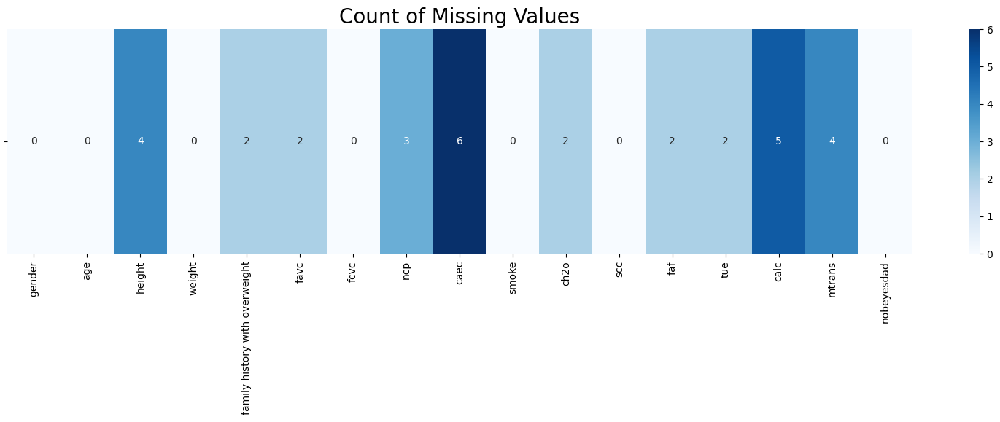

In [204]:
plt.figure(figsize=(20,4))
sns.heatmap((df_obese.isnull().sum()).to_frame(name='').T,cmap='Blues', annot=True,
             fmt='0.0f').set_title('Count of Missing Values', fontsize=20)
plt.show()

## Data Imputation

In [205]:
# Imputing missing numeric values

In [206]:
df_obese.columns

Index(['gender', 'age', 'height', 'weight', 'family history with overweight',
       'favc', 'fcvc', 'ncp', 'caec', 'smoke', 'ch2o', 'scc', 'faf', 'tue',
       'calc', 'mtrans', 'nobeyesdad'],
      dtype='object')

In [207]:
df_numeric = df_obese.select_dtypes(include='number')

In [208]:
numeric_cols = df_numeric.columns

In [209]:
numeric_cols

Index(['age', 'height', 'weight', 'fcvc', 'ncp', 'ch2o', 'faf', 'tue'], dtype='object')

In [210]:
from sklearn.impute import SimpleImputer

In [211]:
def handle_missing_values_numeric(df):
    imputer = SimpleImputer(strategy='mean')
    df_obese[['age', 'height', 'weight', 'fcvc', 'ncp', 'ch2o', 'faf', 'tue']] = imputer.fit_transform(df_obese[['age', 'height', 'weight', 'fcvc', 'ncp', 'ch2o', 'faf', 'tue']])
    return df

In [212]:
df_obese = handle_missing_values_numeric(df_obese)

In [213]:
df_obese.isna().sum()

gender                            0
age                               0
height                            0
weight                            0
family history with overweight    2
favc                              2
fcvc                              0
ncp                               0
caec                              6
smoke                             0
ch2o                              0
scc                               0
faf                               0
tue                               0
calc                              5
mtrans                            4
nobeyesdad                        0
dtype: int64

In [214]:
# Imputing missing Categorical values

In [215]:
df_categorical_columns = df_obese.select_dtypes(exclude='number').columns

In [216]:
cat_cols = df_categorical_columns

In [217]:
cat_cols

Index(['gender', 'family history with overweight', 'favc', 'caec', 'smoke',
       'scc', 'calc', 'mtrans', 'nobeyesdad'],
      dtype='object')

In [218]:
def handle_missing_values_categorical(df):
    imputer = SimpleImputer(strategy='most_frequent')
    df_obese[['gender', 'family history with overweight', 'favc', 'caec', 'smoke',
       'scc', 'calc', 'mtrans', 'nobeyesdad']] = imputer.fit_transform(df_obese[['gender', 'family history with overweight', 'favc', 'caec', 'smoke',
       'scc', 'calc', 'mtrans', 'nobeyesdad']])
    return df

In [219]:
df_obese = handle_missing_values_categorical(df_obese)

In [220]:
df_obese.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2087 entries, 0 to 2086
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   gender                          2087 non-null   object 
 1   age                             2087 non-null   float64
 2   height                          2087 non-null   float64
 3   weight                          2087 non-null   float64
 4   family history with overweight  2087 non-null   object 
 5   favc                            2087 non-null   object 
 6   fcvc                            2087 non-null   float64
 7   ncp                             2087 non-null   float64
 8   caec                            2087 non-null   object 
 9   smoke                           2087 non-null   object 
 10  ch2o                            2087 non-null   float64
 11  scc                             2087 non-null   object 
 12  faf                             20

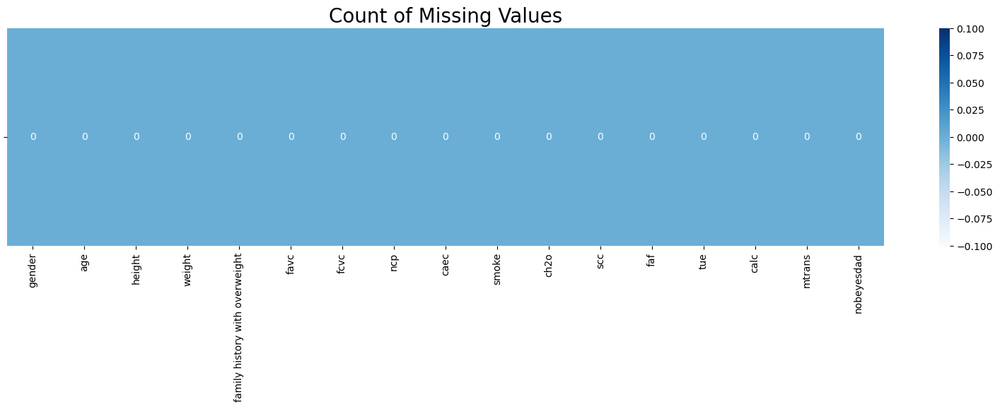

In [221]:
plt.figure(figsize=(20,4))
sns.heatmap((df_obese.isnull().sum()).to_frame(name='').T,cmap='Blues', annot=True,
             fmt='0.0f').set_title('Count of Missing Values', fontsize=20)
plt.show()

In [222]:
# finding unique data
df_obese.apply(lambda x: len(x.unique()))

gender                               2
age                               1402
height                            1571
weight                            1525
family history with overweight       2
favc                                 2
fcvc                               810
ncp                                634
caec                                 4
smoke                                2
ch2o                              1267
scc                                  2
faf                               1190
tue                               1128
calc                                 4
mtrans                               5
nobeyesdad                           7
dtype: int64

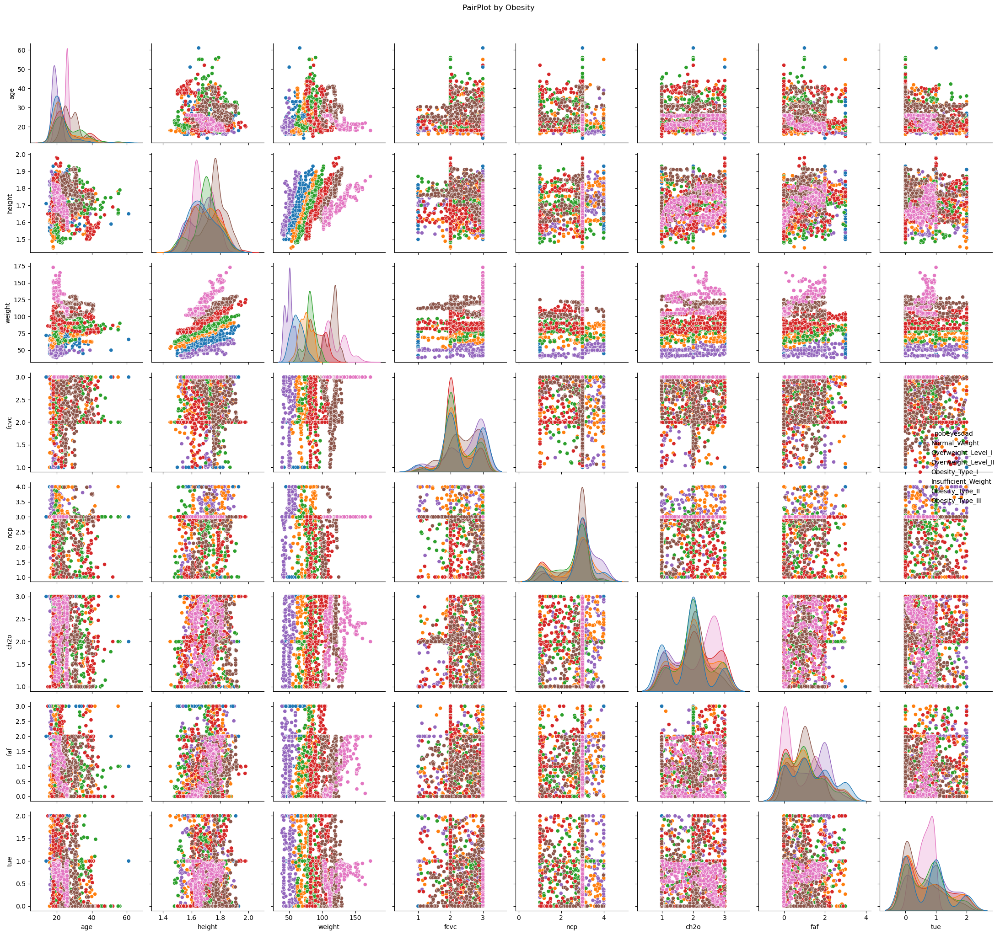

In [223]:
selected_features =  ['age', 'height', 'weight', 'fcvc', 'ncp', 'ch2o', 'scc', 'faf', 'tue', 'nobeyesdad']
sns.pairplot(df_obese[selected_features], hue='nobeyesdad', diag_kind='kde', diag_kws=dict(common_norm=False))
plt.suptitle("PairPlot by Obesity", y = 1.02)
plt.tight_layout()
plt.show()

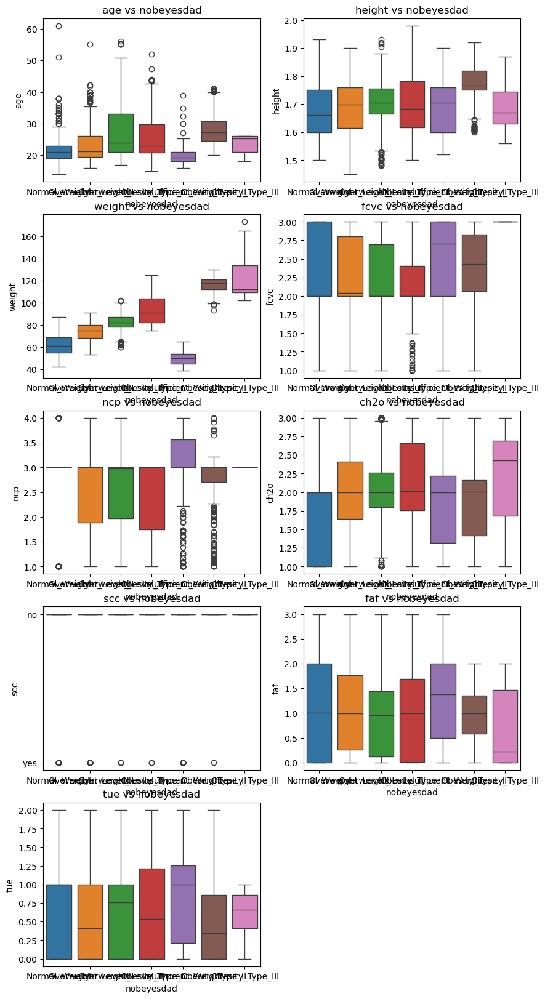

In [224]:
plt.figure(figsize=(10, 20))
numeric_features = ['age', 'height', 'weight', 'fcvc', 'ncp', 'ch2o', 'scc', 'faf', 'tue']
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(5, 2, i)
    sns.boxplot(data = df_obese, x = 'nobeyesdad', y = feature, hue='nobeyesdad')
    plt.title(f"{feature} vs nobeyesdad")

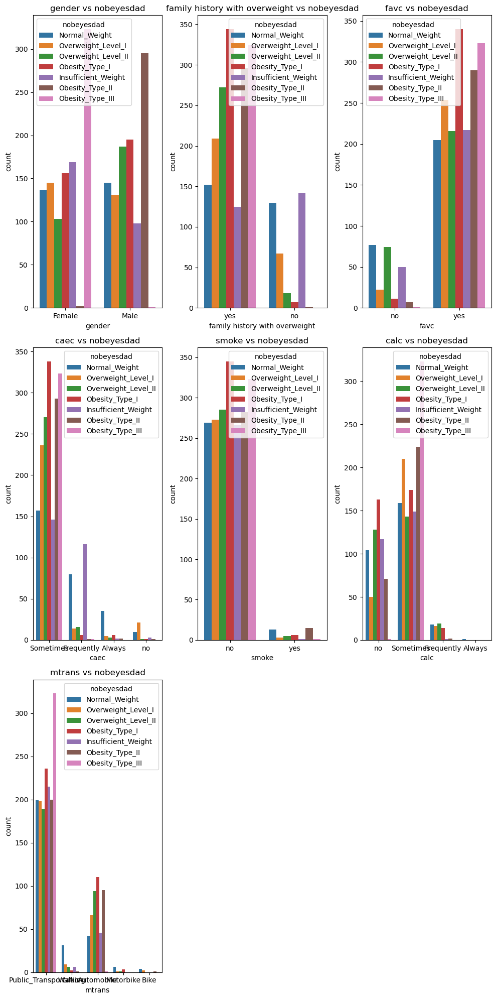

In [225]:
plt.figure(figsize=(10, 20))
categorical_features = ['gender', 'family history with overweight', 'favc' , 'caec', 'smoke', 'calc', 'mtrans']
for i, feature in enumerate(categorical_features, 1):
    plt.subplot(3, 3, i)
    sns.countplot(x = feature, hue='nobeyesdad', data = df_obese)
    plt.title(f"{feature} vs nobeyesdad")
plt.tight_layout()
plt.show()

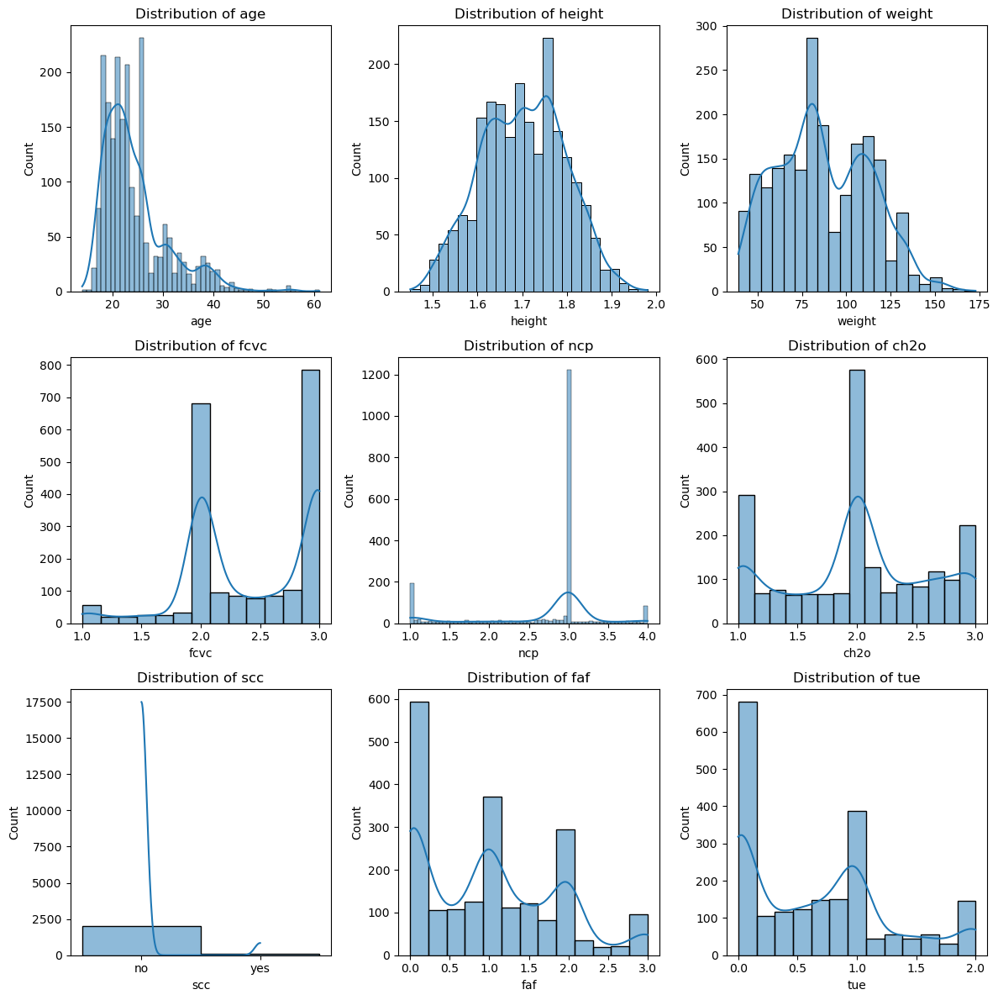

In [226]:
numeric_features = ['age', 'height', 'weight', 'fcvc', 'ncp', 'ch2o', 'scc', 'faf', 'tue']
plt.figure(figsize = (12, 12))
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df_obese[feature], kde=True)
    plt.title(f'Distribution of {feature}')
    
plt.tight_layout()
plt.show()

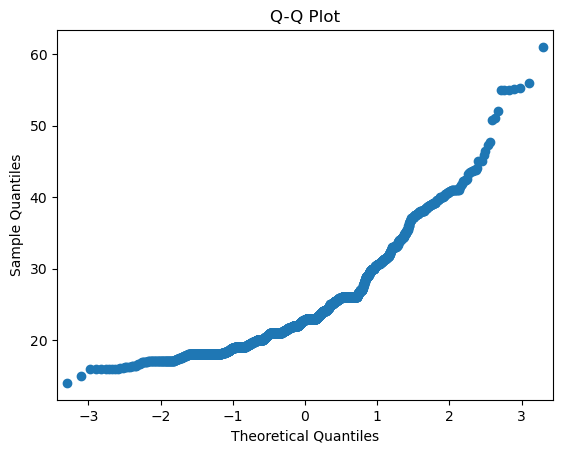

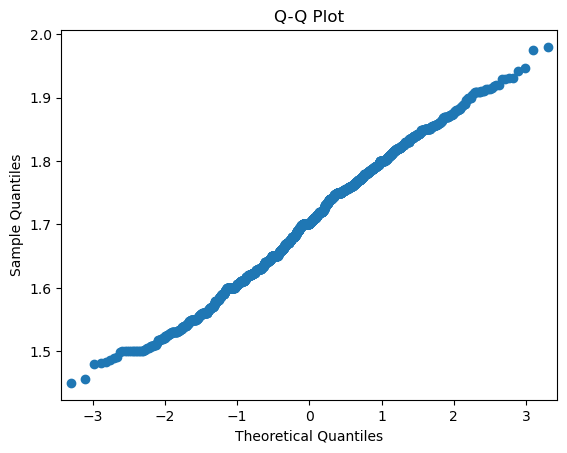

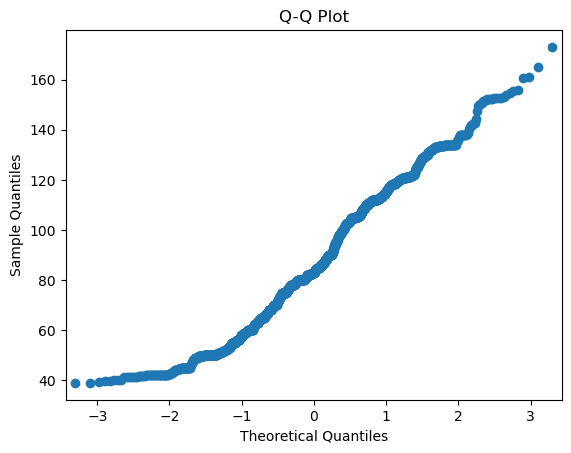

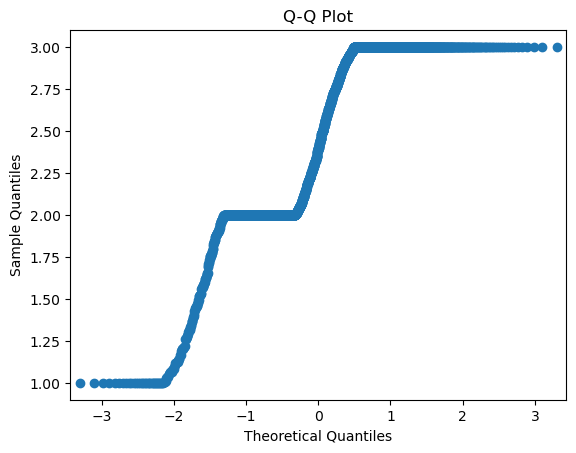

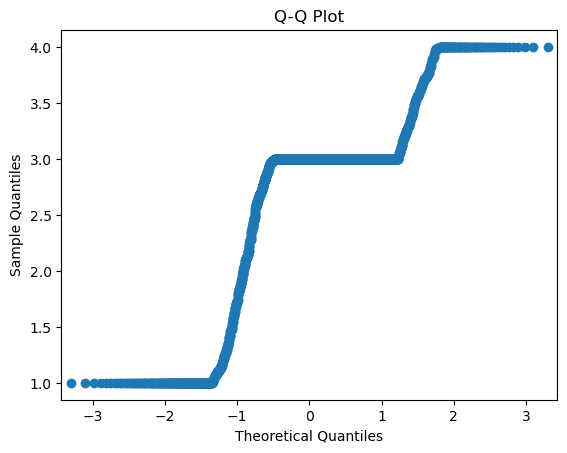

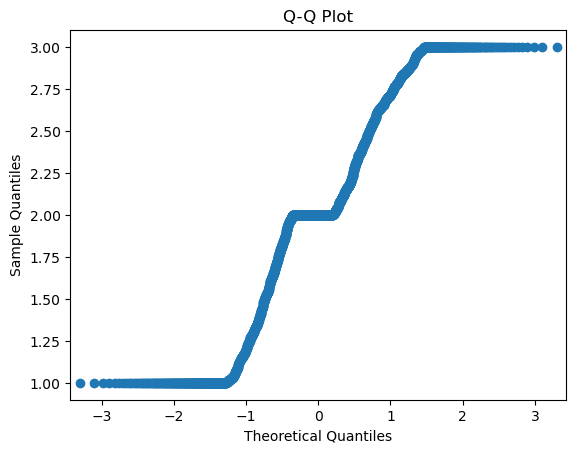

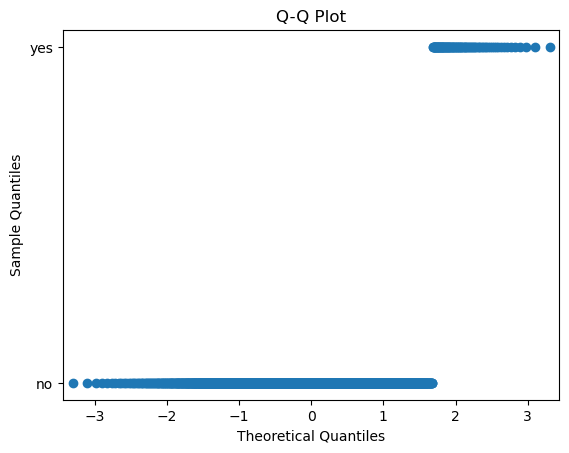

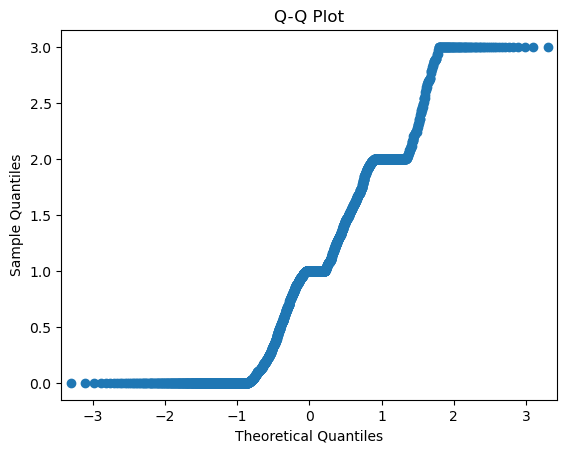

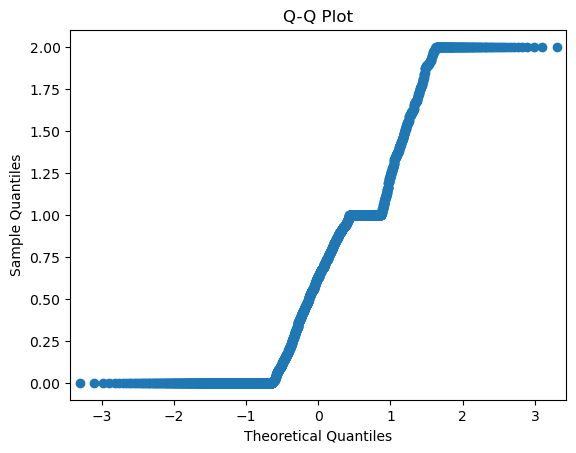

In [227]:
import statsmodels.api as sm
def check_normal(df_obese, column_name):
    sm.qqplot(df_obese[column_name])
    plt.title("Q-Q Plot")
    plt.show()

column_of_interest = ["age", "height", "weight", "fcvc", "ncp", "ch2o", "scc", "faf", "tue"]
for col in column_of_interest:
    check_normal(df_obese, col)

In [228]:
corr_matrix = df_obese[['age', 'height', 'weight', 'fcvc', 'ncp', 'ch2o', 'faf', 'tue']].corr()
corr_matrix

,age,height,weight,fcvc,ncp,ch2o,faf,tue
age,1.000000,-0.032732,0.198160,0.013572,-0.055408,-0.044343,-0.148215,-0.304103
height,-0.032732,1.000000,0.455411,-0.040476,0.227042,0.218501,0.293361,0.040783
weight,0.198160,0.455411,1.000000,0.216574,0.092205,0.204901,-0.057608,-0.081040
fcvc,0.013572,-0.040476,0.216574,1.000000,0.035590,0.081985,0.022044,-0.103795
ncp,-0.055408,0.227042,0.092205,0.035590,1.000000,0.074913,0.127871,0.014988
ch2o,-0.044343,0.218501,0.204901,0.081985,0.074913,1.000000,0.165097,0.020690
faf,-0.148215,0.293361,-0.057608,0.022044,0.127871,0.165097,1.000000,0.060249
tue,-0.304103,0.040783,-0.081040,-0.103795,0.014988,0.020690,0.060249,1.000000


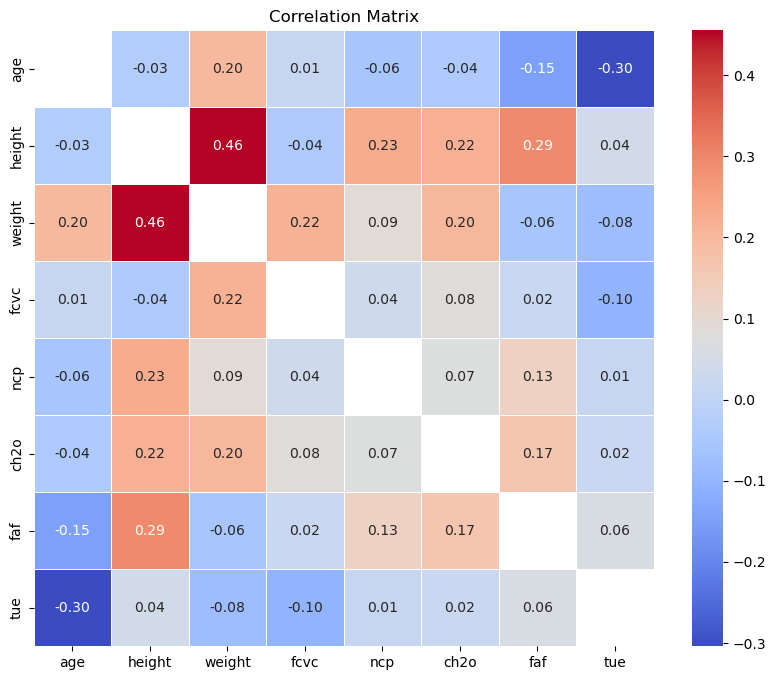

In [233]:
plt.figure(figsize = (10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

In [234]:
np.fill_diagonal(corr_matrix.values, np.nan)
print("Maximum Correlation:", corr_matrix.max().max())
print("Minimum Correlation:", corr_matrix.min().min())

Maximum Correlation: 0.4554109428632952
Minimum Correlation: -0.30410314683489514


<Axes: >

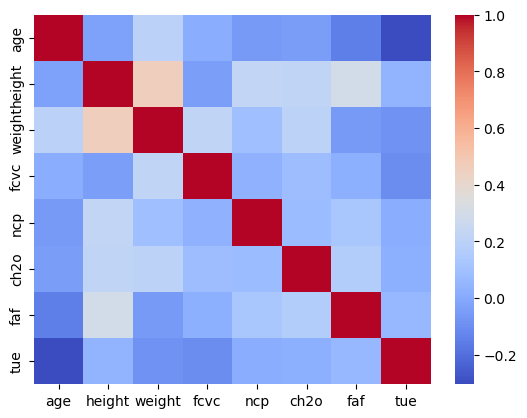

In [235]:
sns.heatmap(data=df_obese[['age', 'height', 'weight', 'fcvc', 'ncp', 'ch2o', 'faf', 'tue']].corr(), cmap='coolwarm')
#Blue represnts negative relationship and red represents positive

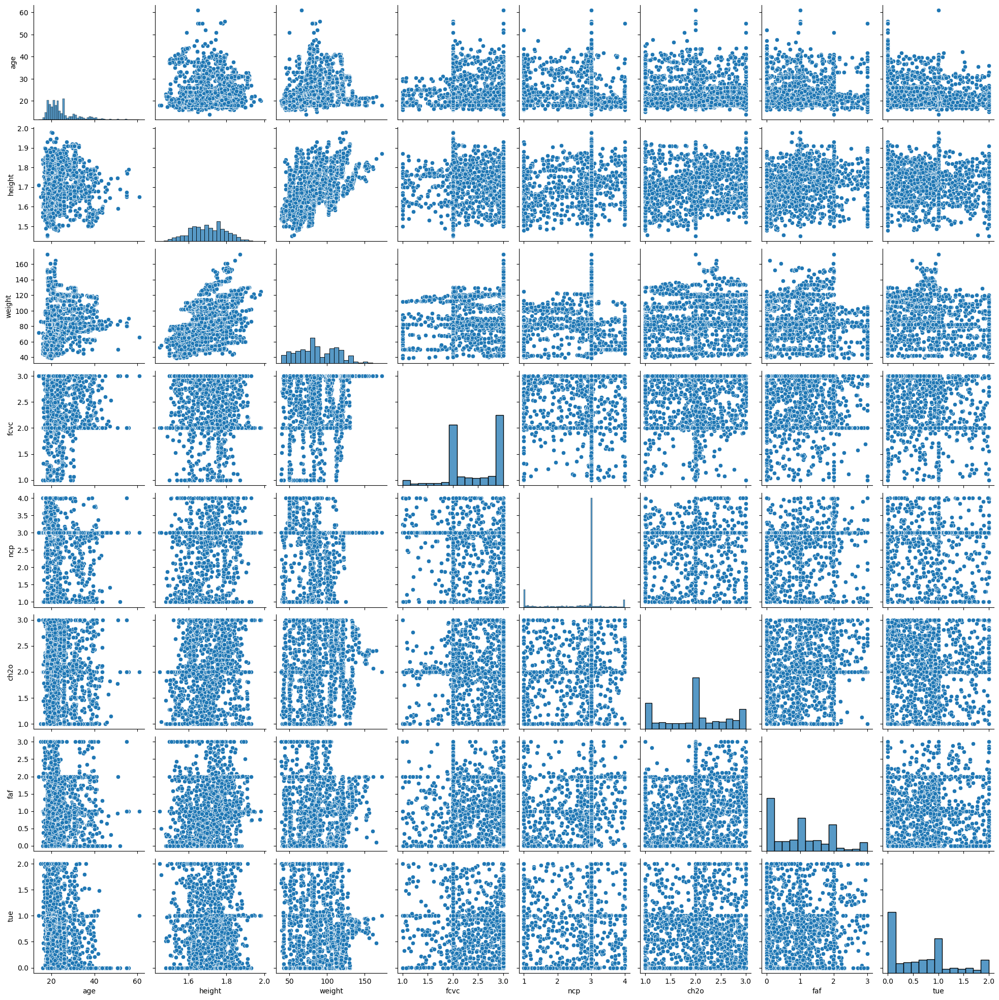

In [236]:
sns.pairplot(data=df_obese) #For numeric features

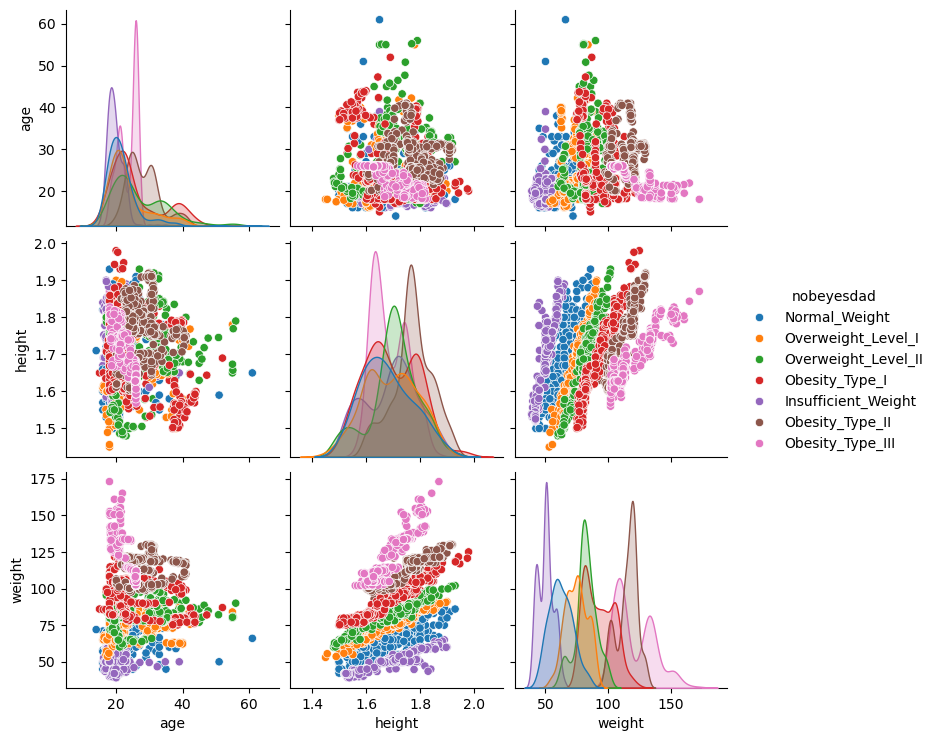

In [237]:
sns.pairplot(data=df_obese[['age', 'height', 'weight','nobeyesdad']],hue='nobeyesdad')

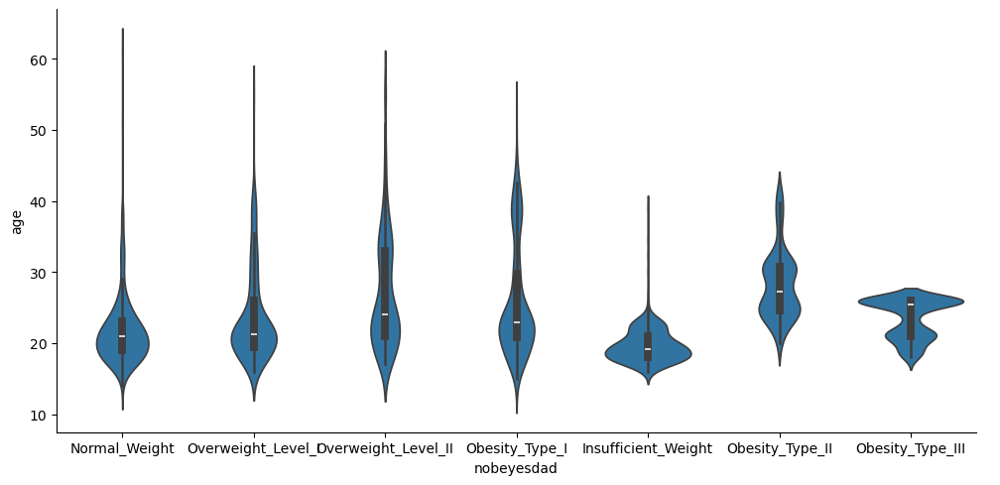

In [238]:
sns.catplot(data=df_obese,x='nobeyesdad',y='age', kind='violin', aspect=2)
#Quartle values are shown in box

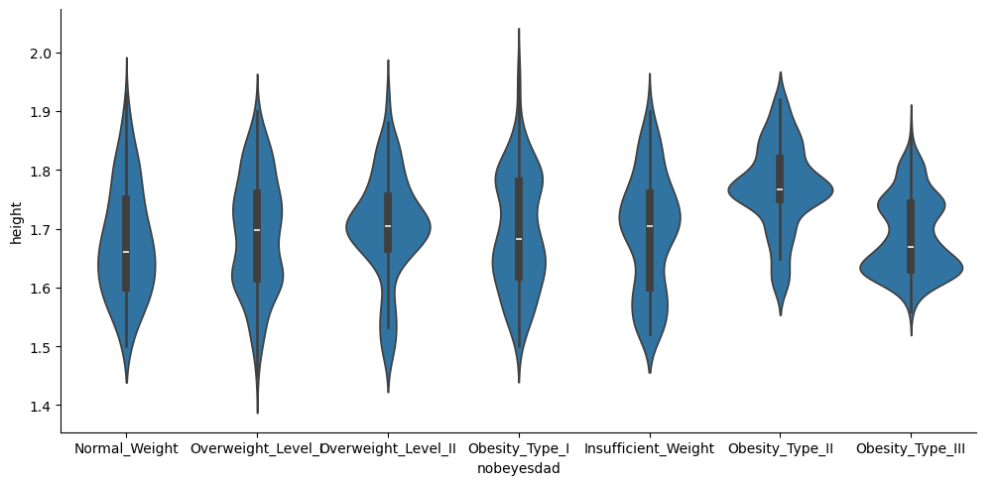

In [239]:
sns.catplot(data=df_obese,x='nobeyesdad',y='height', kind='violin', aspect=2)
#Quartle values are shown in box

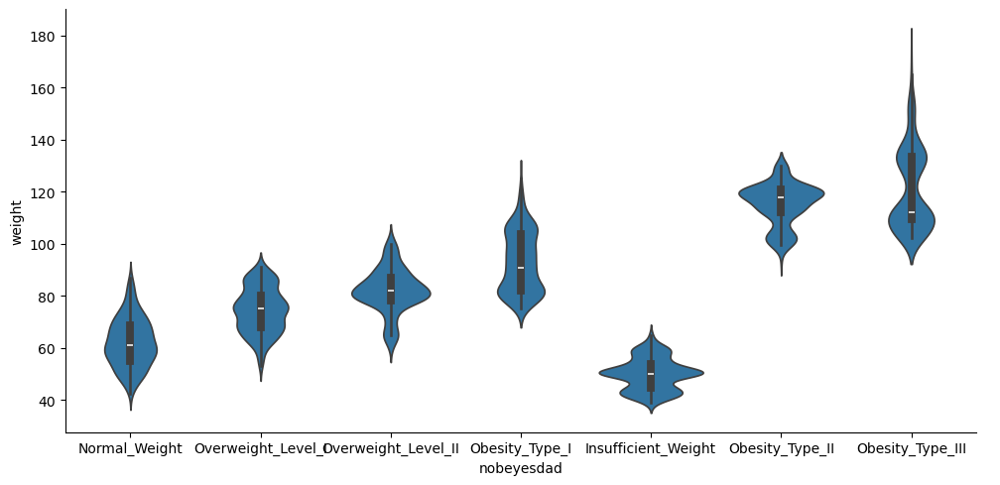

In [240]:
sns.catplot(data=df_obese,x='nobeyesdad',y='weight', kind='violin', aspect=2)
#Quartle values are shown in box

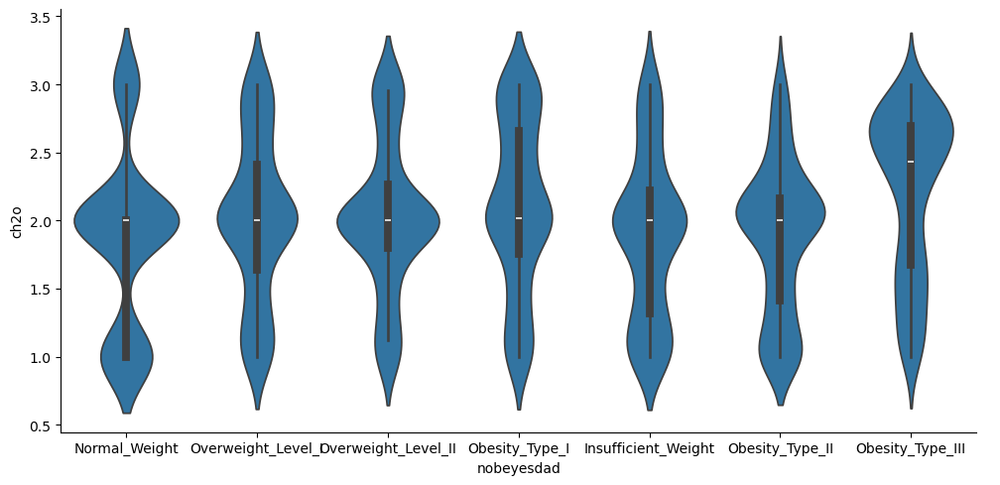

In [241]:
sns.catplot(data=df_obese,x='nobeyesdad',y='ch2o', kind='violin', aspect=2)
#Quartle values are shown in box

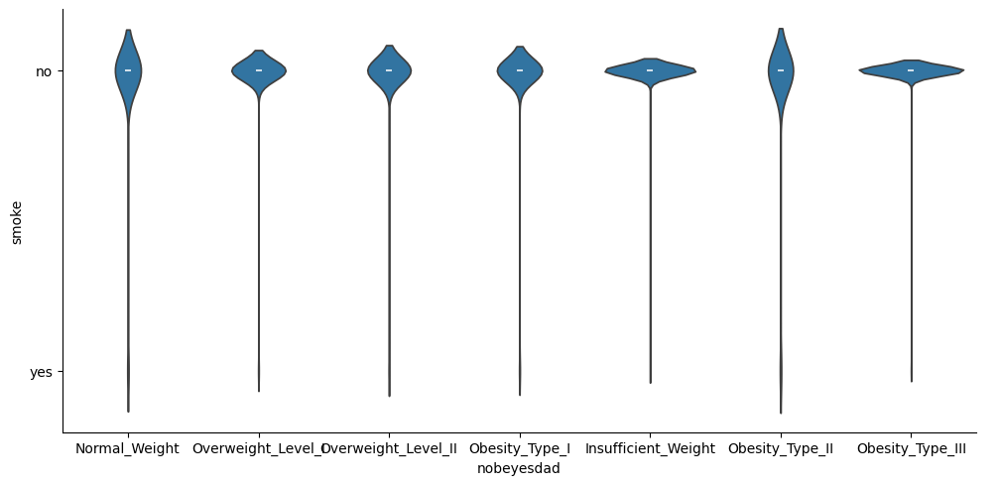

In [242]:
sns.catplot(data=df_obese,x='nobeyesdad',y='smoke', kind='violin', aspect=2)
#Quartle values are shown in box

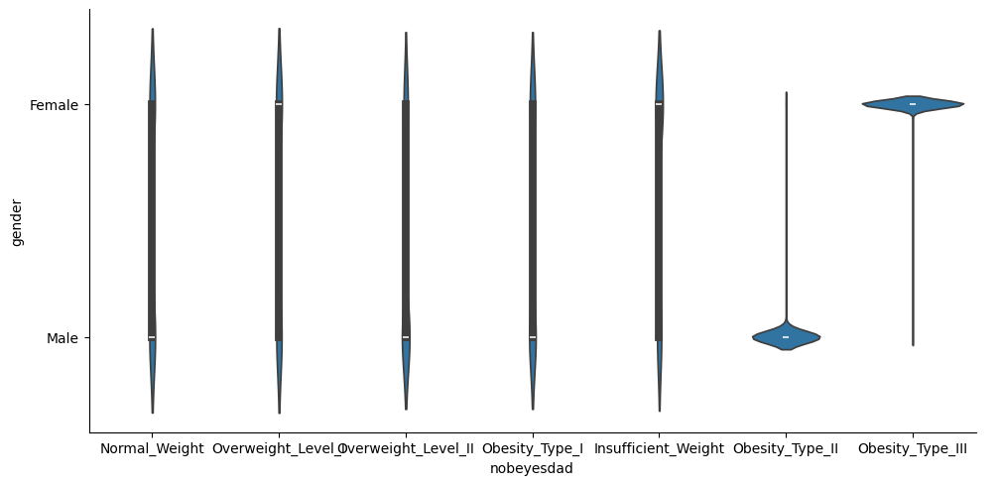

In [243]:
sns.catplot(data=df_obese,x='nobeyesdad',y='gender', kind='violin', aspect=2)
#Quartle values are shown in box

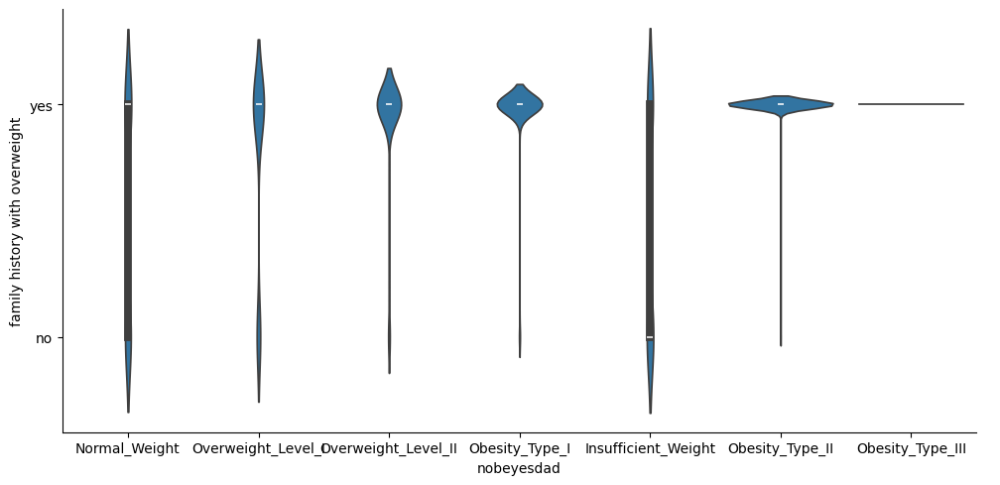

In [244]:
sns.catplot(data=df_obese,x='nobeyesdad',y='family history with overweight', kind='violin', aspect=2)
#Quartle values are shown in box

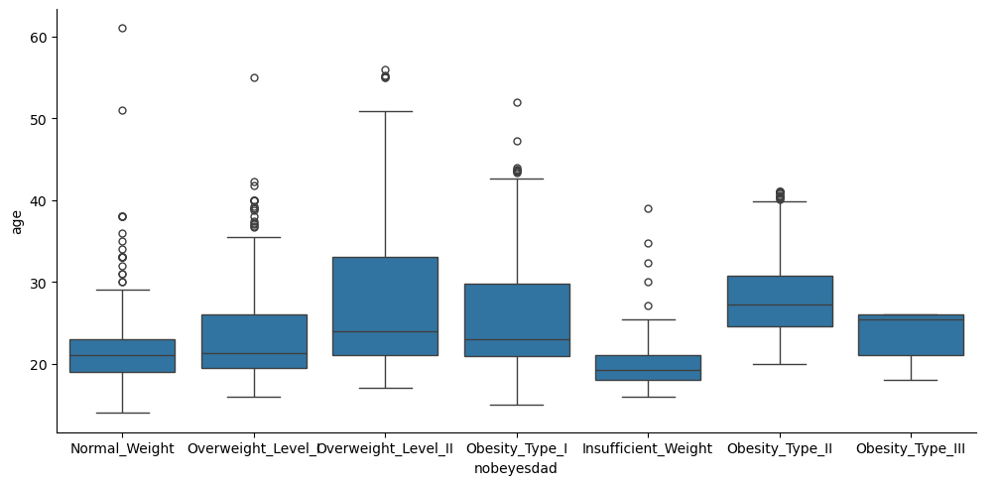

In [245]:
sns.catplot(data=df_obese,x='nobeyesdad',y='age', kind='box', aspect=2)
#Box information about the quartiles

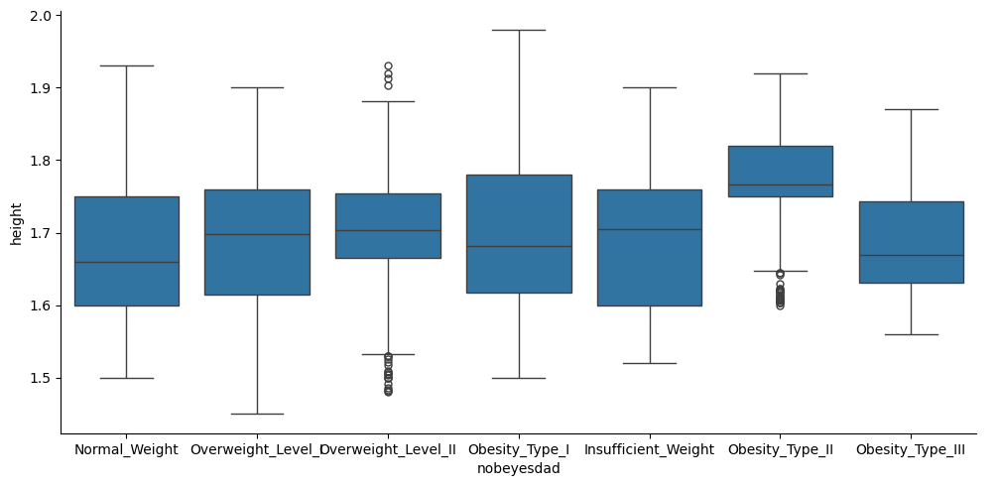

In [246]:
sns.catplot(data=df_obese,x='nobeyesdad',y='height', kind='box', aspect=2)
#Box information about the quartiles

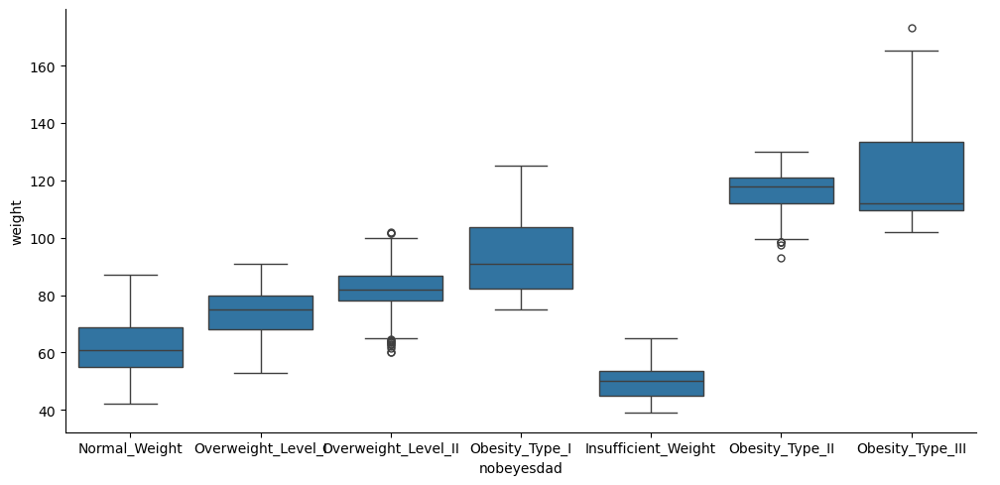

In [247]:
sns.catplot(data=df_obese,x='nobeyesdad',y='weight', kind='box', aspect=2)
#Box information about the quartiles

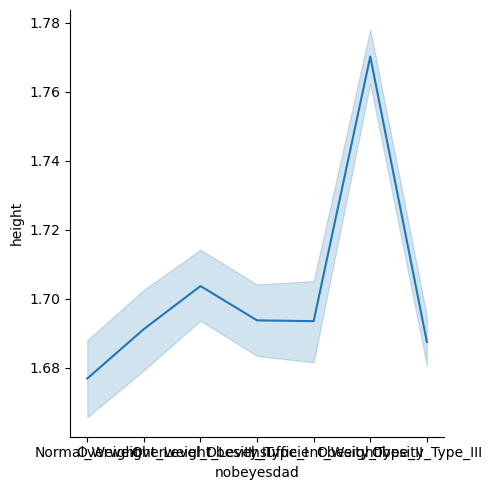

In [248]:
sns.relplot(data=df_obese, x='nobeyesdad', y='height', kind='line')

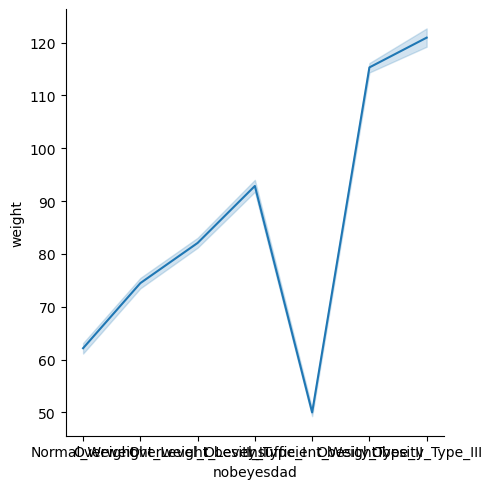

In [249]:
sns.relplot(data=df_obese, x='nobeyesdad', y='weight', kind='line')

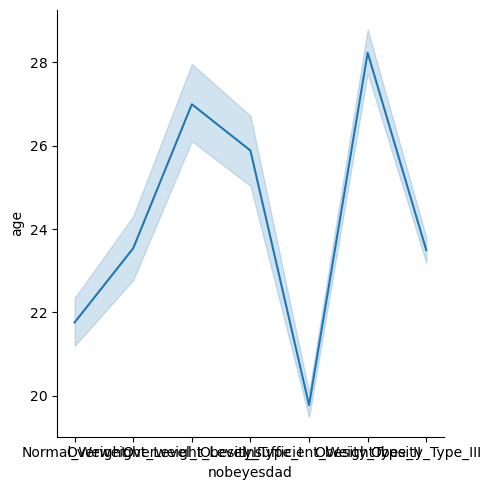

In [250]:
sns.relplot(data=df_obese, x='nobeyesdad', y='age', kind='line')

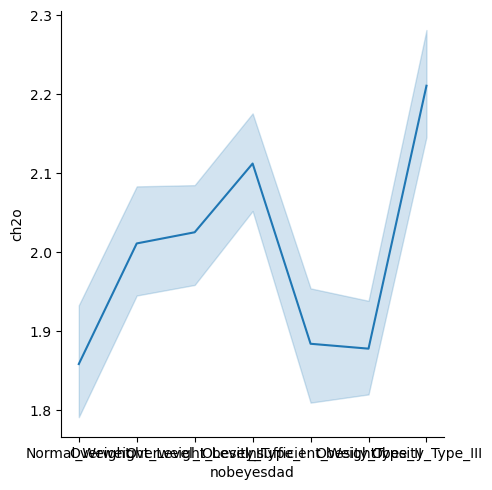

In [251]:
sns.relplot(data=df_obese, x='nobeyesdad', y='ch2o', kind='line')

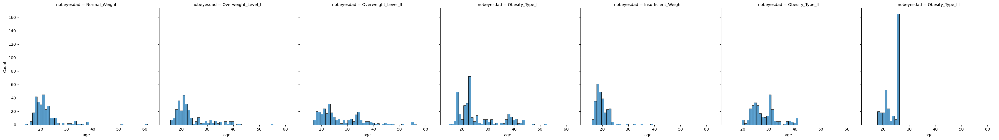

In [252]:
sns.displot(data=df_obese,x='age',col='nobeyesdad') #Plot separately in each column

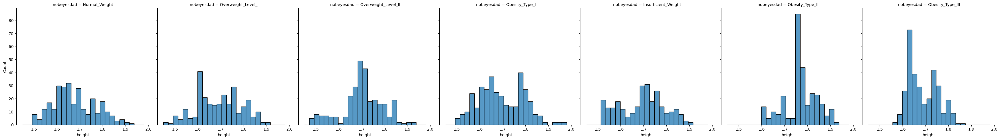

In [253]:
sns.displot(data=df_obese,x='height',col='nobeyesdad') #Plot separately in each column

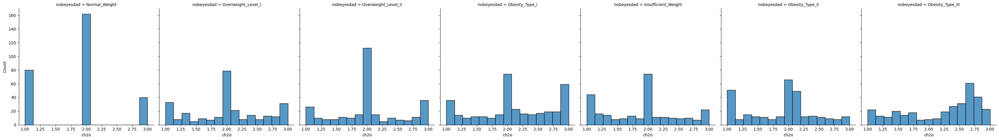

In [254]:
sns.displot(data=df_obese,x='ch2o',col='nobeyesdad') #Plot separately in each column

array([[<Axes: title={'center': 'age'}>,
        <Axes: title={'center': 'height'}>,
        <Axes: title={'center': 'weight'}>],
       [<Axes: title={'center': 'fcvc'}>,
        <Axes: title={'center': 'ncp'}>,
        <Axes: title={'center': 'ch2o'}>],
       [<Axes: title={'center': 'faf'}>, <Axes: title={'center': 'tue'}>,
        <Axes: >]], dtype=object)

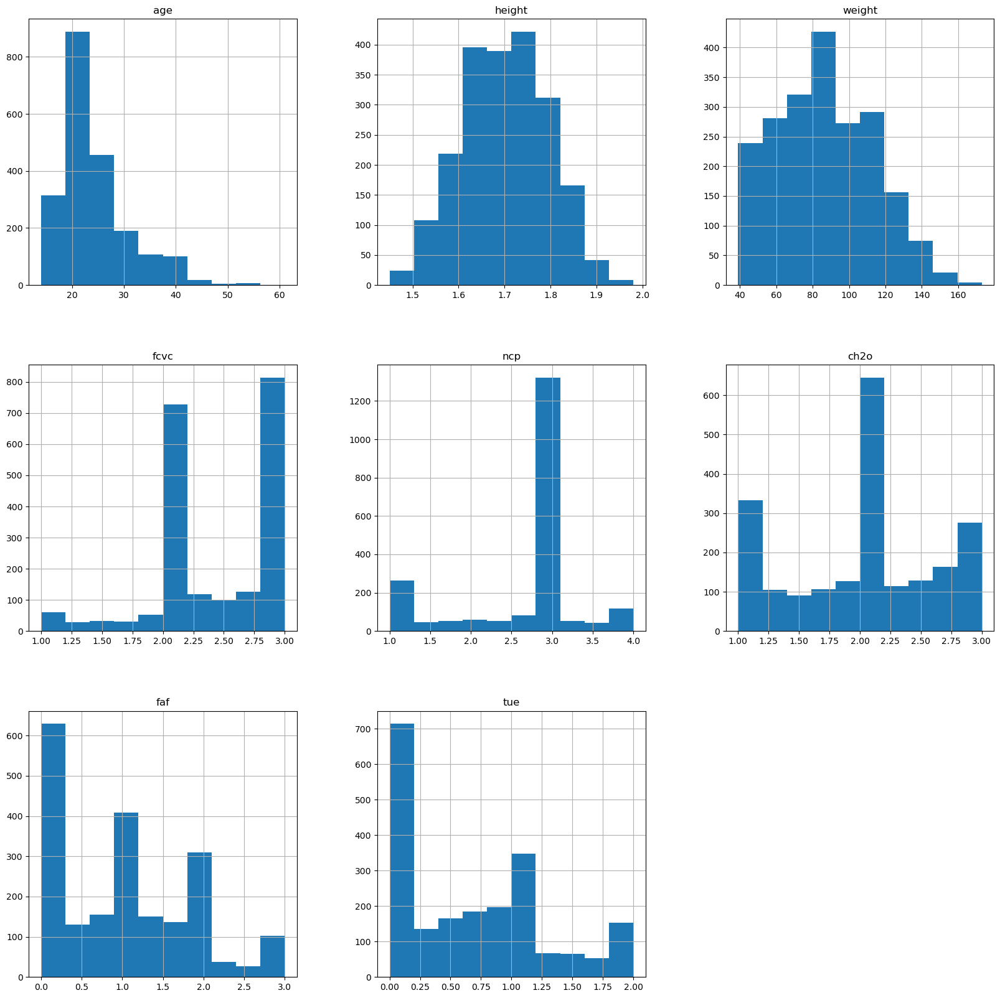

In [255]:
df_obese.hist(figsize=(20,20))
#x-axis shows the bin and inter rows of population
#y-axis shows the count of values that falls each bin in rows

<Axes: >

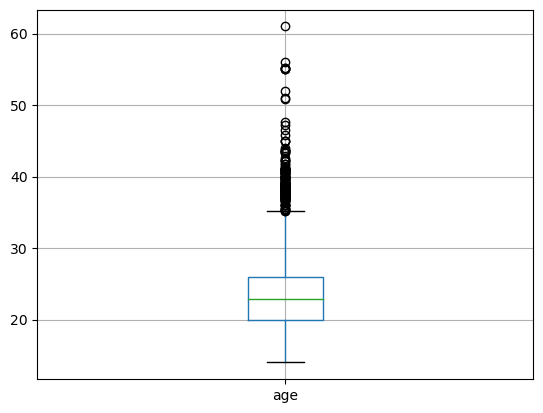

In [256]:
df_obese.boxplot('age')

<Axes: >

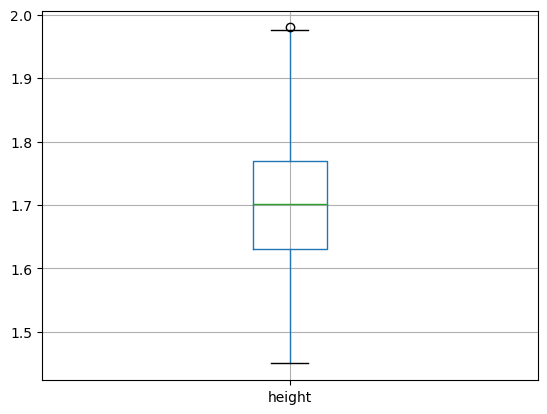

In [257]:
df_obese.boxplot('height')

<Axes: >

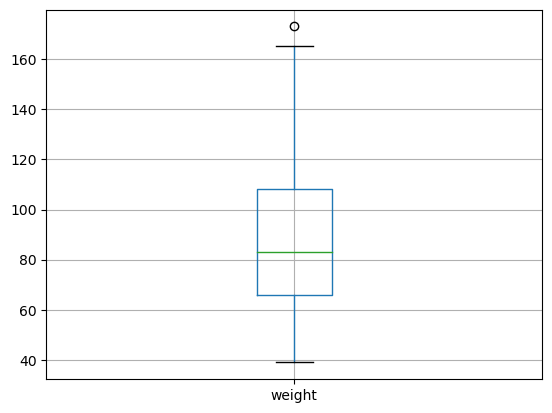

In [258]:
df_obese.boxplot('weight')

<Axes: >

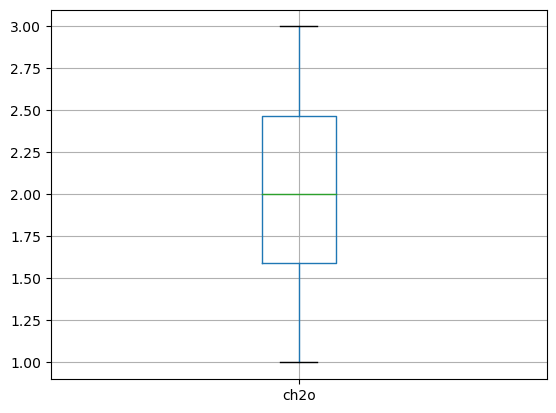

In [259]:
df_obese.boxplot('ch2o')

In [260]:
df_obese.columns

Index(['gender', 'age', 'height', 'weight', 'family history with overweight',
       'favc', 'fcvc', 'ncp', 'caec', 'smoke', 'ch2o', 'scc', 'faf', 'tue',
       'calc', 'mtrans', 'nobeyesdad'],
      dtype='object')

In [261]:
df_obese.head(5)

,gender,age,height,weight,family history with overweight,favc,fcvc,ncp,caec,smoke,ch2o,scc,faf,tue,calc,mtrans,nobeyesdad
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II


<Axes: ylabel='gender'>

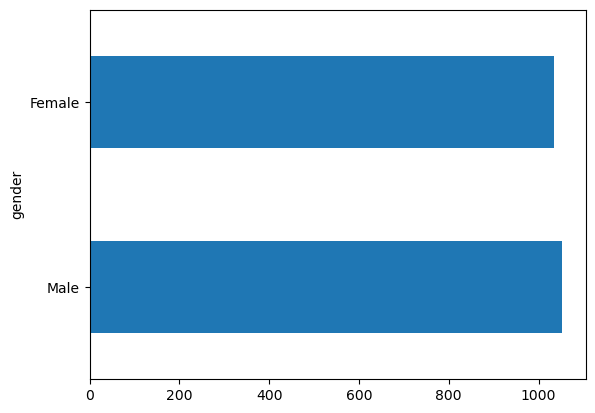

In [262]:
df_obese['gender'].value_counts().plot(kind='barh')

<Axes: ylabel='family history with overweight'>

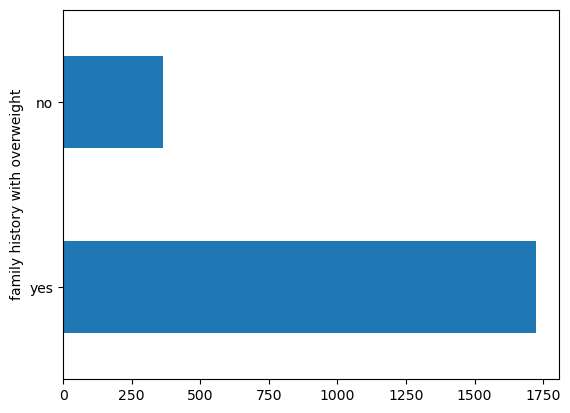

In [263]:
df_obese['family history with overweight'].value_counts().plot(kind='barh')

<Axes: ylabel='favc'>

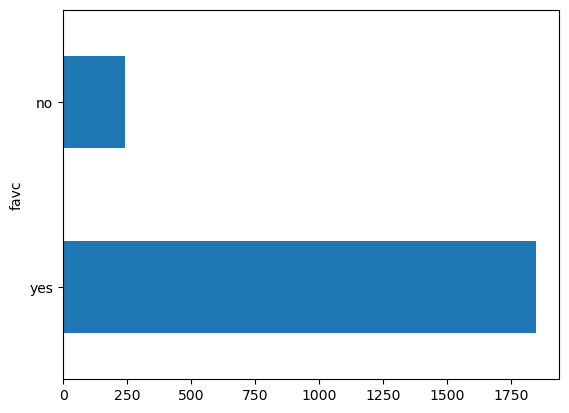

In [264]:
df_obese['favc'].value_counts().plot(kind='barh')

<Axes: ylabel='caec'>

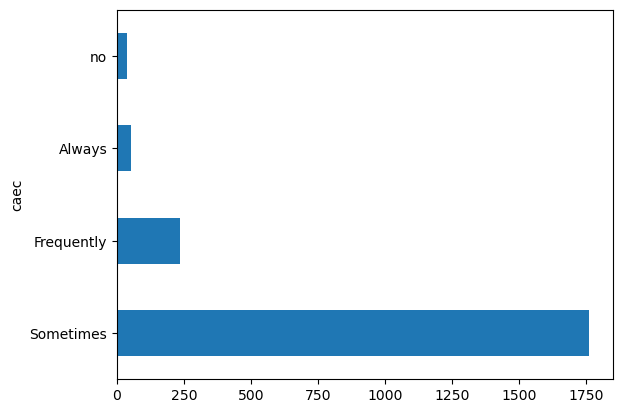

In [265]:
df_obese['caec'].value_counts().plot(kind='barh')

<Axes: ylabel='smoke'>

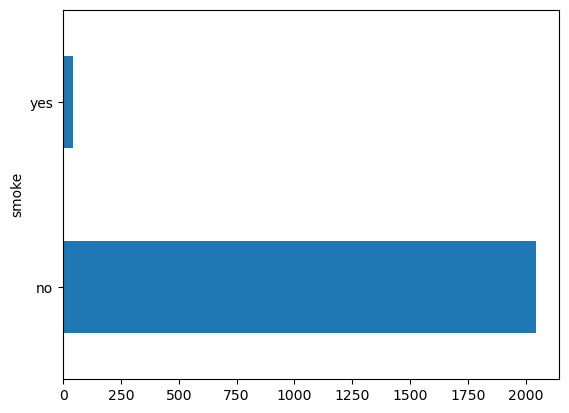

In [266]:
df_obese['smoke'].value_counts().plot(kind='barh')

<Axes: ylabel='scc'>

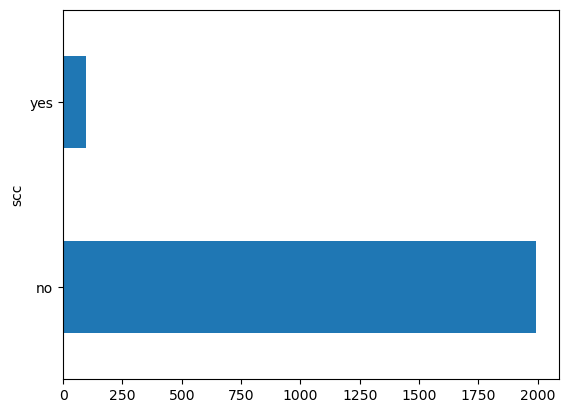

In [267]:
df_obese['scc'].value_counts().plot(kind='barh')

<Axes: ylabel='calc'>

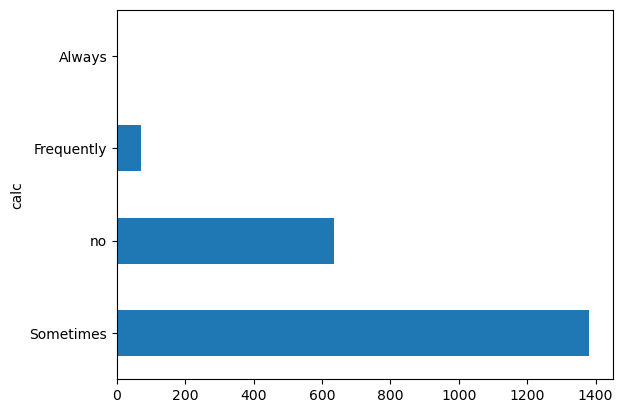

In [268]:
df_obese['calc'].value_counts().plot(kind='barh')

<Axes: ylabel='mtrans'>

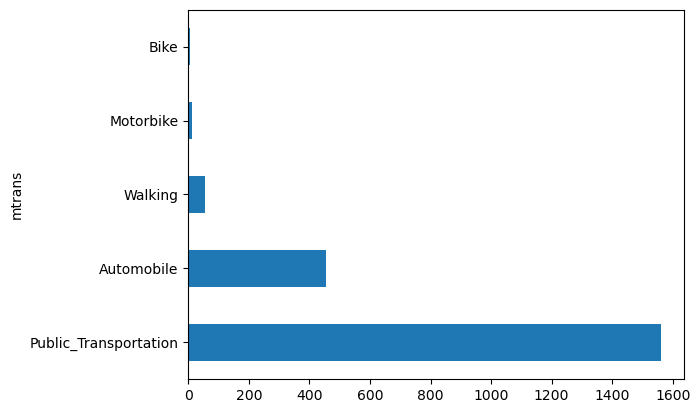

In [269]:
df_obese['mtrans'].value_counts().plot(kind='barh')

<Axes: ylabel='nobeyesdad'>

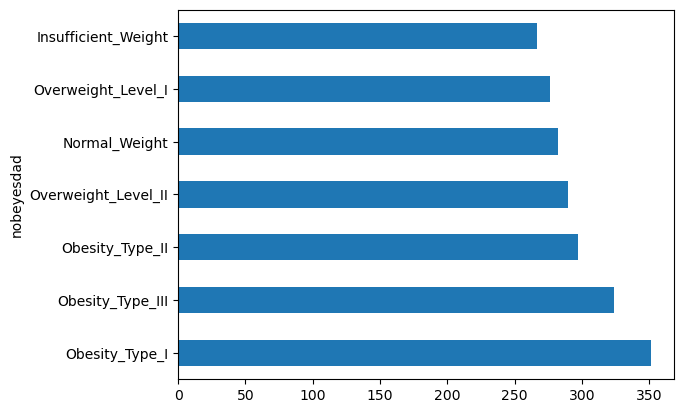

In [270]:
df_obese['nobeyesdad'].value_counts().plot(kind='barh')

In [271]:
from sklearn import preprocessing

## Converting all the categorical into vectors

In [272]:
#Dependent variable input variables One Hot Encoding
input_enc = preprocessing.OneHotEncoder(sparse_output=False).set_output(transform="pandas")
#onehot = input_enc.fit_transform(df[['Gender', 'family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE', 'SCC', 'CALC', 'MTRANS']]).toarray()

In [273]:
df_encoded = pd.DataFrame ( input_enc.fit_transform(df_obese[['gender', 'family history with overweight', 'favc' , 'caec', 'smoke', 'calc', 'mtrans', 'scc']]))

In [274]:
df_encoded.columns = input_enc.get_feature_names_out(['gender', 'family history with overweight', 'favc' , 'caec', 'smoke', 'calc', 'mtrans', 'scc'])

In [275]:
df_encoded

,gender_Female,gender_Male,family history with overweight_no,family history with overweight_yes,favc_no,favc_yes,caec_Always,caec_Frequently,caec_Sometimes,caec_no,...,calc_Frequently,calc_Sometimes,calc_no,mtrans_Automobile,mtrans_Bike,mtrans_Motorbike,mtrans_Public_Transportation,mtrans_Walking,scc_no,scc_yes
0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
4,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2082,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2083,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2084,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2085,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [276]:
result = pd.concat([df_obese, df_encoded], axis=1)

In [277]:
df_obese

,gender,age,height,weight,family history with overweight,favc,fcvc,ncp,caec,smoke,ch2o,scc,faf,tue,calc,mtrans,nobeyesdad
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,0.000000,1.000000,no,Public_Transportation,Normal_Weight
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,3.000000,yes,3.000000,0.000000,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,2.000000,no,2.000000,1.000000,Frequently,Public_Transportation,Normal_Weight
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,2.000000,no,2.000000,0.000000,Frequently,Walking,Overweight_Level_I
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,2.000000,no,0.000000,0.000000,Sometimes,Public_Transportation,Overweight_Level_II
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2082,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,1.728139,no,1.676269,0.906247,Sometimes,Public_Transportation,Obesity_Type_III
2083,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,2.005130,no,1.341390,0.599270,Sometimes,Public_Transportation,Obesity_Type_III
2084,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,2.054193,no,1.414209,0.646288,Sometimes,Public_Transportation,Obesity_Type_III
2085,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,2.852339,no,1.139107,0.586035,Sometimes,Public_Transportation,Obesity_Type_III


In [278]:
result

,gender,age,height,weight,family history with overweight,favc,fcvc,ncp,caec,smoke,...,calc_Frequently,calc_Sometimes,calc_no,mtrans_Automobile,mtrans_Bike,mtrans_Motorbike,mtrans_Public_Transportation,mtrans_Walking,scc_no,scc_yes
0,Female,21.000000,1.620000,64.000000,yes,no,2.0,3.0,Sometimes,no,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,Female,21.000000,1.520000,56.000000,yes,no,3.0,3.0,Sometimes,yes,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,Male,23.000000,1.800000,77.000000,yes,no,2.0,3.0,Sometimes,no,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,Male,27.000000,1.800000,87.000000,no,no,3.0,3.0,Sometimes,no,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
4,Male,22.000000,1.780000,89.800000,no,no,2.0,1.0,Sometimes,no,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2082,Female,20.976842,1.710730,131.408528,yes,yes,3.0,3.0,Sometimes,no,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2083,Female,21.982942,1.748584,133.742943,yes,yes,3.0,3.0,Sometimes,no,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2084,Female,22.524036,1.752206,133.689352,yes,yes,3.0,3.0,Sometimes,no,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2085,Female,24.361936,1.739450,133.346641,yes,yes,3.0,3.0,Sometimes,no,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [279]:
df_obese = result

## Removing unwanted fields

In [280]:
df_obese = df_obese.drop(['gender', 'family history with overweight', 'favc' , 'caec', 'smoke', 'calc', 'mtrans', 'scc'], axis=1)

In [281]:
df_obese

,age,height,weight,fcvc,ncp,ch2o,faf,tue,nobeyesdad,gender_Female,...,calc_Frequently,calc_Sometimes,calc_no,mtrans_Automobile,mtrans_Bike,mtrans_Motorbike,mtrans_Public_Transportation,mtrans_Walking,scc_no,scc_yes
0,21.000000,1.620000,64.000000,2.0,3.0,2.000000,0.000000,1.000000,Normal_Weight,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,21.000000,1.520000,56.000000,3.0,3.0,3.000000,3.000000,0.000000,Normal_Weight,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,23.000000,1.800000,77.000000,2.0,3.0,2.000000,2.000000,1.000000,Normal_Weight,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,27.000000,1.800000,87.000000,3.0,3.0,2.000000,2.000000,0.000000,Overweight_Level_I,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
4,22.000000,1.780000,89.800000,2.0,1.0,2.000000,0.000000,0.000000,Overweight_Level_II,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2082,20.976842,1.710730,131.408528,3.0,3.0,1.728139,1.676269,0.906247,Obesity_Type_III,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2083,21.982942,1.748584,133.742943,3.0,3.0,2.005130,1.341390,0.599270,Obesity_Type_III,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2084,22.524036,1.752206,133.689352,3.0,3.0,2.054193,1.414209,0.646288,Obesity_Type_III,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2085,24.361936,1.739450,133.346641,3.0,3.0,2.852339,1.139107,0.586035,Obesity_Type_III,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


## Converting the target categorical into numerical using LabelEncoder

In [282]:
#Target variable using LabelEncoder
label_enc = preprocessing.LabelEncoder()

In [283]:
df_obese['nobeyesdad'] = label_enc.fit_transform(df_obese['nobeyesdad'])

In [284]:
mapping = dict(zip(label_enc.classes_, range(len(label_enc.classes_))))

In [285]:
mapping

{'Insufficient_Weight': 0,
 'Normal_Weight': 1,
 'Obesity_Type_I': 2,
 'Obesity_Type_II': 3,
 'Obesity_Type_III': 4,
 'Overweight_Level_I': 5,
 'Overweight_Level_II': 6}

In [286]:
label_enc.classes_

array(['Insufficient_Weight', 'Normal_Weight', 'Obesity_Type_I',
       'Obesity_Type_II', 'Obesity_Type_III', 'Overweight_Level_I',
       'Overweight_Level_II'], dtype=object)

In [287]:
#label_enc = preprocessing.LabelEncoder()
#label_enc.fit(df['NObeyesdad'])
#le_name_mapping = dict(zip(label_enc.classes_, label_enc.transform(label_enc.classes_)))
#print(le_name_mapping)

In [288]:
#list(label_enc.classes_)

In [289]:
#list(label_enc.inverse_transform([0,1,2,3,4,5,6]))

In [290]:
df_obese

,age,height,weight,fcvc,ncp,ch2o,faf,tue,nobeyesdad,gender_Female,...,calc_Frequently,calc_Sometimes,calc_no,mtrans_Automobile,mtrans_Bike,mtrans_Motorbike,mtrans_Public_Transportation,mtrans_Walking,scc_no,scc_yes
0,21.000000,1.620000,64.000000,2.0,3.0,2.000000,0.000000,1.000000,1,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,21.000000,1.520000,56.000000,3.0,3.0,3.000000,3.000000,0.000000,1,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,23.000000,1.800000,77.000000,2.0,3.0,2.000000,2.000000,1.000000,1,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,27.000000,1.800000,87.000000,3.0,3.0,2.000000,2.000000,0.000000,5,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
4,22.000000,1.780000,89.800000,2.0,1.0,2.000000,0.000000,0.000000,6,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2082,20.976842,1.710730,131.408528,3.0,3.0,1.728139,1.676269,0.906247,4,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2083,21.982942,1.748584,133.742943,3.0,3.0,2.005130,1.341390,0.599270,4,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2084,22.524036,1.752206,133.689352,3.0,3.0,2.054193,1.414209,0.646288,4,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2085,24.361936,1.739450,133.346641,3.0,3.0,2.852339,1.139107,0.586035,4,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


In [291]:
df_obese.columns

Index(['age', 'height', 'weight', 'fcvc', 'ncp', 'ch2o', 'faf', 'tue',
       'nobeyesdad', 'gender_Female', 'gender_Male',
       'family history with overweight_no',
       'family history with overweight_yes', 'favc_no', 'favc_yes',
       'caec_Always', 'caec_Frequently', 'caec_Sometimes', 'caec_no',
       'smoke_no', 'smoke_yes', 'calc_Always', 'calc_Frequently',
       'calc_Sometimes', 'calc_no', 'mtrans_Automobile', 'mtrans_Bike',
       'mtrans_Motorbike', 'mtrans_Public_Transportation', 'mtrans_Walking',
       'scc_no', 'scc_yes'],
      dtype='object')

In [292]:
df_obese.dtypes

age                                   float64
height                                float64
weight                                float64
fcvc                                  float64
ncp                                   float64
ch2o                                  float64
faf                                   float64
tue                                   float64
nobeyesdad                              int64
gender_Female                         float64
gender_Male                           float64
family history with overweight_no     float64
family history with overweight_yes    float64
favc_no                               float64
favc_yes                              float64
caec_Always                           float64
caec_Frequently                       float64
caec_Sometimes                        float64
caec_no                               float64
smoke_no                              float64
smoke_yes                             float64
calc_Always                       

In [293]:
df_obese.head(5)

,age,height,weight,fcvc,ncp,ch2o,faf,tue,nobeyesdad,gender_Female,...,calc_Frequently,calc_Sometimes,calc_no,mtrans_Automobile,mtrans_Bike,mtrans_Motorbike,mtrans_Public_Transportation,mtrans_Walking,scc_no,scc_yes
0,21.0,1.62,64.0,2.0,3.0,2.0,0.0,1.0,1,1.0,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,21.0,1.52,56.0,3.0,3.0,3.0,3.0,0.0,1,1.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,23.0,1.80,77.0,2.0,3.0,2.0,2.0,1.0,1,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,27.0,1.80,87.0,3.0,3.0,2.0,2.0,0.0,5,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
4,22.0,1.78,89.8,2.0,1.0,2.0,0.0,0.0,6,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


## REMOVING OUTLIERS

In [294]:
def remove_outliers(df):
    Q1 = df.quantile(0.01)
    Q3 = df.quantile(0.99)
    IQR = Q3 - Q1
    df = df[~((df < (Q1 - 1.5 * IQR)) | (df > (Q3 + 1.5 * IQR))).any(axis=1)]
    return df

In [295]:
df_obese = remove_outliers(df_obese)

In [296]:
df_obese = df_obese.reset_index()

In [299]:
df_obese

,index,age,height,weight,fcvc,ncp,ch2o,faf,tue,nobeyesdad,...,calc_Frequently,calc_Sometimes,calc_no,mtrans_Automobile,mtrans_Bike,mtrans_Motorbike,mtrans_Public_Transportation,mtrans_Walking,scc_no,scc_yes
0,0,21.000000,1.620000,64.000000,2.0,3.0,2.000000,0.000000,1.000000,1,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
1,1,21.000000,1.520000,56.000000,3.0,3.0,3.000000,3.000000,0.000000,1,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,2,23.000000,1.800000,77.000000,2.0,3.0,2.000000,2.000000,1.000000,1,...,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,3,27.000000,1.800000,87.000000,3.0,3.0,2.000000,2.000000,0.000000,5,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
4,4,22.000000,1.780000,89.800000,2.0,1.0,2.000000,0.000000,0.000000,6,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2063,2082,20.976842,1.710730,131.408528,3.0,3.0,1.728139,1.676269,0.906247,4,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2064,2083,21.982942,1.748584,133.742943,3.0,3.0,2.005130,1.341390,0.599270,4,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2065,2084,22.524036,1.752206,133.689352,3.0,3.0,2.054193,1.414209,0.646288,4,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2066,2085,24.361936,1.739450,133.346641,3.0,3.0,2.852339,1.139107,0.586035,4,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


Datatype standardization

In [300]:
df_obese = df_obese.astype("int")

In [301]:
df_obese.dtypes

index                                 int64
age                                   int64
height                                int64
weight                                int64
fcvc                                  int64
ncp                                   int64
ch2o                                  int64
faf                                   int64
tue                                   int64
nobeyesdad                            int64
gender_Female                         int64
gender_Male                           int64
family history with overweight_no     int64
family history with overweight_yes    int64
favc_no                               int64
favc_yes                              int64
caec_Always                           int64
caec_Frequently                       int64
caec_Sometimes                        int64
caec_no                               int64
smoke_no                              int64
smoke_yes                             int64
calc_Always                     

In [303]:
df_obese.head(5)

,index,age,height,weight,fcvc,ncp,ch2o,faf,tue,nobeyesdad,...,calc_Frequently,calc_Sometimes,calc_no,mtrans_Automobile,mtrans_Bike,mtrans_Motorbike,mtrans_Public_Transportation,mtrans_Walking,scc_no,scc_yes
0,0,21,1,64,2,3,2,0,1,1,...,0,0,1,0,0,0,1,0,1,0
1,1,21,1,56,3,3,3,3,0,1,...,0,1,0,0,0,0,1,0,0,1
2,2,23,1,77,2,3,2,2,1,1,...,1,0,0,0,0,0,1,0,1,0
3,3,27,1,87,3,3,2,2,0,5,...,1,0,0,0,0,0,0,1,1,0
4,4,22,1,89,2,1,2,0,0,6,...,0,1,0,0,0,0,1,0,1,0


## Splitting the data

In [304]:
X = df_obese.drop(columns=['nobeyesdad'], axis=1)
y = df_obese['nobeyesdad']

In [306]:
from sklearn.model_selection import train_test_split

In [307]:
X_train, X_test, y_train, y_test =  train_test_split(X, y, test_size = 0.2)

In [308]:
X_train

,index,age,height,weight,fcvc,ncp,ch2o,faf,tue,gender_Female,...,calc_Frequently,calc_Sometimes,calc_no,mtrans_Automobile,mtrans_Bike,mtrans_Motorbike,mtrans_Public_Transportation,mtrans_Walking,scc_no,scc_yes
1163,1182,23,1,82,2,2,1,1,0,0,...,0,1,0,0,0,0,1,0,1,0
60,63,22,1,55,2,3,2,0,2,0,...,0,1,0,1,0,0,0,0,1,0
1405,1424,22,1,96,2,3,2,2,1,0,...,0,0,1,0,0,0,1,0,1,0
1438,1457,39,1,80,2,1,1,1,0,1,...,0,1,0,1,0,0,0,0,1,0
421,437,19,1,60,2,1,2,2,0,0,...,0,1,0,0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446,462,18,1,83,2,3,2,1,0,1,...,0,0,1,0,0,0,1,0,0,1
1830,1849,23,1,114,3,3,2,0,0,1,...,0,1,0,0,0,0,1,0,1,0
1032,1051,23,1,80,2,2,1,0,1,1,...,0,0,1,0,0,0,1,0,1,0
2046,2065,26,1,111,3,3,2,0,0,1,...,0,1,0,0,0,0,1,0,1,0


In [309]:
X_test

,index,age,height,weight,fcvc,ncp,ch2o,faf,tue,gender_Female,...,calc_Frequently,calc_Sometimes,calc_no,mtrans_Automobile,mtrans_Bike,mtrans_Motorbike,mtrans_Public_Transportation,mtrans_Walking,scc_no,scc_yes
1656,1675,39,1,108,2,3,1,1,0,0,...,0,0,1,1,0,0,0,0,1,0
1885,1904,26,1,111,3,3,2,0,0,1,...,0,1,0,0,0,0,1,0,1,0
1746,1765,22,1,120,2,2,1,1,0,0,...,0,1,0,0,0,0,1,0,1,0
1442,1461,18,1,96,2,2,2,0,0,0,...,0,0,1,0,0,0,1,0,1,0
340,351,41,1,110,2,1,1,1,0,0,...,1,0,0,1,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
833,852,40,1,62,2,3,2,1,0,1,...,0,1,0,1,0,0,0,0,1,0
1091,1110,21,1,64,2,1,2,1,1,1,...,0,0,1,0,0,0,1,0,1,0
1848,1867,21,1,133,3,3,1,1,0,1,...,0,1,0,0,0,0,1,0,1,0
1268,1287,31,1,90,2,1,2,1,0,0,...,0,1,0,1,0,0,0,0,1,0


In [310]:
y_train

1163    6
60      1
1405    2
1438    2
421     1
       ..
446     2
1830    4
1032    6
2046    4
846     5
Name: nobeyesdad, Length: 1654, dtype: int64

In [311]:
y_test

1656    3
1885    4
1746    3
1442    2
340     3
       ..
833     5
1091    6
1848    4
1268    2
625     0
Name: nobeyesdad, Length: 414, dtype: int64

In [305]:
#Standardization

In [314]:
scaler = preprocessing.StandardScaler()

In [315]:
X_train = scaler.fit_transform(X_train)

In [316]:
X_test = scaler.fit_transform(X_test)

## Implementation

In [317]:
#Logistic Regression

In [318]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, f1_score,recall_score,precision_score,accuracy_score, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score,roc_curve, RocCurveDisplay
from sklearn.multiclass import OneVsRestClassifier

In [319]:
start_lr = time.time()

In [320]:
model1_lr = LogisticRegression(max_iter = 100)
model1_lr = model1_lr.fit(X_train,y_train)

In [321]:
y_pred_train_lr = model1_lr.predict(X_train)

In [322]:
y_pred_test_lr = model1_lr.predict(X_test)

In [323]:
y_proba_lr = model1_lr.predict_proba(X_test)

In [324]:
print(y_pred_test_lr)

[3 4 3 2 6 5 1 2 6 5 3 3 0 5 1 6 1 1 2 6 4 5 5 6 6 3 4 2 4 1 0 0 1 5 1 3 5
 2 2 6 4 6 3 3 0 3 3 2 5 1 4 2 6 3 4 0 0 5 5 3 0 2 3 0 1 2 2 2 6 6 5 6 2 3
 5 0 6 3 0 2 4 6 1 5 3 0 3 2 3 4 1 2 4 0 0 1 3 6 4 0 5 3 1 5 4 0 1 2 6 2 5
 0 4 3 6 0 0 6 0 6 4 5 2 0 6 2 4 4 1 3 1 4 4 1 6 0 4 1 0 1 1 0 1 2 1 1 3 3
 5 2 2 4 0 0 2 1 2 3 6 6 4 3 6 2 6 5 6 0 2 4 4 4 5 4 6 6 5 2 3 0 2 6 6 6 3
 3 2 4 3 1 2 6 6 3 4 1 6 4 2 5 3 4 2 6 5 4 1 0 0 2 3 6 0 5 2 5 0 3 2 6 4 5
 5 4 2 2 1 0 4 1 3 4 2 2 5 0 5 4 5 4 2 0 0 4 2 3 4 5 3 5 2 1 5 3 0 5 2 2 1
 6 0 5 6 5 6 2 4 3 1 2 6 0 5 1 0 2 6 1 5 2 2 4 6 2 2 6 3 1 1 3 1 4 5 1 1 0
 4 4 2 5 5 1 5 3 6 5 2 0 1 5 4 2 5 1 3 4 1 1 2 1 0 2 6 0 1 5 4 0 6 1 1 4 2
 3 3 6 2 2 2 5 2 0 2 0 0 3 4 0 4 0 4 2 2 1 6 3 6 2 2 2 1 2 1 2 4 2 1 0 3 6
 5 3 2 3 3 5 4 4 1 1 4 2 5 1 0 5 4 6 3 5 1 0 5 5 4 4 4 6 4 2 3 4 2 1 4 3 0
 3 4 5 6 4 2 0]


In [325]:
report1_lr = classification_report(y_test, y_pred_test_lr)
print(f"Classification Report: \n{report1_lr}")

Classification Report: 
              precision    recall  f1-score   support

           0       0.93      0.91      0.92        55
           1       0.77      0.80      0.79        55
           2       0.70      0.83      0.76        64
           3       0.89      0.94      0.92        52
           4       1.00      0.98      0.99        64
           5       0.82      0.73      0.77        62
           6       0.70      0.61      0.66        62

    accuracy                           0.83       414
   macro avg       0.83      0.83      0.83       414
weighted avg       0.83      0.83      0.83       414



In [326]:
acc_train_lr = accuracy_score(y_train, y_pred_train_lr)
acc_test_lr = accuracy_score(y_test, y_pred_test_lr)
prec_lr = precision_score(y_test, y_pred_test_lr, average='weighted')
recall_lr = recall_score(y_test, y_pred_test_lr, average='weighted')
f1_score_lr = f1_score(y_test, y_pred_test_lr, average='weighted')
auc_roc_log_lr = roc_auc_score(y_test, y_proba_lr, average='weighted', multi_class='ovr')

In [327]:
print('Logistic Regression Accuracy Train percentage is:', round(acc_train_lr*100,2))
print('Logistic Regression Accuracy percentage is:', round(acc_test_lr*100,2))
print('Logistic Regression Precision percentage is:', round(prec_lr*100,2))
print('Logistic Regression Recall percentage is:', round(recall_lr*100,2))
print('Logistic Regression F1-score percentage is:', round(f1_score_lr*100,2))
print('Logistic Regression AUC ROC percentage is:', auc_roc_log_lr)

Logistic Regression Accuracy Train percentage is: 86.7
Logistic Regression Accuracy percentage is: 82.61
Logistic Regression Precision percentage is: 82.78
Logistic Regression Recall percentage is: 82.61
Logistic Regression F1-score percentage is: 82.5
Logistic Regression AUC ROC percentage is: 0.9735465208973908


In [328]:
def plot_sklearn_roc_curve(y_real, y_pred):
    '''
    Plots the ROC Curve with the sklearn methods by using the real observations and their predictions.
    
    Args:
        y_real: The list or series with the real classes
        y_pred: The list or series with the predicted classes
    '''
    fpr, tpr, _ = roc_curve(y_real, y_pred)
    roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()
    roc_display.figure_.set_size_inches(5,5)

In [329]:
def evaluate_classifier(y_real, y_pred):

    print(f"Accuracy: {round(accuracy_score(y_real, y_pred)*100,2)}")
    print(f"Precision: {round(precision_score(y_real, y_pred, average='weighted')*100,2)}")
    print(f"Recall: {round(recall_score(y_real, y_pred, average='weighted')*100,2)}")
    print(f"f1 Score: {round(f1_score(y_real, y_pred, average='weighted')*100,2)}")

In [330]:
print("-------------------------------------------" "\n" "Evaluation metrics for Logistic Regression" "\n" "-------------------------------------------" )
evaluate_classifier(y_test, y_pred_test_lr)

-------------------------------------------
Evaluation metrics for Logistic Regression
-------------------------------------------
Accuracy: 82.61
Precision: 82.78
Recall: 82.61
f1 Score: 82.5


In [331]:
clf = OneVsRestClassifier(LogisticRegression())

In [332]:
clf.fit(X_train,y_train)

OneVsRestClassifier(estimator=LogisticRegression())

In [333]:
pred = clf.predict(X_test)

In [334]:
pred_prob_lr = clf.predict_proba(X_test)

In [335]:
#roc curve for classes

In [336]:
fpr={}
tpr={}
thresh={}
n_classes = 7

In [337]:
for i in range(n_classes):
    fpr[i],tpr[i],thresh[i] = roc_curve(y_test, pred_prob_lr[:,i], pos_label=i)

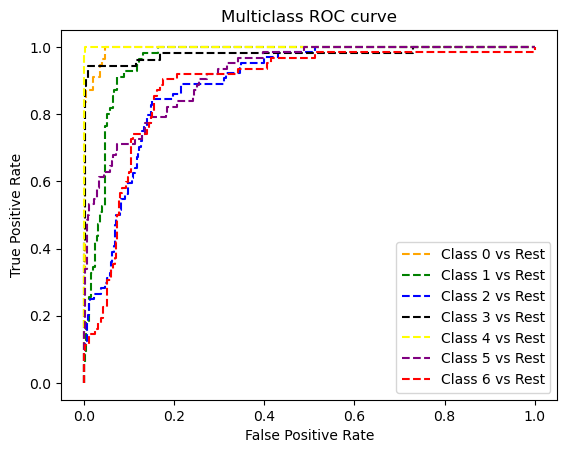

In [338]:
#Plotting
plt.plot(fpr[0],tpr[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr[1],tpr[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr[2],tpr[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr[3],tpr[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr[4],tpr[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr[5],tpr[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr[6],tpr[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('Multiclass ROC', dpi=300)
plt.show()

In [339]:
#Roc curve for model

In [340]:
fpr1, tpr1, thresh1 = roc_curve(y_test, y_proba_lr[:,1], pos_label=1)

In [341]:
#roc curve for tpr = fpr

In [342]:
random_probs = [0 for i in range(len(y_test))]
p_fpr, p_tpr, _ = roc_curve(y_test,random_probs,pos_label=1)

In [343]:
#auc scores

In [344]:
auc_score1 = roc_auc_score(y_test, y_proba_lr, multi_class='ovr')
print(auc_score1)

0.9742131060294845


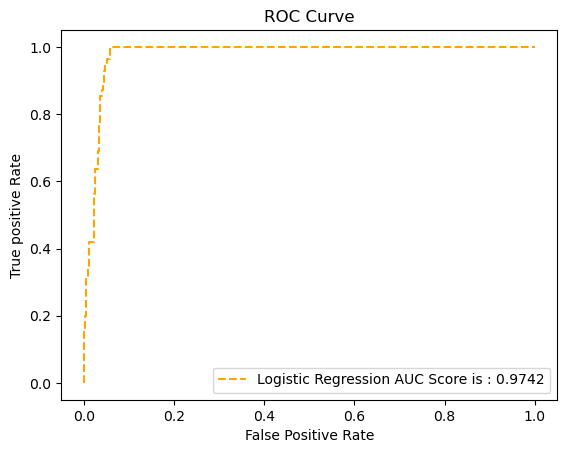

In [345]:
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='Logistic Regression AUC Score is : {:.4f}'.format(auc_score1))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [346]:
# Display the confusion matrix
conf_matrix1_lr = confusion_matrix(y_test, y_pred_test_lr)
display(conf_matrix1_lr)

array([[50,  5,  0,  0,  0,  0,  0],
       [ 4, 44,  0,  0,  0,  4,  3],
       [ 0,  0, 53,  6,  0,  1,  4],
       [ 0,  0,  2, 49,  0,  0,  1],
       [ 0,  0,  1,  0, 63,  0,  0],
       [ 0,  6,  3,  0,  0, 45,  8],
       [ 0,  2, 17,  0,  0,  5, 38]])

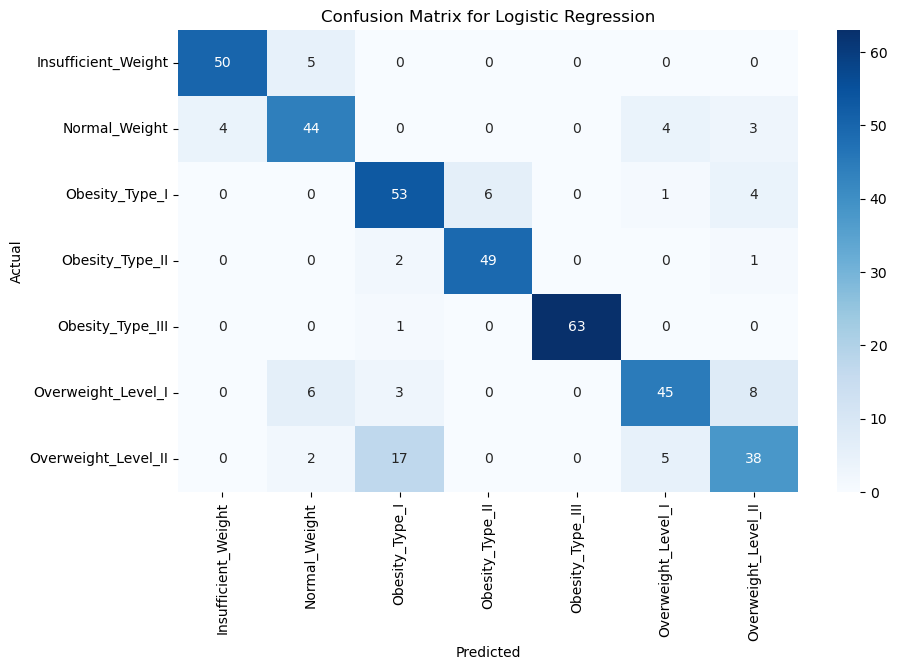

In [347]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix1_lr, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Logistic Regression')
plt.show()


#disp = ConfusionMatrixDisplay(conf_matrix1)
#disp.plot()
#plt.show()

In [348]:
end_lr = time.time()

In [349]:
Training_time_lr = end_lr-start_lr

In [350]:
print("The time of execution of Logistic Regression Model is :",
      Training_time_lr , "ms")

The time of execution of Logistic Regression Model is : 34.711647272109985 ms


In [351]:
#XGBoost Classifier

In [352]:
from xgboost import XGBClassifier

In [353]:
start_xg = time.time()

In [354]:
model2_xgb = XGBClassifier(random_state=42, n_estimators=100, max_depth=20, min_samples_split=2, min_samples_leaf=1)

In [355]:
model2_xgb = model2_xgb.fit(X_train,y_train)

In [356]:
y_pred_train_xgb = model2_xgb.predict(X_train)

In [357]:
y_pred_test_xgb = model2_xgb.predict(X_test)

In [358]:
y_proba_xgb = model2_xgb.predict_proba(X_test)

In [359]:
report2_xgb = classification_report(y_test, y_pred_test_xgb)
print(f"Classification Report: \n{report2_xgb}")

Classification Report: 
              precision    recall  f1-score   support

           0       0.94      0.91      0.93        55
           1       0.81      0.91      0.85        55
           2       0.80      0.83      0.82        64
           3       0.89      0.94      0.92        52
           4       0.98      0.98      0.98        64
           5       0.95      0.84      0.89        62
           6       0.86      0.82      0.84        62

    accuracy                           0.89       414
   macro avg       0.89      0.89      0.89       414
weighted avg       0.89      0.89      0.89       414



In [360]:
acc_train_xgb = accuracy_score(y_train, y_pred_train_xgb)
acc_test_xgb = accuracy_score(y_test, y_pred_test_xgb)
prec_xgb = precision_score(y_test, y_pred_test_xgb, average='weighted')
recall_xgb = recall_score(y_test, y_pred_test_xgb, average='weighted')
f1_score_xgb = f1_score(y_test, y_pred_test_xgb, average='weighted')
auc_roc_log_xgb = roc_auc_score(y_test, y_proba_xgb, average='weighted', multi_class='ovr')

In [361]:
print('XGBoost Classifier Accuracy Train percentage is:', round(acc_train_xgb*100,2))
print('XGBoost Classifier Accuracy percentage is:', round(acc_test_xgb*100,2))
print('XGBoost Classifier Precision percentage is:', round(prec_xgb*100,2))
print('XGBoost Classifier Recall percentage is:', round(recall_xgb*100,2))
print('XGBoost Classifier F1-score percentage is:', round(f1_score_xgb*100,2))
print('XGBoost Classifier AUC ROC percentage is:', auc_roc_log_xgb)

XGBoost Classifier Accuracy Train percentage is: 100.0
XGBoost Classifier Accuracy percentage is: 88.89
XGBoost Classifier Precision percentage is: 89.17
XGBoost Classifier Recall percentage is: 88.89
XGBoost Classifier F1-score percentage is: 88.92
XGBoost Classifier AUC ROC percentage is: 0.9891754209379712


In [362]:
# Display the confusion matrix
conf_matrix2_xgb = confusion_matrix(y_test, y_pred_test_xgb)
display(conf_matrix2_xgb)

array([[50,  4,  0,  0,  0,  1,  0],
       [ 3, 50,  1,  0,  0,  0,  1],
       [ 0,  0, 53,  6,  0,  1,  4],
       [ 0,  0,  2, 49,  1,  0,  0],
       [ 0,  0,  1,  0, 63,  0,  0],
       [ 0,  5,  2,  0,  0, 52,  3],
       [ 0,  3,  7,  0,  0,  1, 51]])

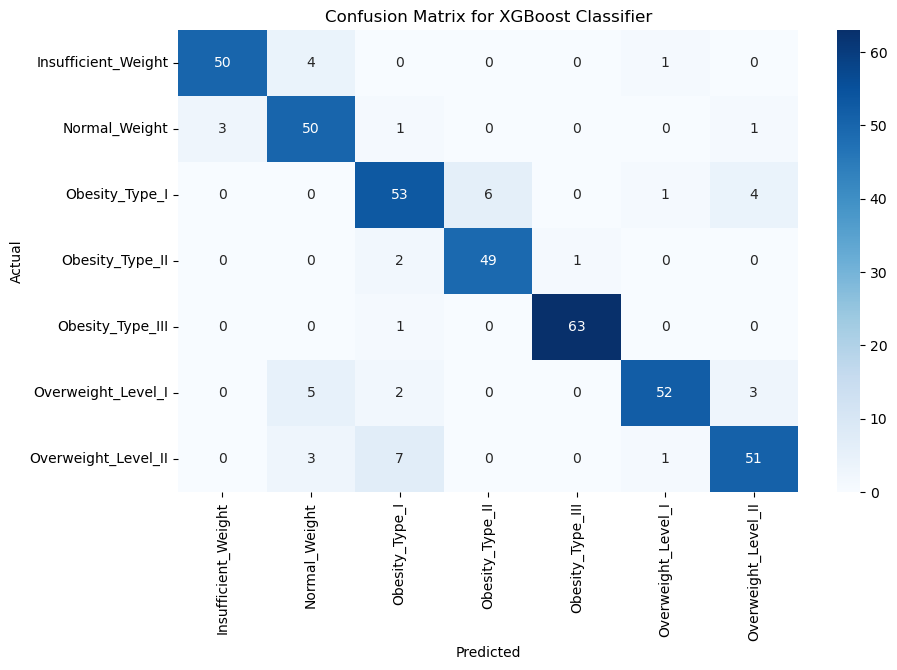

In [363]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix2_xgb, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for XGBoost Classifier')
plt.show()



#disp = ConfusionMatrixDisplay(conf_matrix2_xgb)
#disp.plot()
#plt.show()

In [364]:
clf1 = OneVsRestClassifier(XGBClassifier(random_state=42, n_estimators=100, max_depth=20, min_samples_split=2, min_samples_leaf=1))

In [365]:
clf1.fit(X_train,y_train)

OneVsRestClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=20,
                                            max_leaves=None,
                                            min_child_weight=None,
                                            min_samples_leaf=1,
                                            min_samples_split=2, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=100, n_jobs=None, ...))

In [366]:
pred1 = clf1.predict(X_test)

In [367]:
pred_prob_xgb = clf1.predict_proba(X_test)

In [368]:
#roc curve for classes

In [369]:
fpr_xgb={}
tpr_xgb={}
thresh_xgb={}
n_classes_xgb = 7

In [370]:
for i in range(n_classes_xgb):
    fpr_xgb[i],tpr_xgb[i],thresh_xgb[i] = roc_curve(y_test, pred_prob_xgb[:,i], pos_label=i)

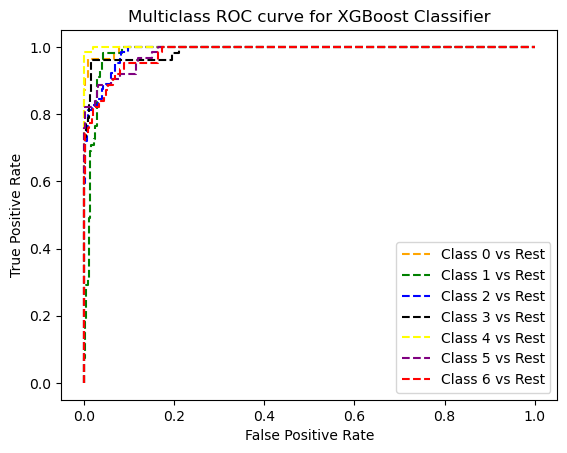

In [371]:
#Plotting
plt.plot(fpr_xgb[0],tpr_xgb[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_xgb[1],tpr_xgb[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_xgb[2],tpr_xgb[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_xgb[3],tpr_xgb[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_xgb[4],tpr_xgb[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_xgb[5],tpr_xgb[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_xgb[6],tpr_xgb[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for XGBoost Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('Multiclass ROC for XGBoost Classifier', dpi=300)
plt.show()

In [372]:
#Roc curve for model

In [373]:
fpr1_xgb, tpr1_xgb, thresh1_xgb = roc_curve(y_test, y_proba_xgb[:,1], pos_label=1)

In [374]:
random_probs_xgb = [0 for i in range(len(y_test))]
p_fpr_xgb, p_tpr_xgb, _ = roc_curve(y_test,random_probs_xgb,pos_label=1)

In [375]:
auc_score_xgb = roc_auc_score(y_test, y_proba_xgb, multi_class='ovr')
print(auc_score_xgb)

0.9891686569046089


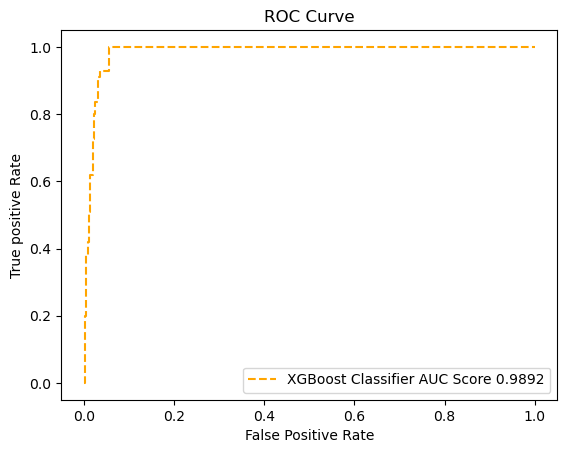

In [376]:
plt.plot(fpr1_xgb, tpr1_xgb, linestyle='--',color='orange', label='XGBoost Classifier AUC Score {:.4f}'.format(auc_score_xgb))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [377]:
end_xg = time.time()

In [378]:
Training_time_xg = end_xg-start_xg

In [379]:
print("The time of execution of XGBoost Classifier Model is :",
      Training_time_xg , "ms")

The time of execution of XGBoost Classifier Model is : 25.278179168701172 ms


In [380]:
##Gradient Boost Classifier

In [381]:
from sklearn.ensemble import GradientBoostingClassifier

In [382]:
start_gb = time.time()

In [383]:
model3_GrB = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1)

In [384]:
model3_GrB = model3_GrB.fit(X_train,y_train)

In [385]:
y_pred_train_GrB = model3_GrB.predict(X_train)

In [386]:
y_pred_test_GrB = model3_GrB.predict(X_test)

In [387]:
y_proba_GrB = model3_GrB.predict_proba(X_test)

In [388]:
report3_GrB = classification_report(y_test, y_pred_test_GrB)
print(f"Classification Report: \n{report3_GrB}")

Classification Report: 
              precision    recall  f1-score   support

           0       0.98      0.95      0.96        55
           1       0.83      0.89      0.86        55
           2       0.82      0.88      0.85        64
           3       0.89      0.94      0.92        52
           4       1.00      1.00      1.00        64
           5       0.94      0.82      0.88        62
           6       0.82      0.81      0.81        62

    accuracy                           0.90       414
   macro avg       0.90      0.90      0.90       414
weighted avg       0.90      0.90      0.90       414



In [389]:
acc_train_GrB = accuracy_score(y_train, y_pred_train_GrB)
acc_test_GrB = accuracy_score(y_test, y_pred_test_GrB)
prec_GrB = precision_score(y_test, y_pred_test_GrB, average='weighted')
recall_GrB = recall_score(y_test, y_pred_test_GrB, average='weighted')
f1_score_GrB = f1_score(y_test, y_pred_test_GrB, average='weighted')
auc_roc_log_GrB = roc_auc_score(y_test, y_proba_GrB, average='weighted', multi_class='ovr')

In [390]:
print('Gradient Boost Accuracy Train percentage is:', round(acc_train_GrB*100,2))
print('Gradient Boost Accuracy percentage is:', round(acc_test_GrB*100,2))
print('Gradient Boost Precision percentage is:', round(prec_GrB*100,2))
print('Gradient Boost Recall percentage is:', round(recall_GrB*100,2))
print('Gradient Boostr F1-score percentage is:', round(f1_score_GrB*100,2))
print('Gradient Boost AUC ROC percentage is:', auc_roc_log_GrB)

Gradient Boost Accuracy Train percentage is: 98.43
Gradient Boost Accuracy percentage is: 89.61
Gradient Boost Precision percentage is: 89.87
Gradient Boost Recall percentage is: 89.61
Gradient Boostr F1-score percentage is: 89.64
Gradient Boost AUC ROC percentage is: 0.9889784370415508


In [391]:
# Display the confusion matrix
conf_matrix3_GrB = confusion_matrix(y_test, y_pred_test_GrB)
display(conf_matrix3_GrB)

array([[52,  3,  0,  0,  0,  0,  0],
       [ 0, 49,  0,  0,  0,  3,  3],
       [ 0,  0, 56,  6,  0,  0,  2],
       [ 0,  0,  3, 49,  0,  0,  0],
       [ 0,  0,  0,  0, 64,  0,  0],
       [ 0,  5,  0,  0,  0, 51,  6],
       [ 1,  2,  9,  0,  0,  0, 50]])

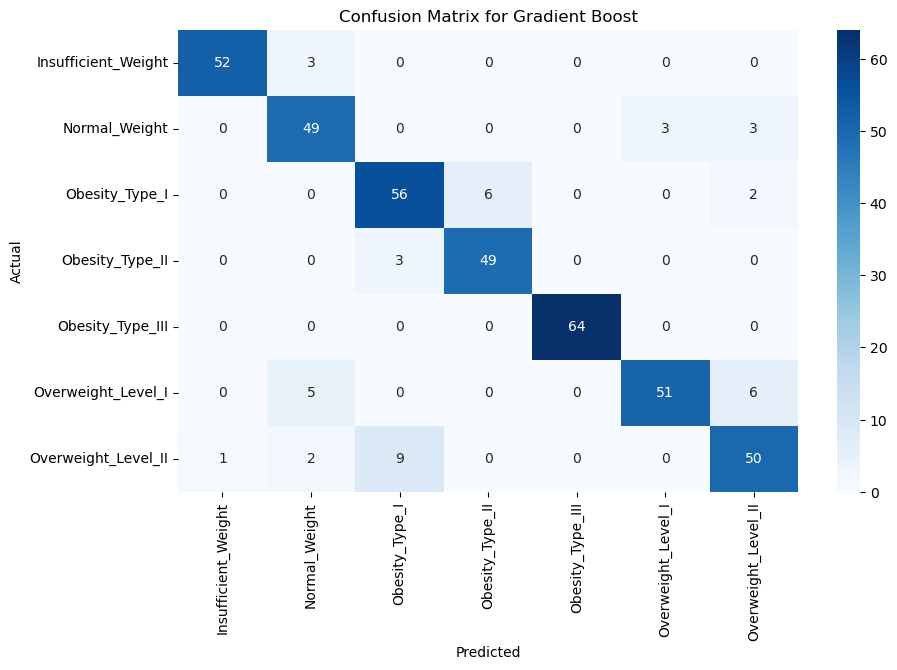

In [392]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix3_GrB, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Gradient Boost')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix3_GrB)
#disp.plot()
#plt.show()

In [393]:
clf_grb = OneVsRestClassifier(GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1))

In [394]:
clf_grb.fit(X_train,y_train)

OneVsRestClassifier(estimator=GradientBoostingClassifier(learning_rate=1.0,
                                                         max_depth=1))

In [395]:
pred_grb = clf_grb.predict(X_test)

In [396]:
pred_prob_grb = clf_grb.predict_proba(X_test)

In [397]:
fpr_grb={}
tpr_grb={}
thresh_grb={}
n_classes_grb = 7

In [398]:
for i in range(n_classes_grb):
    fpr_grb[i],tpr_grb[i],thresh_grb[i] = roc_curve(y_test, pred_prob_grb[:,i], pos_label=i)

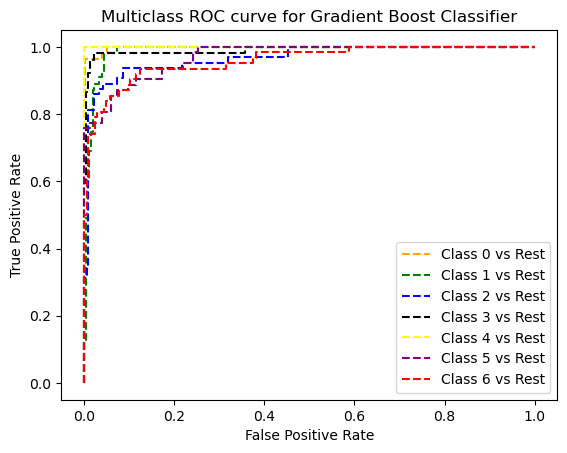

In [399]:
#Plotting
plt.plot(fpr_grb[0],tpr_grb[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_grb[1],tpr_grb[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_grb[2],tpr_grb[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_grb[3],tpr_grb[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_grb[4],tpr_grb[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_grb[5],tpr_grb[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_grb[6],tpr_grb[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for Gradient Boost Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('Multiclass ROC for Gradient Boost Classifier', dpi=300)
plt.show()

In [400]:
fpr1_grb, tpr1_grb, thresh1_grb = roc_curve(y_test, y_proba_GrB[:,1], pos_label=1)

In [401]:
random_probs_grb = [0 for i in range(len(y_test))]
p_fpr_grb, p_tpr_grb, _ = roc_curve(y_test,random_probs_grb,pos_label=1)

In [402]:
auc_score_grb = roc_auc_score(y_test, y_proba_GrB, multi_class='ovr')
print(auc_score_grb)

0.9892223499830192


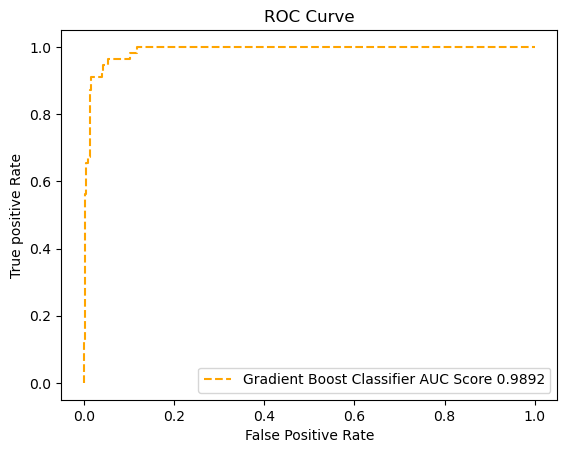

In [403]:
plt.plot(fpr1_grb, tpr1_grb, linestyle='--',color='orange', label='Gradient Boost Classifier AUC Score {:.4f}'.format(auc_score_grb))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [404]:
end_gb = time.time()

In [405]:
Training_time_gb = end_gb-start_gb

In [406]:
print("The time of execution of Gradient Boost Classifier Model is :",
      Training_time_gb , "ms")

The time of execution of Gradient Boost Classifier Model is : 34.8603241443634 ms


In [407]:
##AdaBoost (Adaptive Boosting)

In [408]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier

In [409]:
tree = DecisionTreeClassifier(criterion='entropy', random_state=1, max_depth=None)

In [410]:
bag = BaggingClassifier(base_estimator=tree, n_estimators=500, max_features=1.0, max_samples=.8, bootstrap=True, bootstrap_features=False, n_jobs=1, random_state=1)

In [411]:
#Compare single tree and bagging classifier

In [412]:
tree=tree.fit(X_train, y_train)

In [413]:
y_train_pred_dt = tree.fit(X_train, y_train)

In [414]:
y_test_pred_dt = tree.predict(X_test)

In [415]:
y_train_pred_dt = tree.predict(X_train)

In [416]:
tree_train = accuracy_score(y_train, y_train_pred_dt)

In [417]:
tree_test = accuracy_score(y_test, y_test_pred_dt)

In [418]:
tree_train

1.0

In [419]:
tree_test

0.855072463768116

In [420]:
bag = bag.fit(X_train,y_train)

In [421]:
y_train_pred_bag = bag.predict(X_train)

In [422]:
y_test_pred_bag = bag.predict(X_test)

In [423]:
bag_train = accuracy_score(y_train, y_train_pred_bag)

In [424]:
bag_test = accuracy_score(y_test, y_test_pred_bag)

In [425]:
bag_train

1.0

In [426]:
bag_test

0.8671497584541062

In [427]:
"""
from mlxtend.plotting import plot_decision_regions

plt.subplot(121)
plot_decision_regions(X,y,classifier=tree)
plt.title('Decision Tree')

plt.subplot(122)
plot_decision_regions(X,y,classifier=bag)
plt.title('Bagging')
plt.show()
"""

"\nfrom mlxtend.plotting import plot_decision_regions\n\nplt.subplot(121)\nplot_decision_regions(X,y,classifier=tree)\nplt.title('Decision Tree')\n\nplt.subplot(122)\nplot_decision_regions(X,y,classifier=bag)\nplt.title('Bagging')\nplt.show()\n"

In [428]:
#AdaBoost

In [429]:
# import classifier
from sklearn.ensemble import AdaBoostClassifier

In [430]:
start_dt_ada = time.time()

In [431]:
tree = DecisionTreeClassifier(max_depth=8, criterion='entropy', random_state=1)

In [432]:
ada = AdaBoostClassifier(base_estimator=tree, n_estimators=5000, random_state=1, learning_rate=0.1)

In [433]:
tree.fit(X_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=8, random_state=1)

In [434]:
ada.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(criterion='entropy',
                                                         max_depth=8,
                                                         random_state=1),
                   learning_rate=0.1, n_estimators=5000, random_state=1)

In [435]:
y_pred_test_ada = ada.predict(X_test)

In [436]:
y_pred_train_ada = ada.predict(X_train)

In [437]:
y_proba_ada = ada.predict_proba(X_test)

In [438]:
report6_rfc = classification_report(y_test, y_pred_test_ada)
print(f"Classification Report for AdaBoost Classifier: \n{report6_rfc}")

Classification Report for AdaBoost Classifier: 
              precision    recall  f1-score   support

           0       0.96      0.89      0.92        55
           1       0.82      0.91      0.86        55
           2       0.76      0.88      0.81        64
           3       0.92      0.94      0.93        52
           4       1.00      0.98      0.99        64
           5       0.98      0.89      0.93        62
           6       0.89      0.81      0.85        62

    accuracy                           0.90       414
   macro avg       0.91      0.90      0.90       414
weighted avg       0.91      0.90      0.90       414



In [439]:
acc_train_ada = accuracy_score(y_train, y_pred_train_ada)
acc_test_ada = accuracy_score(y_test, y_pred_test_ada)
prec_ada = precision_score(y_test, y_pred_test_ada, average='weighted')
recall_ada = recall_score(y_test, y_pred_test_ada, average='weighted')
f1_score_ada = f1_score(y_test, y_pred_test_ada, average='weighted')
auc_roc_log_ada = roc_auc_score(y_test, y_proba_ada, average='weighted', multi_class='ovr')

In [440]:
print('AdaBoost Classifier Accuracy Train percentage is:', round(acc_train_ada*100,2))
print('AdaBoost Classifier Accuracy percentage is:', round(acc_test_ada*100,2))
print('AdaBoost Classifier Precision percentage is:', round(prec_ada*100,2))
print('AdaBoost Classifier Recall percentage is:', round(recall_ada*100,2))
print('AdaBoost Classifier F1-score percentage is:', round(f1_score_ada*100,2))
print('AdaBoost Classifier AUC ROC percentage is:', auc_roc_log_ada)

AdaBoost Classifier Accuracy Train percentage is: 100.0
AdaBoost Classifier Accuracy percentage is: 89.86
AdaBoost Classifier Precision percentage is: 90.5
AdaBoost Classifier Recall percentage is: 89.86
AdaBoost Classifier F1-score percentage is: 89.99
AdaBoost Classifier AUC ROC percentage is: 0.9915090636559363


In [441]:
# Display the confusion matrix
conf_matrix6_ada= confusion_matrix(y_test, y_pred_test_ada)
display(conf_matrix6_ada)

array([[49,  6,  0,  0,  0,  0,  0],
       [ 2, 50,  2,  0,  0,  0,  1],
       [ 0,  1, 56,  4,  0,  0,  3],
       [ 0,  0,  3, 49,  0,  0,  0],
       [ 0,  0,  1,  0, 63,  0,  0],
       [ 0,  2,  3,  0,  0, 55,  2],
       [ 0,  2,  9,  0,  0,  1, 50]])

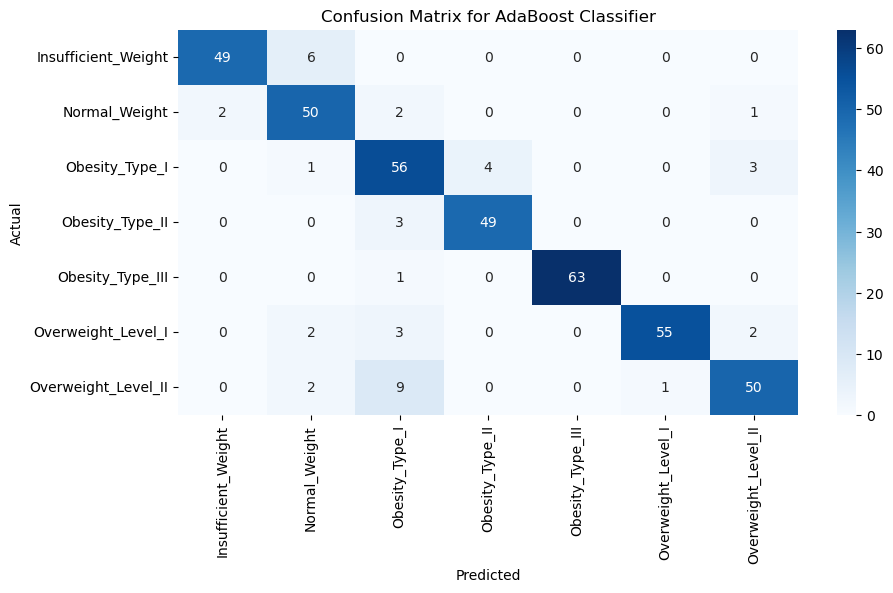

In [442]:
plt.figure(figsize=(10, 5))
sns.heatmap(conf_matrix6_ada, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for AdaBoost Classifier')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix6_ada)
#disp.plot()
#plt.show()

In [443]:
clf_ada = OneVsRestClassifier(AdaBoostClassifier(base_estimator=tree, n_estimators=5000, random_state=1, learning_rate=0.1))

In [444]:
clf_ada.fit(X_train,y_train)

OneVsRestClassifier(estimator=AdaBoostClassifier(base_estimator=DecisionTreeClassifier(criterion='entropy',
                                                                                       max_depth=8,
                                                                                       random_state=1),
                                                 learning_rate=0.1,
                                                 n_estimators=5000,
                                                 random_state=1))

In [445]:
pred_ada = clf_ada.predict(X_test)

In [446]:
pred_prob_ada = clf_ada.predict_proba(X_test)

In [447]:
fpr_ada={}
tpr_ada={}
thresh_ada={}
n_classes_ada = 7

In [448]:
for i in range(n_classes_ada):
    fpr_ada[i],tpr_ada[i],thresh_ada[i] = roc_curve(y_test, pred_prob_ada[:,i], pos_label=i)

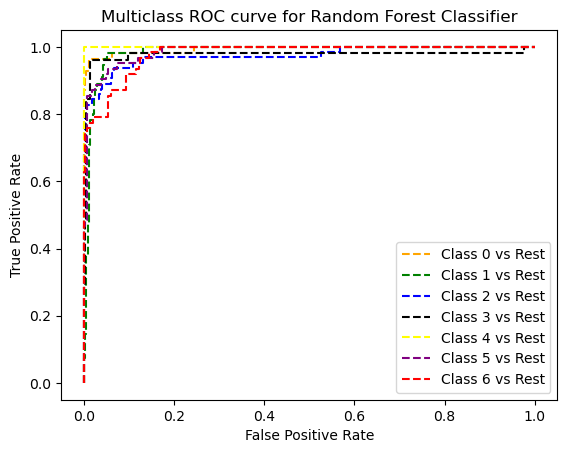

In [449]:
#Plotting
plt.plot(fpr_ada[0],tpr_ada[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_ada[1],tpr_ada[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_ada[2],tpr_ada[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_ada[3],tpr_ada[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_ada[4],tpr_ada[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_ada[5],tpr_ada[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_ada[6],tpr_ada[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for Random Forest Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('Multiclass ROC for Decision Tree AdaBoost Classifier', dpi=300)
plt.show()

In [450]:
fpr1_ada, tpr1_ada, thresh1_ada = roc_curve(y_test, y_proba_ada[:,1], pos_label=1)

In [451]:
random_probs_ada = [0 for i in range(len(y_test))]
p_fpr_ada, p_tpr_ada, _ = roc_curve(y_test,random_probs_ada,pos_label=1)

In [452]:
auc_score_ada = roc_auc_score(y_test, y_proba_ada, multi_class='ovr')
print(auc_score_ada)

0.9916131973397742


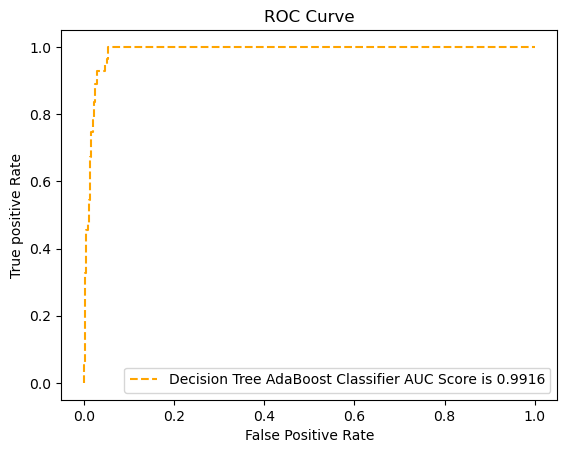

In [453]:
plt.plot(fpr1_ada, tpr1_ada, linestyle='--',color='orange', label='Decision Tree AdaBoost Classifier AUC Score is {:.4f}'.format(auc_score_ada))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [454]:
end_dt_ada = time.time()

In [455]:
Training_time_dt_ada = end_dt_ada-start_dt_ada

In [456]:
print("The time of execution of Decision Tree AdaBoost Classifier Model is :",
      Training_time_dt_ada , "ms")

The time of execution of Decision Tree AdaBoost Classifier Model is : 236.96630477905273 ms


In [457]:
#Random Forest Classifier

In [458]:
from sklearn.ensemble import RandomForestClassifier

In [459]:
start_rf = time.time()

In [460]:
model4_rfc = RandomForestClassifier(n_estimators=100, random_state=42)

In [461]:
model4_rfc = model4_rfc.fit(X_train,y_train)

In [462]:
y_pred_train_rfc = model4_rfc.predict(X_train)

In [463]:
y_pred_test_rfc = model4_rfc.predict(X_test)

In [464]:
y_proba_rfc = model4_rfc.predict_proba(X_test)

In [465]:
report4_rfc = classification_report(y_test, y_pred_test_rfc)
print(f"Classification Report for Random Forest Classifier: \n{report4_rfc}")

Classification Report for Random Forest Classifier: 
              precision    recall  f1-score   support

           0       0.98      0.93      0.95        55
           1       0.78      0.95      0.85        55
           2       0.95      0.92      0.94        64
           3       0.96      0.94      0.95        52
           4       0.98      1.00      0.99        64
           5       0.96      0.89      0.92        62
           6       0.92      0.89      0.90        62

    accuracy                           0.93       414
   macro avg       0.93      0.93      0.93       414
weighted avg       0.94      0.93      0.93       414



In [466]:
acc_train_rfc = accuracy_score(y_train, y_pred_train_rfc)
acc_test_rfc = accuracy_score(y_test, y_pred_test_rfc)
prec_rfc = precision_score(y_test, y_pred_test_rfc, average='weighted')
recall_rfc = recall_score(y_test, y_pred_test_rfc, average='weighted')
f1_score_rfc = f1_score(y_test, y_pred_test_rfc, average='weighted')
auc_roc_log_rfc = roc_auc_score(y_test, y_proba_rfc, average='weighted', multi_class='ovr')

In [467]:
print('Random Forest Classifier Accuracy Train percentage is:', round(acc_train_rfc*100,2))
print('Random Forest Classifier Accuracy percentage is:', round(acc_test_rfc*100,2))
print('Random Forest Classifier Precision percentage is:', round(prec_rfc*100,2))
print('Random Forest Classifier Recall percentage is:', round(recall_rfc*100,2))
print('Random Forest Classifier F1-score percentage is:', round(f1_score_rfc*100,2))
print('Random Forest Classifier AUC ROC percentage is:', auc_roc_log_rfc)

Random Forest Classifier Accuracy Train percentage is: 100.0
Random Forest Classifier Accuracy percentage is: 93.0
Random Forest Classifier Precision percentage is: 93.52
Random Forest Classifier Recall percentage is: 93.0
Random Forest Classifier F1-score percentage is: 93.1
Random Forest Classifier AUC ROC percentage is: 0.9936580969041588


In [468]:
# Display the confusion matrix
conf_matrix4_rfc= confusion_matrix(y_test, y_pred_test_rfc)
display(conf_matrix4_rfc)

array([[51,  4,  0,  0,  0,  0,  0],
       [ 1, 52,  0,  0,  0,  1,  1],
       [ 0,  0, 59,  2,  0,  1,  2],
       [ 0,  0,  1, 49,  1,  0,  1],
       [ 0,  0,  0,  0, 64,  0,  0],
       [ 0,  6,  0,  0,  0, 55,  1],
       [ 0,  5,  2,  0,  0,  0, 55]])

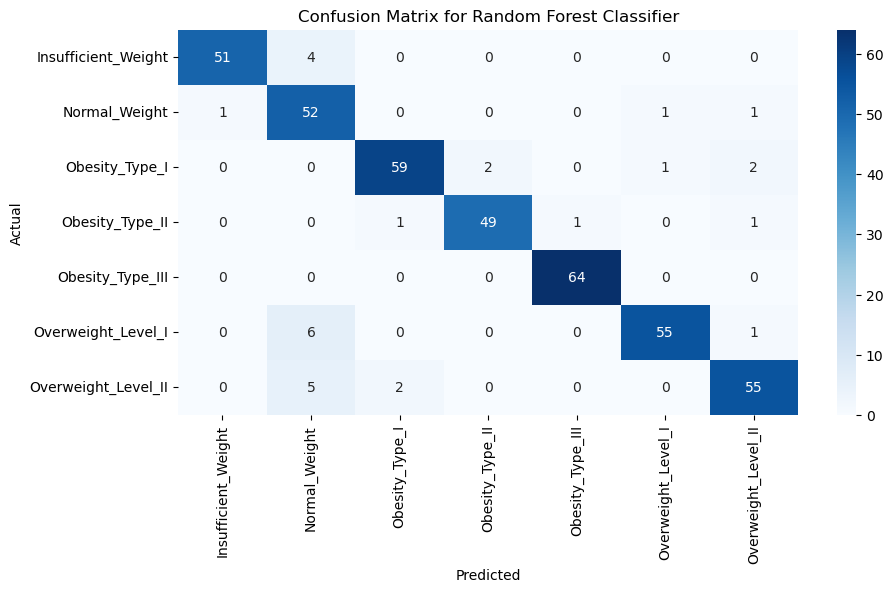

In [469]:
plt.figure(figsize=(10, 5))
sns.heatmap(conf_matrix4_rfc, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix4_RF)
#disp.plot()
#plt.show()

In [470]:
clf_rfc = OneVsRestClassifier(RandomForestClassifier(n_estimators=100, random_state=42))

In [471]:
clf_rfc.fit(X_train,y_train)

OneVsRestClassifier(estimator=RandomForestClassifier(random_state=42))

In [472]:
pred_rfc = clf_rfc.predict(X_test)

In [473]:
pred_prob_rfc = clf_rfc.predict_proba(X_test)

In [474]:
fpr_rfc={}
tpr_rfc={}
thresh_rfc={}
n_classes_rfc = 7

In [475]:
for i in range(n_classes_rfc):
    fpr_rfc[i],tpr_rfc[i],thresh_rfc[i] = roc_curve(y_test, pred_prob_rfc[:,i], pos_label=i)

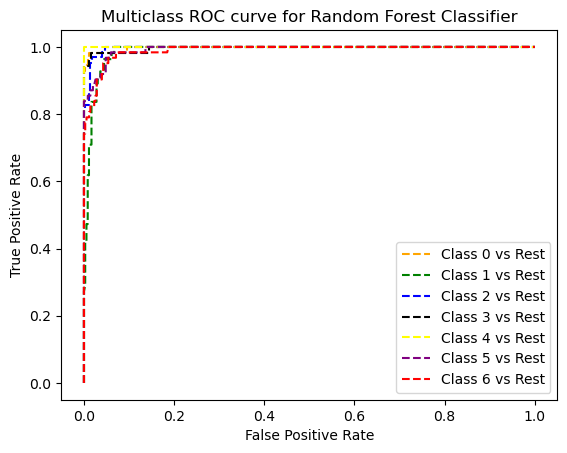

In [476]:
#Plotting
plt.plot(fpr_rfc[0],tpr_rfc[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_rfc[1],tpr_rfc[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_rfc[2],tpr_rfc[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_rfc[3],tpr_rfc[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_rfc[4],tpr_rfc[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_rfc[5],tpr_rfc[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_rfc[6],tpr_rfc[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for Random Forest Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('Multiclass ROC for Random Forest Classifier', dpi=300)
plt.show()

In [477]:
fpr1_rfc, tpr1_rfc, thresh1_rfc = roc_curve(y_test, y_proba_rfc[:,1], pos_label=1)

In [478]:
random_probs_rfc = [0 for i in range(len(y_test))]
p_fpr_rfc, p_tpr_rfc, _ = roc_curve(y_test,random_probs_rfc,pos_label=1)

In [479]:
auc_score_rfc = roc_auc_score(y_test, y_proba_rfc, multi_class='ovr')
print(auc_score_rfc)

0.9935563488825745


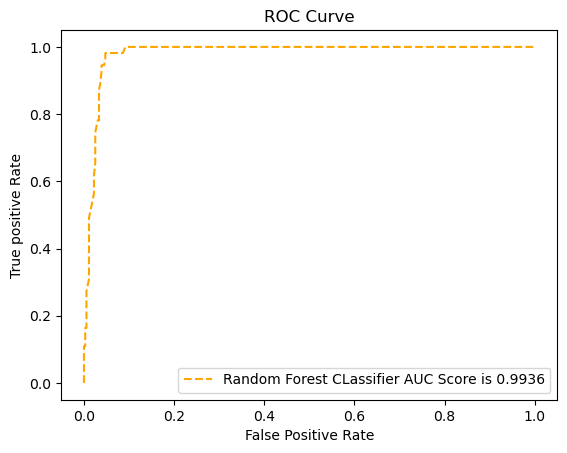

In [480]:
plt.plot(fpr1_rfc, tpr1_rfc, linestyle='--',color='orange', label='Random Forest CLassifier AUC Score is {:.4f}'.format(auc_score_rfc))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [481]:
end_rf = time.time()

In [482]:
Training_time_rf = end_rf-start_rf

In [483]:
print("The time of execution of Random Forest Classifier Model is :",
      Training_time_rf , "ms")

The time of execution of Random Forest Classifier Model is : 17.906788110733032 ms


In [484]:
#Support Vector Machine

In [485]:
from sklearn.svm import SVC

In [486]:
start_svc = time.time()

In [487]:
svc = SVC(probability=True, kernel='linear')

In [488]:
adb_svc = AdaBoostClassifier(n_estimators=100, random_state=42, base_estimator=svc, learning_rate=0.01)

In [489]:
model7_scv = adb_svc.fit(X_train,y_train)

In [490]:
y_pred_train_svc = model7_scv.predict(X_train)

In [491]:
y_pred_test_svc = model7_scv.predict(X_test)

In [492]:
y_proba_svc = model7_scv.predict_proba(X_test)

In [493]:
report7_svc = classification_report(y_test, y_pred_test_svc)
print(f"Classification Report for Support Vector Classifier: \n{report7_svc}")

Classification Report for Support Vector Classifier: 
              precision    recall  f1-score   support

           0       0.65      0.84      0.73        55
           1       0.55      0.42      0.47        55
           2       0.53      0.78      0.63        64
           3       0.83      0.94      0.88        52
           4       1.00      0.98      0.99        64
           5       0.84      0.69      0.76        62
           6       0.53      0.29      0.38        62

    accuracy                           0.71       414
   macro avg       0.70      0.71      0.69       414
weighted avg       0.71      0.71      0.69       414



In [494]:
acc_train_svc = accuracy_score(y_train, y_pred_train_svc)
acc_test_svc = accuracy_score(y_test, y_pred_test_svc)
prec_svc = precision_score(y_test, y_pred_test_svc, average='weighted')
recall_svc = recall_score(y_test, y_pred_test_svc, average='weighted')
f1_score_svc = f1_score(y_test, y_pred_test_svc, average='weighted')
auc_roc_log_svc = roc_auc_score(y_test, y_proba_svc, average='weighted', multi_class='ovr')

In [495]:
# Display the confusion matrix
conf_matrix7_svc= confusion_matrix(y_test, y_pred_test_svc)
display(conf_matrix7_svc)

array([[46,  9,  0,  0,  0,  0,  0],
       [24, 23,  0,  0,  0,  2,  6],
       [ 0,  1, 50,  9,  0,  1,  3],
       [ 0,  0,  1, 49,  0,  0,  2],
       [ 0,  0,  1,  0, 63,  0,  0],
       [ 1,  5,  8,  0,  0, 43,  5],
       [ 0,  4, 34,  1,  0,  5, 18]])

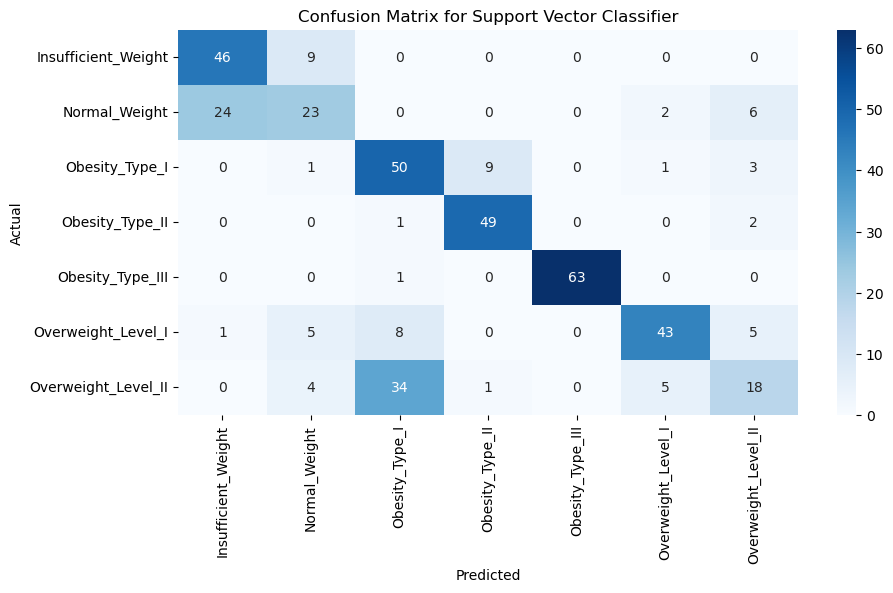

In [496]:
plt.figure(figsize=(10, 5))
sns.heatmap(conf_matrix7_svc, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Support Vector Classifier')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix4_RF)
#disp.plot()
#plt.show()

In [497]:
clf_svc = OneVsRestClassifier(AdaBoostClassifier(n_estimators=100, random_state=42, base_estimator=svc, learning_rate=0.01))

In [498]:
clf_svc.fit(X_train,y_train)

OneVsRestClassifier(estimator=AdaBoostClassifier(base_estimator=SVC(kernel='linear',
                                                                    probability=True),
                                                 learning_rate=0.01,
                                                 n_estimators=100,
                                                 random_state=42))

In [499]:
pred_svc = clf_svc.predict(X_test)

In [869]:
pred_prob_svc = clf_svc.predict_proba(X_test)

In [870]:
fpr_svc={}
tpr_svc={}
thresh_svc={}
n_classes_svc = 7

In [871]:
for i in range(n_classes_svc):
    fpr_svc[i],tpr_svc[i],thresh_svc[i] = roc_curve(y_test, pred_prob_svc[:,i], pos_label=i)

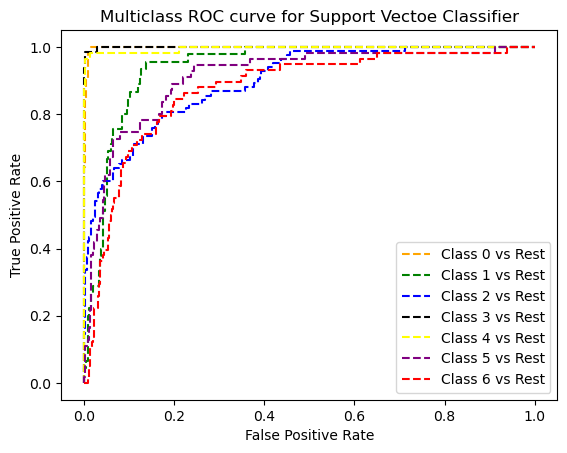

In [872]:
#Plotting
plt.plot(fpr_svc[0],tpr_svc[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_svc[1],tpr_svc[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_svc[2],tpr_svc[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_svc[3],tpr_svc[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_svc[4],tpr_svc[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_svc[5],tpr_svc[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_svc[6],tpr_svc[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for Support Vectoe Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('Multiclass ROC for Support Vector Classifier', dpi=300)
plt.show()

In [873]:
fpr1_svc, tpr1_svc, thresh1_svc = roc_curve(y_test, y_proba_svc[:,1], pos_label=1)

In [874]:
random_probs_svc = [0 for i in range(len(y_test))]
p_fpr_svc, p_tpr_svc, _ = roc_curve(y_test,random_probs_svc,pos_label=1)

In [875]:
auc_score_svc = roc_auc_score(y_test, y_proba_svc, multi_class='ovr')
print(auc_score_svc)

0.9528757791609264


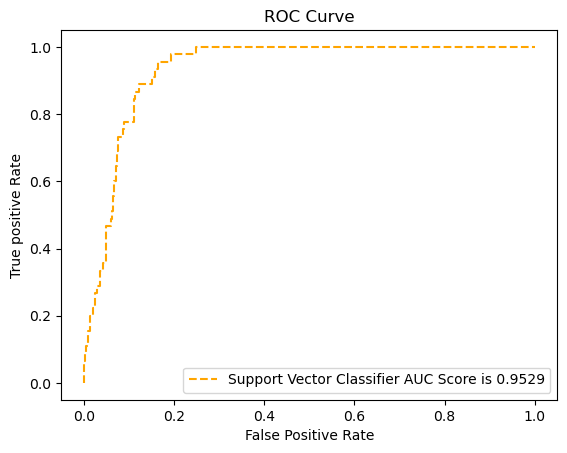

In [876]:
plt.plot(fpr1_svc, tpr1_svc, linestyle='--',color='orange', label='Support Vector Classifier AUC Score is {:.4f}'.format(auc_score_svc))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [877]:
end_svc = time.time()

In [878]:
Training_time_svc = end_svc-start_svc

In [879]:
print("The time of execution of Support Vector Classifier Model is :",
      Training_time_svc , "ms")

The time of execution of Support Vector Classifier Model is : 283.0424757003784 ms


In [880]:
#Decision Tree Classifier

In [881]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree

In [883]:
# Train decision tree classifiers
clf_underfit = DecisionTreeClassifier(max_depth=1, random_state=42)
clf_overfit = DecisionTreeClassifier(random_state=42)

clf_underfit.fit(X_train, y_train)
clf_overfit.fit(X_train, y_train)

# Predictions
y_pred_underfit = clf_underfit.predict(X_test)
y_pred_overfit = clf_overfit.predict(X_test)
# Calculate accuracy
accuracy_underfit = accuracy_score(y_test, y_pred_underfit)
accuracy_overfit = accuracy_score(y_test, y_pred_overfit)

print("Accuracy (Underfit): {:.2f}%".format(accuracy_underfit * 100))
print("Accuracy (Overfit): {:.2f}%".format(accuracy_overfit * 100))
#This code trains two decision tree classifiers: one with a maximum depth of 1 to induce underfitting, and one with unlimited depth to induce overfitting. It then makes predictions on the test set and calculates the accuracy of both models.

#Now, let's visualize the decision boundaries of both classifiers along with the training data.

Accuracy (Underfit): 33.09%
Accuracy (Overfit): 89.37%


In [884]:
start_dt = time.time()

In [885]:
model6_dtc = DecisionTreeClassifier(criterion='entropy',random_state=0)

In [886]:
model6_dtc = model6_dtc.fit(X_train,y_train)

In [887]:
y_pred_train_dtc = model6_dtc.predict(X_train)

In [888]:
y_pred_test_dtc = model6_dtc.predict(X_test)

In [889]:
y_proba_dtc = model6_dtc.predict_proba(X_test)

In [890]:
y_proba_dtc[:,1]

array([0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1.,
       0., 1., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0.,
       0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 1., 0., 0., 0.,
       0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 0.,
       0., 0., 0., 1., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 1., 0., 0.,
       1., 0., 0., 1., 0.

In [891]:
report6_dtc = classification_report(y_test, y_pred_test_dtc)
print(f"Classification Report for Decision Tree Classifier: \n{report6_dtc}")

Classification Report for Decision Tree Classifier: 
              precision    recall  f1-score   support

           0       0.78      0.85      0.81        53
           1       0.80      0.89      0.84        45
           2       0.99      0.98      0.98        83
           3       0.94      0.94      0.94        63
           4       0.90      0.95      0.92        57
           5       0.95      0.75      0.84        55
           6       0.93      0.93      0.93        58

    accuracy                           0.90       414
   macro avg       0.90      0.90      0.89       414
weighted avg       0.91      0.90      0.90       414



In [892]:
acc_train_dtc = accuracy_score(y_train, y_pred_train_dtc)
acc_test_dtc = accuracy_score(y_test, y_pred_test_dtc)
prec_dtc = precision_score(y_test, y_pred_test_dtc, average='weighted')
recall_dtc = recall_score(y_test, y_pred_test_dtc, average='weighted')
f1_score_dtc = f1_score(y_test, y_pred_test_dtc, average='weighted')
auc_roc_log_dtc = roc_auc_score(y_test, y_proba_dtc, average='weighted', multi_class='ovr')

In [893]:
print('Decision Tree Classifier Accuracy Train percentage is:', round(acc_train_dtc*100,2))
print('Decision Tree Classifier Accuracy percentage is:', round(acc_test_dtc*100,2))
print('Decision Tree Classifier Precision percentage is:', round(prec_dtc*100,2))
print('Decision Tree Classifier Recall percentage is:', round(recall_dtc*100,2))
print('Decision Tree Classifier F1-score percentage is:', round(f1_score_dtc*100,2))
print('Decision Tree Classifier AUC ROC percentage is:', auc_roc_log_dtc)

Decision Tree Classifier Accuracy Train percentage is: 100.0
Decision Tree Classifier Accuracy percentage is: 90.34
Decision Tree Classifier Precision percentage is: 90.79
Decision Tree Classifier Recall percentage is: 90.34
Decision Tree Classifier F1-score percentage is: 90.34
Decision Tree Classifier AUC ROC percentage is: 0.9444288904233454


In [894]:
# Display the confusion matrix
conf_matrix6_dtc = confusion_matrix(y_test, y_pred_test_dtc)
display(conf_matrix6_dtc)

array([[45,  6,  0,  0,  2,  0,  0],
       [ 5, 40,  0,  0,  0,  0,  0],
       [ 0,  0, 81,  1,  0,  0,  1],
       [ 0,  0,  0, 59,  4,  0,  0],
       [ 0,  0,  0,  3, 54,  0,  0],
       [ 8,  3,  0,  0,  0, 41,  3],
       [ 0,  1,  1,  0,  0,  2, 54]])

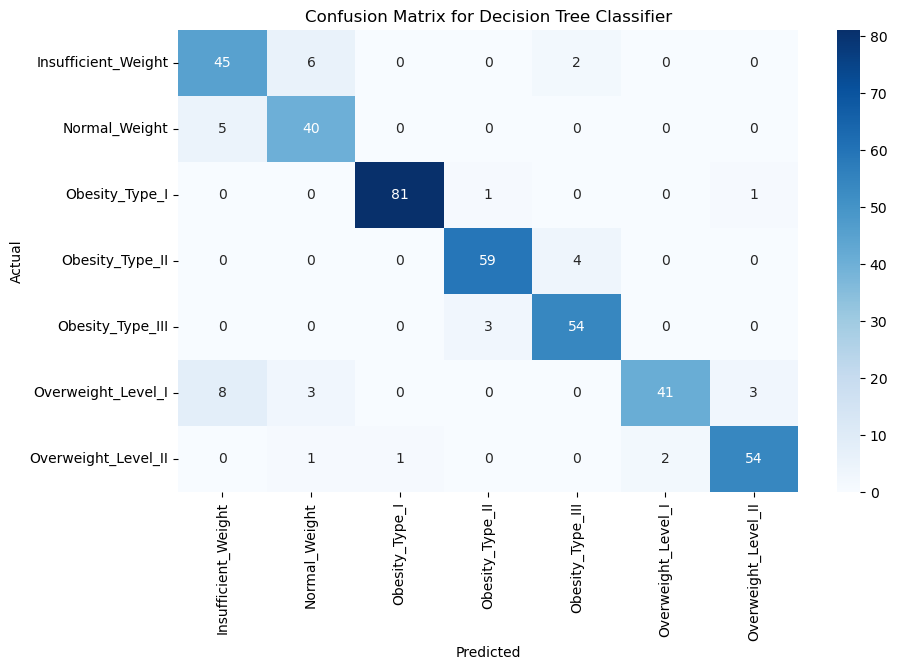

In [895]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix6_dtc, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Decision Tree Classifier')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix6_DT)
#disp.plot()
#plt.show()

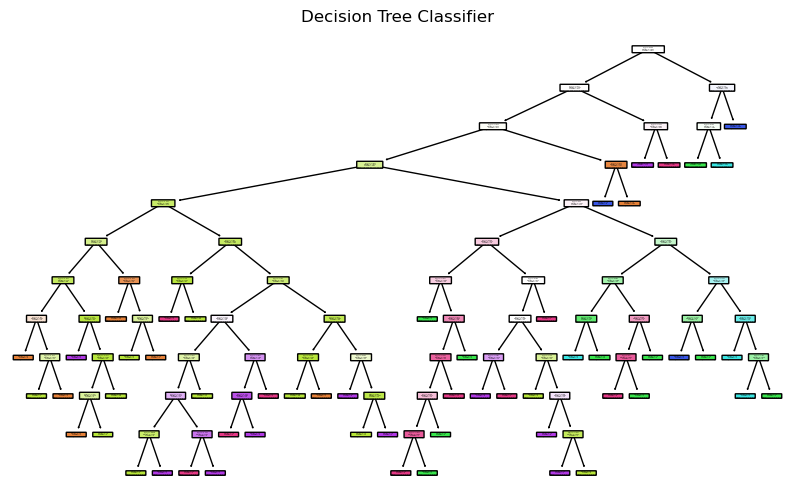

In [896]:
# Visualize the decision tree
plt.figure(figsize=(10, 6))
plot_tree(model6_dtc, filled=True, rounded=True)
plt.title('Decision Tree Classifier')
plt.show()

#, class_names=['Class 0', 'Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5', 'Class 6'], feature_names=['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Feature 5', 'Feature 6', 'Feature 7']

In [897]:
end_dt = time.time()

In [898]:
Training_time_dt = end_dt-start_dt

In [899]:
print("The time of execution of Decision Tree Classifier Model is :",
      Training_time_dt , "ms")

The time of execution of Decision Tree Classifier Model is : 10.855679988861084 ms


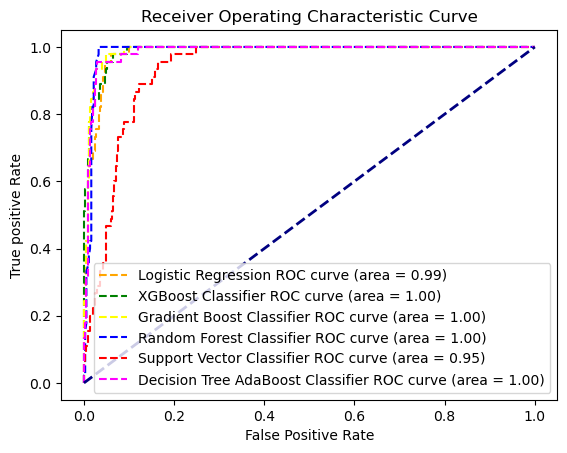

In [900]:
plt.plot(fpr1, tpr1, linestyle='--',color='orange', label='Logistic Regression ROC curve (area = %0.2f)' %auc_score1)
plt.plot(fpr1_xgb, tpr1_xgb, linestyle='--',color='green', label='XGBoost Classifier ROC curve (area = %0.2f)' %auc_score_xgb)
plt.plot(fpr1_grb, tpr1_grb, linestyle='--',color='yellow', label='Gradient Boost Classifier ROC curve (area = %0.2f)' %auc_score_grb)
plt.plot(fpr1_rfc, tpr1_rfc, linestyle='--',color='blue', label='Random Forest Classifier ROC curve (area = %0.2f)' %auc_score_rfc)
plt.plot(fpr1_svc, tpr1_svc, linestyle='--',color='red', label='Support Vector Classifier ROC curve (area = %0.2f)' %auc_score_svc)
plt.plot(fpr1_ada, tpr1_ada, linestyle='--',color='magenta', label='Decision Tree AdaBoost Classifier ROC curve (area = %0.2f)' %auc_score_ada)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--') 



plt.title('Receiver Operating Characteristic Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [901]:
import tensorflow as tf

2024-08-21 23:50:18.171037: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [902]:
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.models import Sequential

In [903]:
start_nn = time.time()

In [913]:
model = tf.keras.models.Sequential()

In [914]:
model.add(tf.keras.layers.Flatten(input_shape=(32,)))

In [915]:
model.add(tf.keras.layers.Dense(32,activation='relu'))

In [916]:
model.add(tf.keras.layers.Dense(64,activation='softmax'))

In [917]:
model.add(Dropout(0.001))

In [918]:
model.compile(optimizer='adam',
             loss='sparse_categorical_crossentropy',
             metrics=['accuracy'])

In [919]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_1 (Flatten)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,168 (12.38 KB)

 Trainable params: 3,168 (12.38 KB)

 Non-trainable params: 0 (0.00 B)

In [920]:
history = model.fit(X_train,y_train,
                   batch_size=64, epochs=150,
                   validation_split=0.2)

Epoch 1/150
21/21 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.0236 - loss: 4.4339 - val_accuracy: 0.0906 - val_loss: 3.9130
Epoch 2/150
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.1248 - loss: 3.8196 - val_accuracy: 0.1994 - val_loss: 3.3967
Epoch 3/150
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.2159 - loss: 3.3166 - val_accuracy: 0.2719 - val_loss: 2.8746
Epoch 4/150
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3194 - loss: 2.7625 - val_accuracy: 0.4411 - val_loss: 2.3710
Epoch 5/150
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4630 - loss: 2.2653 - val_accuracy: 0.4955 - val_loss: 1.9406
Epoch 6/150
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5199 - loss: 1.8646 - val_accuracy: 0.5166 - val_loss: 1.6185
Epoch 7/150
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5506 - loss: 1.5540 - val_accuracy: 0.5529 - val_loss: 1.3995
Epoch 8/150
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5906 - loss: 1.3833 - val_accuracy: 0.5740 - v

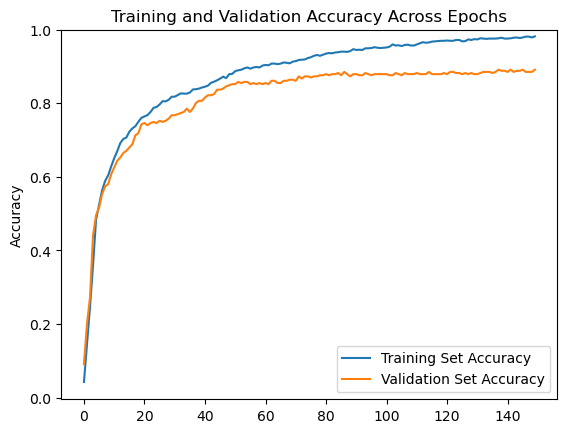

In [921]:
accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

plt.plot(accuracy, label='Training Set Accuracy')
plt.plot(validation_accuracy, label='Validation Set Accuracy')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy Across Epochs')
plt.legend()

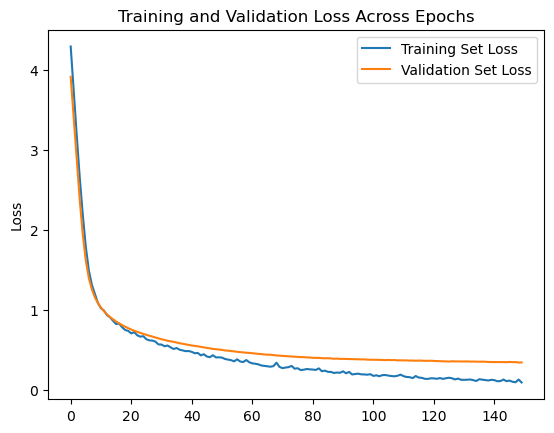

In [922]:
loss = history.history['loss']
validation_loss = history.history['val_loss']

plt.plot(loss, label='Training Set Loss')
plt.plot(validation_loss, label='Validation Set Loss')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Across Epochs')
plt.legend()

In [923]:
y_pred_train_nn = model.predict(X_train)
y_pred_train_nn = y_pred_train_nn.argmax(axis=1)

52/52 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [924]:
y_pred_test_nn = model.predict(X_test)
y_pred_test_nn = y_pred_test_nn.argmax(axis=1)

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


In [925]:
cm_nn = confusion_matrix(y_test, y_pred_test_nn)

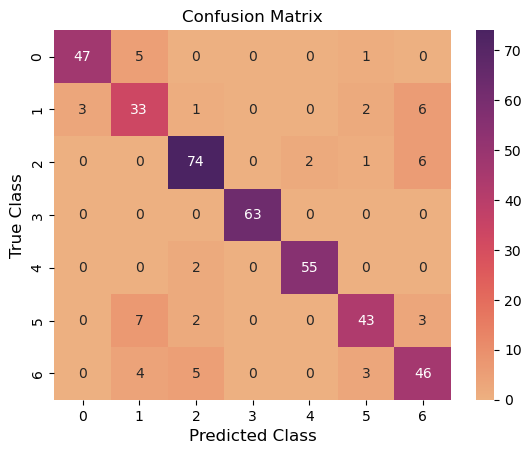

In [926]:
ax = sns.heatmap(cm_nn, cmap='flare', annot=True, fmt='d')
plt.xlabel("Predicted Class", fontsize=12)
plt.ylabel("True Class",fontsize=12)
plt.title("Confusion Matrix", fontsize=12)

plt.show()

In [927]:
print(classification_report(y_test,y_pred_test_nn))

              precision    recall  f1-score   support

           0       0.94      0.89      0.91        53
           1       0.67      0.73      0.70        45
           2       0.88      0.89      0.89        83
           3       1.00      1.00      1.00        63
           4       0.96      0.96      0.96        57
           5       0.86      0.78      0.82        55
           6       0.75      0.79      0.77        58

    accuracy                           0.87       414
   macro avg       0.87      0.86      0.87       414
weighted avg       0.88      0.87      0.87       414



In [928]:
acc_train_nn = accuracy_score(y_train, y_pred_train_nn)
acc_test_nn = accuracy_score(y_test, y_pred_test_nn)
prec_nn = precision_score(y_test, y_pred_test_nn, average='weighted')
recall_nn = recall_score(y_test, y_pred_test_nn, average='weighted')
f1_score_nn = f1_score(y_test, y_pred_test_nn, average='weighted')

In [929]:
print('Neural Network Accuracy Train percentage is:', round(acc_train_nn*100,2))
print('Neural Network Accuracyp Test Percentage is:', round(acc_test_nn*100,2))
print('Neural Network Precision percentage is:', round(prec_nn*100,2))
print('Neural Network Recall percentage is:', round(recall_nn*100,2))
print('Neural Network F1-score percentage is:', round(f1_score_nn*100,2))

Neural Network Accuracy Train percentage is: 96.43
Neural Network Accuracyp Test Percentage is: 87.2
Neural Network Precision percentage is: 87.51
Neural Network Recall percentage is: 87.2
Neural Network F1-score percentage is: 87.3


In [930]:
end_nn = time.time()

In [931]:
Training_time_nn = end_nn-start_nn

In [932]:
print("The time of execution of Recurrent Neural Network Model is :",
      Training_time_nn , "ms")

The time of execution of Recurrent Neural Network Model is : 184.82438707351685 ms


In [933]:
metrics = [[acc_train_lr,acc_test_lr,prec_lr,recall_lr,f1_score_lr,auc_roc_log_lr,Training_time_lr],
           [acc_train_xgb,acc_test_xgb,prec_xgb,recall_xgb,f1_score_xgb,auc_roc_log_xgb,Training_time_xg],
           [acc_train_GrB,acc_test_GrB,prec_GrB,recall_GrB,f1_score_GrB,auc_roc_log_GrB,Training_time_gb],
           [acc_train_rfc,acc_test_rfc,prec_rfc,recall_rfc,f1_score_rfc,auc_roc_log_rfc,Training_time_rf],
           [acc_train_dtc,acc_test_dtc,prec_dtc,recall_dtc,f1_score_dtc,auc_roc_log_dtc,Training_time_dt],
           [acc_train_ada,acc_test_ada,prec_ada,recall_ada,f1_score_ada,auc_roc_log_ada,Training_time_dt_ada],
           [acc_train_svc,acc_test_svc,prec_svc,recall_svc,f1_score_svc,auc_roc_log_svc,Training_time_svc],
           [acc_train_nn,acc_test_nn,prec_nn,recall_nn,f1_score_nn,'0.0','0.0']
          ]

In [934]:
Final_result = pd.DataFrame(metrics, columns=['Train Accuracy', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1 Score', 'AUC ROC Score', 'Training Time(ms)'],
                           index=['Logistic Regression','XGBoost','Gradient Boosting', 'Random Forest', 'Decision Tree Classifier', 'Decision Tree AdaBoost', 'Support Vector Machines', 'Recurrent Neural Network'])

In [937]:
Final_result.style.background_gradient(cmap='Blues', axis=1)

,Train Accuracy,Test Accuracy,Test Precision,Test Recall,Test F1 Score,AUC ROC Score,Training Time(ms)
Logistic Regression,0.913543,0.905797,0.909238,0.905797,0.906339,0.986336,2.412822
XGBoost,1.000000,0.910628,0.912351,0.910628,0.911155,0.996070,2.881193
Gradient Boosting,1.000000,0.934783,0.938453,0.934783,0.935476,0.996098,5.856821
Random Forest,1.000000,0.951691,0.955829,0.951691,0.952761,0.995724,4.651742
Decision Tree Classifier,1.000000,0.903382,0.907851,0.903382,0.903368,0.944429,10.855680
Decision Tree AdaBoost,1.000000,0.942029,0.943997,0.942029,0.942460,0.995887,3.196653
Support Vector Machines,0.792019,0.777778,0.771748,0.777778,0.771418,0.952132,283.042476
Recurrent Neural Network,0.964329,0.871981,0.875079,0.871981,0.872970,0.0,0.0


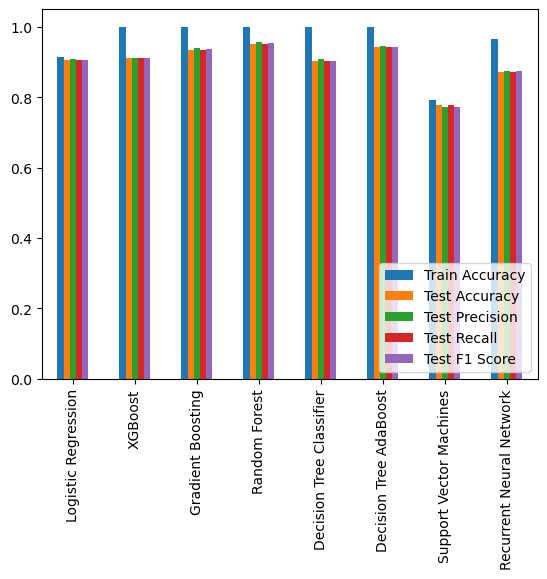

In [936]:
Final_result.plot(kind='bar')

plt.legend(loc = 'lower right')

In [ ]:
## Under sampling

In [938]:
from imblearn.under_sampling import RandomUnderSampler

In [939]:
resampler = RandomUnderSampler(random_state=0)
X_undersampled, y_undersampled = resampler.fit_resample(X, y)

<Axes: xlabel='nobeyesdad', ylabel='count'>

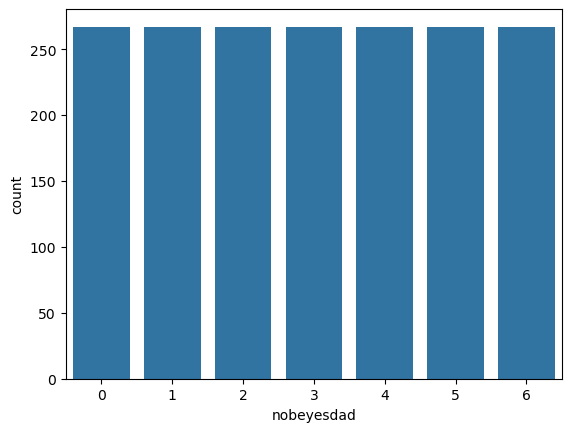

In [940]:
sns.countplot(x=y_undersampled)

In [941]:
## Over sampling

In [942]:
from imblearn.over_sampling import SMOTE

In [943]:
!pip install -U threadpoolctl

<Axes: xlabel='nobeyesdad', ylabel='count'>

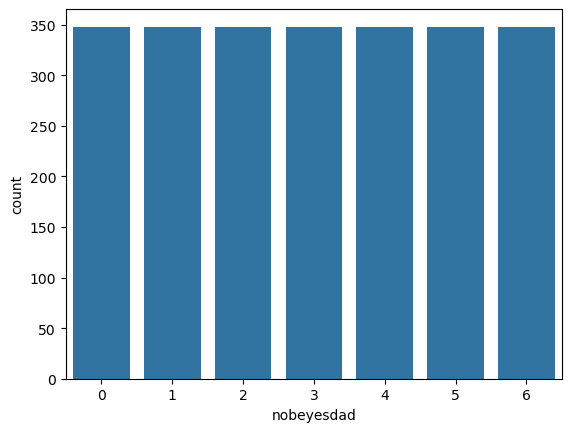

In [944]:
upsampling = SMOTE(random_state=0)
X_upsampling, y_upsampling = upsampling.fit_resample(X, y)

sns.countplot(x = y_upsampling)

In [945]:
X_train_down_s, X_test_down_s, y_train_down_s, y_test_down_s = train_test_split(X_undersampled, y_undersampled, test_size = 0.2, random_state = 42)

In [946]:
X_train_down_s.shape

(1495, 32)

In [947]:
y_train_down_s.shape

(1495,)

In [948]:
X_test_down_s.shape

(374, 32)

In [949]:
y_test_down_s.shape

(374,)

In [950]:
Scaler = preprocessing.StandardScaler()
X_train_down_s = Scaler.fit_transform(X_train_down_s)
X_test_down_s = Scaler.fit_transform(X_test_down_s)

In [951]:
X_train_down_s

array([[-0.43298424,  0.35565481,  0.55147671, ..., -0.16366342,
         0.22820167, -0.22820167],
       [-0.52370175, -0.99012602,  0.63866072, ..., -0.16366342,
         0.22820167, -0.22820167],
       [ 1.66863809,  0.29786907, -1.02179459, ..., -0.16366342,
         0.22820167, -0.22820167],
       ...,
       [ 1.10585353, -0.25274271,  1.55931451, ..., -0.16366342,
         0.22820167, -0.22820167],
       [-0.40946488, -0.94227234, -0.71028401, ..., -0.16366342,
         0.22820167, -0.22820167],
       [ 1.4384844 ,  0.26831683, -0.21074142, ..., -0.16366342,
         0.22820167, -0.22820167]])

In [952]:
X_train_down_s.shape

(1495, 32)

In [953]:
X_test_down_s

array([[ 0.06410981,  0.97159242,  0.85698807, ..., -0.19720266,
         0.21821789, -0.21821789],
       [-1.56541572, -0.50268612, -0.31936518, ..., -0.19720266,
         0.21821789, -0.21821789],
       [ 0.86241272,  0.99588528,  2.28139712, ..., -0.19720266,
         0.21821789, -0.21821789],
       ...,
       [-1.52920404, -0.34836145, -0.31936518, ..., -0.19720266,
         0.21821789, -0.21821789],
       [-0.87739383, -0.34836145,  0.42618682, ..., -0.19720266,
         0.21821789, -0.21821789],
       [-0.56301062, -0.61930017, -1.4996166 , ..., -0.19720266,
         0.21821789, -0.21821789]])

In [954]:
X_test_down_s.shape

(374, 32)

In [955]:
start_lr_downsample = time.time()

In [956]:
model1_lr_downsample = LogisticRegression(max_iter=100)

In [957]:
model1_lr_downsample.fit(X_train_down_s,y_train_down_s)

LogisticRegression()

In [958]:
y_pred_train_lr_downsample = model1_lr_downsample.predict(X_train_down_s)

In [959]:
y_pred_test_lr_downsample = model1_lr_downsample.predict(X_test_down_s)

In [960]:
y_proba_lr_downsample = model1_lr_downsample.predict_proba(X_test_down_s)

In [961]:
report1_lr_downsample = classification_report(y_test_down_s, y_pred_test_lr_downsample)
print(f"Classification Report: \n{report1_lr_downsample}")

Classification Report: 
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        51
           1       0.85      0.84      0.85        62
           2       0.89      0.91      0.90        56
           3       0.94      1.00      0.97        48
           4       0.95      1.00      0.97        54
           5       0.71      0.69      0.70        51
           6       0.78      0.69      0.73        52

    accuracy                           0.87       374
   macro avg       0.87      0.88      0.87       374
weighted avg       0.87      0.87      0.87       374



In [962]:
acc_train_lr_downsample = accuracy_score(y_train_down_s, y_pred_train_lr_downsample)
acc_test_lr_downsample = accuracy_score(y_test_down_s, y_pred_test_lr_downsample)
prec_lr_downsample = precision_score(y_test_down_s, y_pred_test_lr_downsample, average='weighted')
recall_lr_downsample = recall_score(y_test_down_s, y_pred_test_lr_downsample, average='weighted')
f1_score_lr_downsample = f1_score(y_test_down_s, y_pred_test_lr_downsample, average='weighted')
auc_roc_log_lr_downsample = roc_auc_score(y_test_down_s, y_proba_lr_downsample, average='weighted', multi_class='ovr')

In [963]:
print('Logistic Regression DownSampling Accuracy Train percentage is:', round(acc_train_lr_downsample*100,2))
print('Logistic Regression DownSampling Accuracy percentage is:', round(acc_test_lr_downsample*100,2))
print('Logistic Regression DownSampling Precision percentage is:', round(prec_lr_downsample*100,2))
print('Logistic Regression DownSampling Recall percentage is:', round(recall_lr_downsample*100,2))
print('Logistic Regression DownSampling F1-score percentage is:', round(f1_score_lr_downsample*100,2))
print('Logistic Regression DownSampling AUC ROC percentage is:', auc_roc_log_lr_downsample)

Logistic Regression DownSampling Accuracy Train percentage is: 91.04
Logistic Regression DownSampling Accuracy percentage is: 87.43
Logistic Regression DownSampling Precision percentage is: 87.03
Logistic Regression DownSampling Recall percentage is: 87.43
Logistic Regression DownSampling F1-score percentage is: 87.16
Logistic Regression DownSampling AUC ROC percentage is: 0.9839976485859401


In [964]:
clf_lr_downsample = OneVsRestClassifier(LogisticRegression())

In [965]:
clf_lr_downsample.fit(X_train_down_s,y_train_down_s)

OneVsRestClassifier(estimator=LogisticRegression())

In [966]:
pred_lr_downsample = clf_lr_downsample.predict(X_test_down_s)

In [967]:
pred_prob_lr_downsample = clf_lr_downsample.predict_proba(X_test_down_s)

In [968]:
fpr_lr_down={}
tpr_lr_down={}
thresh_lr_down={}
n_classes_lr_down = 7

In [969]:
for i in range(n_classes):
    fpr_lr_down[i],tpr_lr_down[i],thresh_lr_down[i] = roc_curve(y_test_down_s, pred_prob_lr_downsample[:,i], pos_label=i)

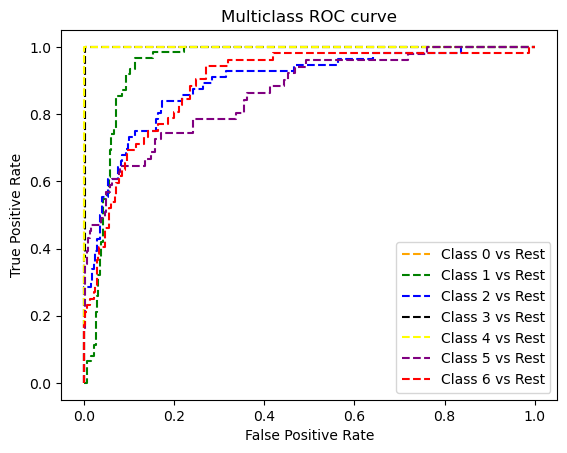

In [970]:
#Plotting
plt.plot(fpr_lr_down[0],tpr_lr_down[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_lr_down[1],tpr_lr_down[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_lr_down[2],tpr_lr_down[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_lr_down[3],tpr_lr_down[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_lr_down[4],tpr_lr_down[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_lr_down[5],tpr_lr_down[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_lr_down[6],tpr_lr_down[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('Multiclass ROC', dpi=300)
plt.show()

In [971]:
fpr1_lr_down, tpr1_lr_down, thresh1_lr_down = roc_curve(y_test_down_s, y_proba_lr_downsample[:,1], pos_label=1)

In [972]:
random_probs_lr_downsample = [0 for i in range(len(y_test_down_s))]
p_fpr_lr_down, p_tpr_lr_down, _ = roc_curve(y_test_down_s,random_probs_lr_downsample,pos_label=1)

In [973]:
auc_score1_lr_down = roc_auc_score(y_test_down_s, y_proba_lr_downsample, multi_class='ovr')
print(auc_score1_lr_down)

0.9840930095450132


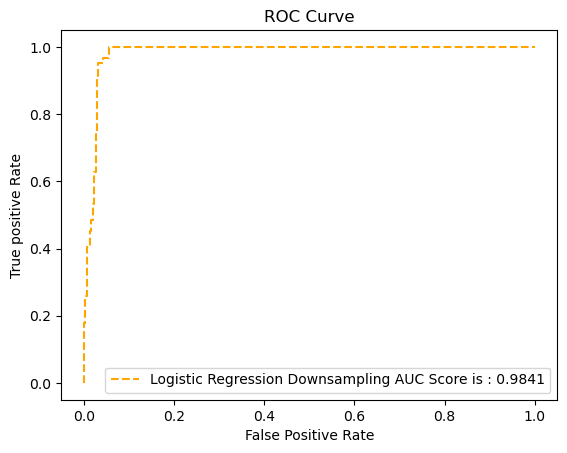

In [974]:
plt.plot(fpr1_lr_down, tpr1_lr_down, linestyle='--',color='orange', label='Logistic Regression Downsampling AUC Score is : {:.4f}'.format(auc_score1_lr_down))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [975]:
# Display the confusion matrix
conf_matrix1_lr_down = confusion_matrix(y_test_down_s, y_pred_test_lr_downsample)
display(conf_matrix1_lr_down)

array([[51,  0,  0,  0,  0,  0,  0],
       [ 2, 52,  0,  0,  0,  7,  1],
       [ 0,  1, 51,  2,  2,  0,  0],
       [ 0,  0,  0, 48,  0,  0,  0],
       [ 0,  0,  0,  0, 54,  0,  0],
       [ 0,  7,  0,  0,  0, 35,  9],
       [ 0,  1,  6,  1,  1,  7, 36]])

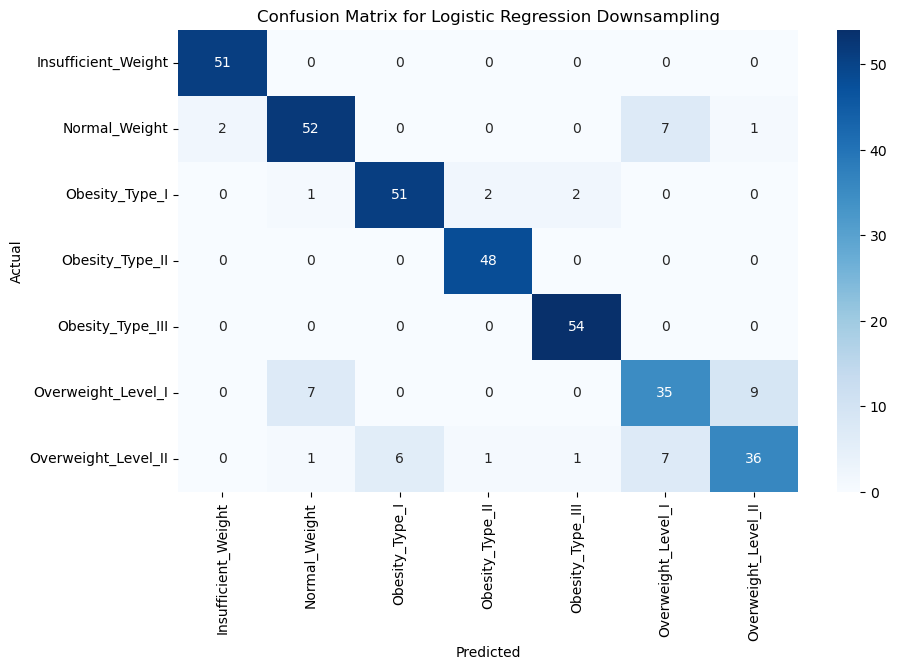

In [976]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix1_lr_down, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Logistic Regression Downsampling')
plt.show()


#disp = ConfusionMatrixDisplay(conf_matrix1_lr_down)
#disp.plot()
#plt.show()

In [977]:
end_lr_downsample = time.time()

In [978]:
Training_time_lr_downsample = end_lr_downsample - start_lr_downsample

In [979]:
print("The time of execution of Logistic Regression Downsampling Model is :",
      Training_time_lr_downsample , "ms")

The time of execution of Logistic Regression Downsampling Model is : 11.522665023803711 ms


In [980]:
##XGBoost Classifier

In [981]:
start_xg_down = time.time()

In [982]:
model2_xgb_down = XGBClassifier(random_state=42, n_estimators=100, max_depth=20, min_samples_split=2, min_samples_leaf=1)

In [983]:
model2_xgb_down = model2_xgb_down.fit(X_train_down_s,y_train_down_s)

In [984]:
y_pred_train_xgb_down = model2_xgb_down.predict(X_train_down_s)

In [985]:
y_pred_test_xgb_down = model2_xgb_down.predict(X_test_down_s)

In [986]:
y_proba_xgb_down = model2_xgb_down.predict_proba(X_test_down_s)

In [987]:
report2_xgb_down = classification_report(y_test_down_s, y_pred_test_xgb_down)
print(f"Classification Report: \n{report2_xgb_down}")

Classification Report: 
              precision    recall  f1-score   support

           0       0.86      0.82      0.84        51
           1       0.94      0.77      0.85        62
           2       0.96      0.86      0.91        56
           3       0.92      0.96      0.94        48
           4       0.96      1.00      0.98        54
           5       0.64      0.84      0.73        51
           6       0.90      0.88      0.89        52

    accuracy                           0.87       374
   macro avg       0.88      0.88      0.88       374
weighted avg       0.89      0.87      0.88       374



In [988]:
acc_train_xgb_down = accuracy_score(y_train_down_s, y_pred_train_xgb_down)
acc_test_xgb_down = accuracy_score(y_test_down_s, y_pred_test_xgb_down)
prec_xgb_down = precision_score(y_test_down_s, y_pred_test_xgb_down, average='weighted')
recall_xgb_down = recall_score(y_test_down_s, y_pred_test_xgb_down, average='weighted')
f1_score_xgb_down = f1_score(y_test_down_s, y_pred_test_xgb_down, average='weighted')
auc_roc_log_xgb_down = roc_auc_score(y_test_down_s, y_proba_xgb_down, average='weighted', multi_class='ovr')

In [989]:
print('XGBoost Classifier Downsampling Accuracy Train percentage is:', round(acc_train_xgb_down*100,2))
print('XGBoost Classifier Downsampling Accuracy percentage is:', round(acc_test_xgb_down*100,2))
print('XGBoost Classifier Downsampling Precision percentage is:', round(prec_xgb_down*100,2))
print('XGBoost Classifier Downsampling Recall percentage is:', round(recall_xgb_down*100,2))
print('XGBoost Classifier Downsampling F1-score percentage is:', round(f1_score_xgb_down*100,2))
print('XGBoost Classifier Downsampling AUC ROC percentage is:', auc_roc_log_xgb_down)

XGBoost Classifier Downsampling Accuracy Train percentage is: 100.0
XGBoost Classifier Downsampling Accuracy percentage is: 87.43
XGBoost Classifier Downsampling Precision percentage is: 88.69
XGBoost Classifier Downsampling Recall percentage is: 87.43
XGBoost Classifier Downsampling F1-score percentage is: 87.68
XGBoost Classifier Downsampling AUC ROC percentage is: 0.9908340406376938


In [990]:
# Display the confusion matrix
conf_matrix2_xgb_down = confusion_matrix(y_test_down_s, y_pred_test_xgb_down)
display(conf_matrix2_xgb_down)

array([[42,  0,  0,  0,  0,  9,  0],
       [ 7, 48,  0,  0,  0,  7,  0],
       [ 0,  0, 48,  4,  0,  4,  0],
       [ 0,  0,  0, 46,  2,  0,  0],
       [ 0,  0,  0,  0, 54,  0,  0],
       [ 0,  3,  0,  0,  0, 43,  5],
       [ 0,  0,  2,  0,  0,  4, 46]])

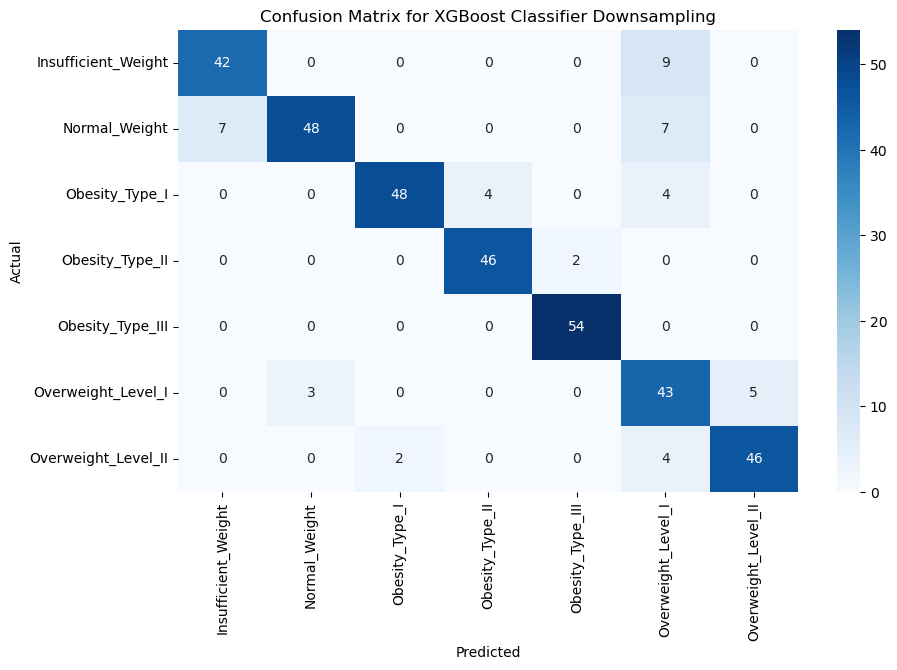

In [991]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix2_xgb_down, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for XGBoost Classifier Downsampling')
plt.show()



#disp = ConfusionMatrixDisplay(conf_matrix2_xgb_down)
#disp.plot()
#plt.show()

In [992]:
clf1_xgb_down = OneVsRestClassifier(XGBClassifier(random_state=42, n_estimators=100, max_depth=20, min_samples_split=2, min_samples_leaf=1))

In [993]:
clf1_xgb_down.fit(X_train_down_s,y_train_down_s)

OneVsRestClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=20,
                                            max_leaves=None,
                                            min_child_weight=None,
                                            min_samples_leaf=1,
                                            min_samples_split=2, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=100, n_jobs=None, ...))

In [994]:
pred1_xgb_down = clf1_xgb_down.predict(X_test_down_s)

In [995]:
pred_prob_xgb_down = clf1_xgb_down.predict_proba(X_test_down_s)

In [996]:
fpr_xgb_down={}
tpr_xgb_down={}
thresh_xgb_down={}
n_classes_xgb_down = 7

In [997]:
for i in range(n_classes_xgb_down):
    fpr_xgb_down[i],tpr_xgb_down[i],thresh_xgb_down[i] = roc_curve(y_test_down_s, pred_prob_xgb_down[:,i], pos_label=i)

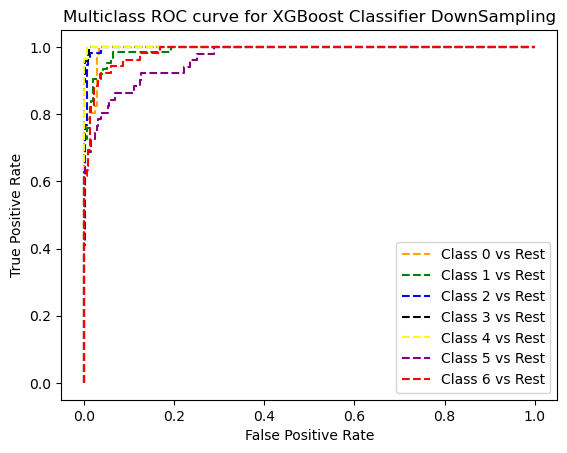

In [998]:
#Plotting
plt.plot(fpr_xgb_down[0],tpr_xgb_down[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_xgb_down[1],tpr_xgb_down[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_xgb_down[2],tpr_xgb_down[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_xgb_down[3],tpr_xgb_down[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_xgb_down[4],tpr_xgb_down[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_xgb_down[5],tpr_xgb_down[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_xgb_down[6],tpr_xgb_down[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for XGBoost Classifier DownSampling')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('Multiclass ROC for XGBoost Classifier', dpi=300)
plt.show()

In [999]:
fpr1_xgb_down, tpr1_xgb_down, thresh1_xgb_down = roc_curve(y_test_down_s, y_proba_xgb_down[:,1], pos_label=1)

In [1000]:
random_probs_xgb_down = [0 for i in range(len(y_test_down_s))]
p_fpr_xgb_down, p_tpr_xgb_down, _ = roc_curve(y_test_down_s,random_probs_xgb_down,pos_label=1)

In [1001]:
auc_score_xgb_down = roc_auc_score(y_test_down_s, y_proba_xgb_down, multi_class='ovr')
print(auc_score_xgb_down)

0.9906897518059229


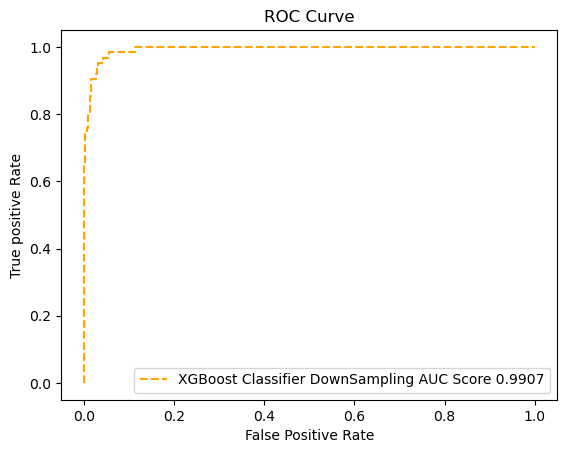

In [1002]:
plt.plot(fpr1_xgb_down, tpr1_xgb_down, linestyle='--',color='orange', label='XGBoost Classifier DownSampling AUC Score {:.4f}'.format(auc_score_xgb_down))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [1003]:
end_xg_down = time.time()

In [1004]:
Training_time_xg_down = end_xg_down-start_xg_down

In [1005]:
print("The time of execution of XGBoost DownSampling Classifier Model is :",
      Training_time_xg_down , "ms")

The time of execution of XGBoost DownSampling Classifier Model is : 12.885085105895996 ms


In [1006]:
##Gradient Boost Classifier

In [1007]:
start_gb_down = time.time()

In [1008]:
model3_GrB_down = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1)

In [1009]:
model3_GrB_down = model3_GrB_down.fit(X_train_down_s,y_train_down_s)

In [1010]:
y_pred_train_GrB_down = model3_GrB_down.predict(X_train_down_s)

In [1011]:
y_pred_test_GrB_down = model3_GrB_down.predict(X_test_down_s)

In [1012]:
y_proba_GrB_down = model3_GrB_down.predict_proba(X_test_down_s)

In [1013]:
report3_GrB_down = classification_report(y_test_down_s, y_pred_test_GrB_down)
print(f"Classification Report: \n{report3_GrB_down}")

Classification Report: 
              precision    recall  f1-score   support

           0       0.92      0.96      0.94        51
           1       0.84      0.82      0.83        62
           2       0.96      0.91      0.94        56
           3       0.96      1.00      0.98        48
           4       1.00      1.00      1.00        54
           5       0.79      0.75      0.77        51
           6       0.84      0.88      0.86        52

    accuracy                           0.90       374
   macro avg       0.90      0.90      0.90       374
weighted avg       0.90      0.90      0.90       374



In [1014]:
acc_train_GrB_down = accuracy_score(y_train_down_s, y_pred_train_GrB_down)
acc_test_GrB_down = accuracy_score(y_test_down_s, y_pred_test_GrB_down)
prec_GrB_down = precision_score(y_test_down_s, y_pred_test_GrB_down, average='weighted')
recall_GrB_down = recall_score(y_test_down_s, y_pred_test_GrB_down, average='weighted')
f1_score_GrB_down = f1_score(y_test_down_s, y_pred_test_GrB_down, average='weighted')
auc_roc_log_GrB_down = roc_auc_score(y_test_down_s, y_proba_GrB_down, average='weighted', multi_class='ovr')

In [1015]:
print('Gradient Boost Downsampling Accuracy Train percentage is:', round(acc_train_GrB_down*100,2))
print('Gradient Boost Downsampling Accuracy percentage is:', round(acc_test_GrB_down*100,2))
print('Gradient Boost Downsampling Precision percentage is:', round(prec_GrB_down*100,2))
print('Gradient Boost Downsampling Recall percentage is:', round(recall_GrB_down*100,2))
print('Gradient Boost Downsampling F1-score percentage is:', round(f1_score_GrB_down*100,2))
print('Gradient Boost Downsampling AUC ROC percentage is:', auc_roc_log_GrB_down)

Gradient Boost Downsampling Accuracy Train percentage is: 100.0
Gradient Boost Downsampling Accuracy percentage is: 90.11
Gradient Boost Downsampling Precision percentage is: 90.06
Gradient Boost Downsampling Recall percentage is: 90.11
Gradient Boost Downsampling F1-score percentage is: 90.04
Gradient Boost Downsampling AUC ROC percentage is: 0.9922325395415803


In [1016]:
# Display the confusion matrix
conf_matrix3_GrB_down = confusion_matrix(y_test_down_s, y_pred_test_GrB_down)
display(conf_matrix3_GrB_down)

array([[49,  2,  0,  0,  0,  0,  0],
       [ 4, 51,  0,  0,  0,  7,  0],
       [ 0,  1, 51,  2,  0,  0,  2],
       [ 0,  0,  0, 48,  0,  0,  0],
       [ 0,  0,  0,  0, 54,  0,  0],
       [ 0,  6,  0,  0,  0, 38,  7],
       [ 0,  1,  2,  0,  0,  3, 46]])

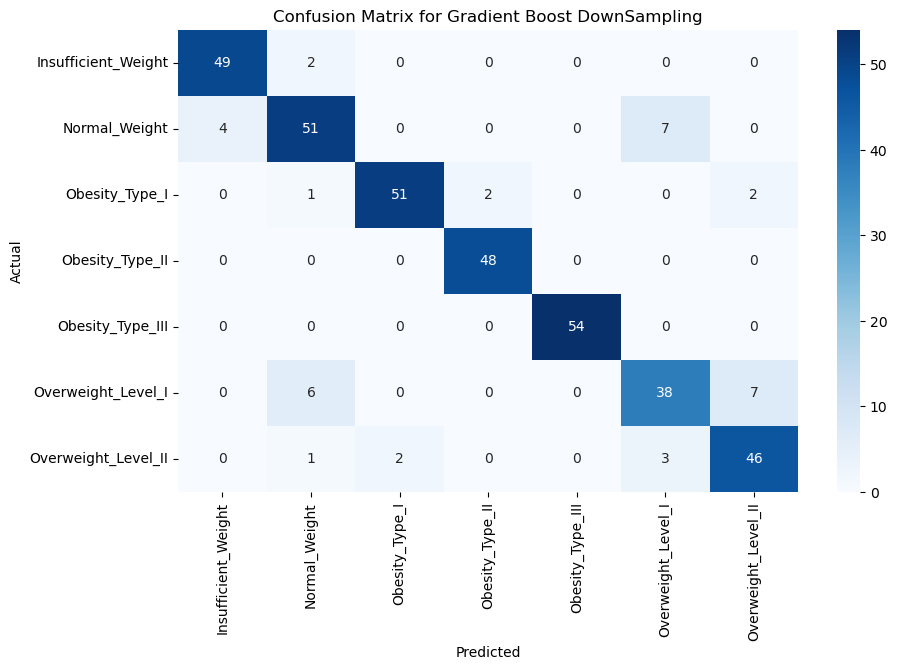

In [1017]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix3_GrB_down, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Gradient Boost DownSampling')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix3_GrB_down)
#disp.plot()
#plt.show()

In [1018]:
clf_grb_down = OneVsRestClassifier(GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1))

In [1019]:
clf_grb_down.fit(X_train_down_s,y_train_down_s)

OneVsRestClassifier(estimator=GradientBoostingClassifier(learning_rate=1.0,
                                                         max_depth=1))

In [1020]:
pred_grb_down = clf_grb_down.predict(X_test_down_s)

In [1021]:
pred_prob_grb_down = clf_grb_down.predict_proba(X_test_down_s)

In [1022]:
fpr_grb_down={}
tpr_grb_down={}
thresh_grb_down={}
n_classes_grb_down = 7

In [1023]:
for i in range(n_classes_grb_down):
    fpr_grb_down[i],tpr_grb_down[i],thresh_grb_down[i] = roc_curve(y_test_down_s, pred_prob_grb_down[:,i], pos_label=i)

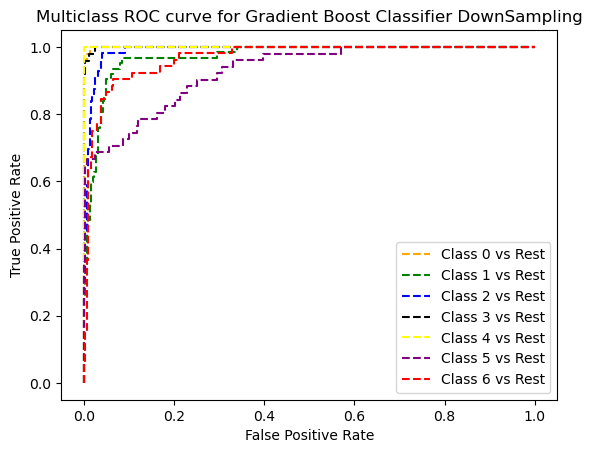

In [1024]:
#Plotting
plt.plot(fpr_grb_down[0],tpr_grb_down[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_grb_down[1],tpr_grb_down[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_grb_down[2],tpr_grb_down[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_grb_down[3],tpr_grb_down[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_grb_down[4],tpr_grb_down[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_grb_down[5],tpr_grb_down[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_grb_down[6],tpr_grb_down[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for Gradient Boost Classifier DownSampling')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC for Gradient Boost Classifier DownSampling', dpi=300)

In [1025]:
fpr1_grb_down, tpr1_grb_down, thresh1_grb_down = roc_curve(y_test_down_s, y_proba_GrB_down[:,1], pos_label=1)

In [1026]:
random_probs_grb_down = [0 for i in range(len(y_test_down_s))]
p_fpr_grb_down, p_tpr_grb_down, _ = roc_curve(y_test_down_s,random_probs_grb_down,pos_label=1)

In [1027]:
auc_score_grb_down = roc_auc_score(y_test_down_s, y_proba_GrB_down, multi_class='ovr')
print(auc_score_grb_down)

0.9924283273000515


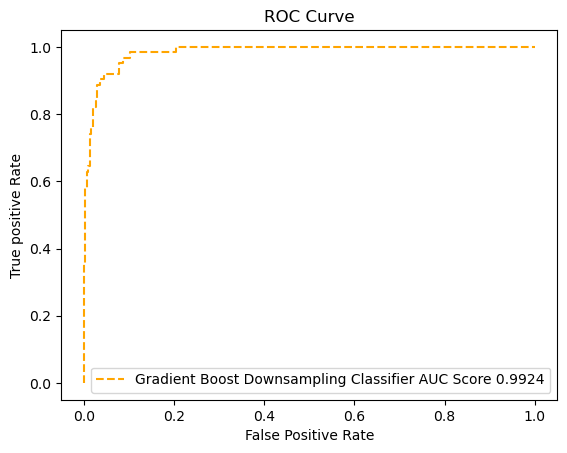

In [1028]:
plt.plot(fpr1_grb_down, tpr1_grb_down, linestyle='--',color='orange', label='Gradient Boost Downsampling Classifier AUC Score {:.4f}'.format(auc_score_grb_down))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [1029]:
end_gb_down = time.time()

In [1030]:
Training_time_gb_down = end_gb_down-start_gb_down

In [1031]:
print("The time of execution of Gradient Boost Downsampling Classifier Model is :",
      Training_time_gb_down , "ms")

The time of execution of Gradient Boost Downsampling Classifier Model is : 12.656633853912354 ms


In [1032]:
##AdaBoost (Adaptive Boosting)

In [1033]:
start_dt_ada_down = time.time()

In [1034]:
tree = DecisionTreeClassifier(max_depth=8, criterion='entropy', random_state=1)

In [1035]:
ada = AdaBoostClassifier(base_estimator=tree, n_estimators=5000, random_state=1, learning_rate=0.1)

In [1036]:
tree.fit(X_train_down_s, y_train_down_s)

DecisionTreeClassifier(criterion='entropy', max_depth=8, random_state=1)

In [1037]:
ada.fit(X_train_down_s, y_train_down_s)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(criterion='entropy',
                                                         max_depth=8,
                                                         random_state=1),
                   learning_rate=0.1, n_estimators=5000, random_state=1)

In [1038]:
y_pred_test_ada_down = ada.predict(X_test_down_s)

In [1039]:
y_pred_train_ada_down = ada.predict(X_train_down_s)

In [1040]:
y_proba_ada_down_s = ada.predict_proba(X_test_down_s)

In [1041]:
report6_rfc_down = classification_report(y_test_down_s, y_pred_test_ada_down)
print(f"Classification Report for AdaBoost Down Classifier: \n{report6_rfc_down}")

Classification Report for AdaBoost Down Classifier: 
              precision    recall  f1-score   support

           0       0.96      0.88      0.92        51
           1       0.96      0.87      0.92        62
           2       0.98      0.89      0.93        56
           3       0.89      1.00      0.94        48
           4       1.00      1.00      1.00        54
           5       0.78      0.90      0.84        51
           6       0.92      0.94      0.93        52

    accuracy                           0.93       374
   macro avg       0.93      0.93      0.93       374
weighted avg       0.93      0.93      0.93       374



In [1042]:
acc_train_ada_down = accuracy_score(y_train_down_s, y_pred_train_ada_down)
acc_test_ada_down = accuracy_score(y_test_down_s, y_pred_test_ada_down)
prec_ada_down = precision_score(y_test_down_s, y_pred_test_ada_down, average='weighted')
recall_ada_down = recall_score(y_test_down_s, y_pred_test_ada_down, average='weighted')
f1_score_ada_down = f1_score(y_test_down_s, y_pred_test_ada_down, average='weighted')
auc_roc_log_ada_down = roc_auc_score(y_test_down_s, y_proba_ada_down_s, average='weighted', multi_class='ovr')

In [1043]:
print('AdaBoost Downsampling Classifier Accuracy Train percentage is:', round(acc_train_ada_down*100,2))
print('AdaBoost Downsampling Classifier Accuracy percentage is:', round(acc_test_ada_down*100,2))
print('AdaBoost Downsampling Classifier Precision percentage is:', round(prec_ada_down*100,2))
print('AdaBoost Downsampling Classifier Recall percentage is:', round(recall_ada_down*100,2))
print('AdaBoost Downsampling Classifier F1-score percentage is:', round(f1_score_ada_down*100,2))
print('AdaBoost Downsampling Classifier AUC ROC percentage is:', auc_roc_log_ada_down)

AdaBoost Downsampling Classifier Accuracy Train percentage is: 100.0
AdaBoost Downsampling Classifier Accuracy percentage is: 92.51
AdaBoost Downsampling Classifier Precision percentage is: 93.05
AdaBoost Downsampling Classifier Recall percentage is: 92.51
AdaBoost Downsampling Classifier F1-score percentage is: 92.59
AdaBoost Downsampling Classifier AUC ROC percentage is: 0.9934634446479095


In [1044]:
# Display the confusion matrix
conf_matrix6_ada_down= confusion_matrix(y_test_down_s, y_pred_test_ada_down)
display(conf_matrix6_ada_down)

array([[45,  1,  0,  0,  0,  5,  0],
       [ 2, 54,  0,  0,  0,  6,  0],
       [ 0,  0, 50,  6,  0,  0,  0],
       [ 0,  0,  0, 48,  0,  0,  0],
       [ 0,  0,  0,  0, 54,  0,  0],
       [ 0,  1,  0,  0,  0, 46,  4],
       [ 0,  0,  1,  0,  0,  2, 49]])

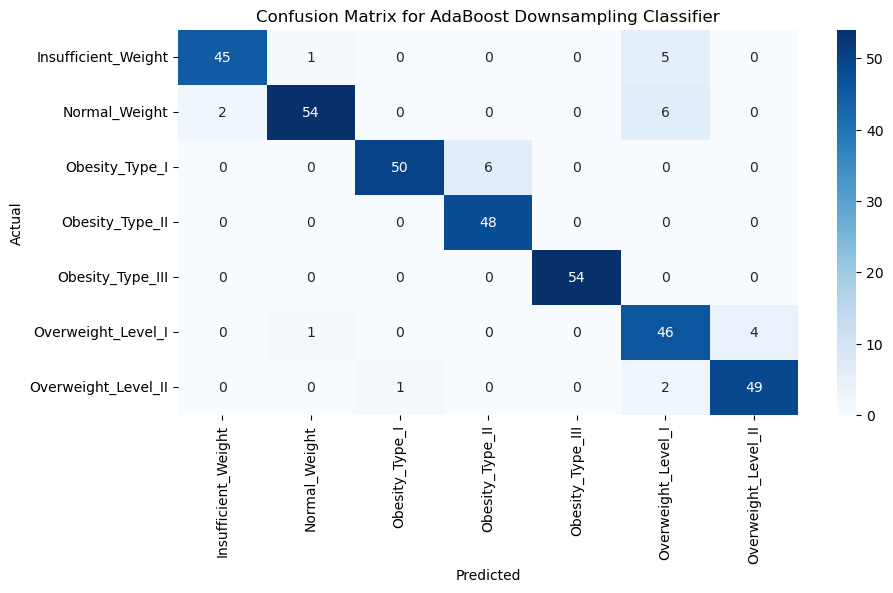

In [1045]:
plt.figure(figsize=(10, 5))
sns.heatmap(conf_matrix6_ada_down, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for AdaBoost Downsampling Classifier')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix6_ada_down)
#disp.plot()
#plt.show()

In [1046]:
clf_ada_down = OneVsRestClassifier(AdaBoostClassifier(base_estimator=tree, n_estimators=5000, random_state=1, learning_rate=0.1))

In [1047]:
clf_ada_down.fit(X_train_down_s,y_train_down_s)

OneVsRestClassifier(estimator=AdaBoostClassifier(base_estimator=DecisionTreeClassifier(criterion='entropy',
                                                                                       max_depth=8,
                                                                                       random_state=1),
                                                 learning_rate=0.1,
                                                 n_estimators=5000,
                                                 random_state=1))

In [1048]:
pred_prob_ada_down = clf_ada_down.predict_proba(X_test_down_s)

In [1049]:
fpr_ada_down={}
tpr_ada_down={}
thresh_ada_down={}
n_classes_ada_down = 7

In [1050]:
for i in range(n_classes_ada_down):
    fpr_ada_down[i],tpr_ada_down[i],thresh_ada_down[i] = roc_curve(y_test_down_s, pred_prob_ada_down[:,i], pos_label=i)

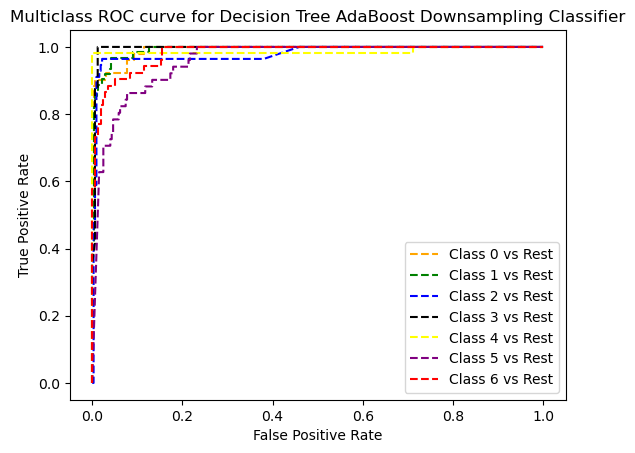

In [1051]:
#Plotting
plt.plot(fpr_ada_down[0],tpr_ada_down[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_ada_down[1],tpr_ada_down[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_ada_down[2],tpr_ada_down[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_ada_down[3],tpr_ada_down[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_ada_down[4],tpr_ada_down[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_ada_down[5],tpr_ada_down[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_ada_down[6],tpr_ada_down[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for Decision Tree AdaBoost Downsampling Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC for Decision Tree AdaBoost Downsampling Classifier', dpi=300)

In [1052]:
fpr1_ada_down, tpr1_ada_down, thresh1_ada_down = roc_curve(y_test_down_s, y_proba_ada_down_s[:,1], pos_label=1)

In [1053]:
random_probs_ada_down = [0 for i in range(len(y_test_down_s))]
p_fpr_ada_down, p_tpr_ada_down, _ = roc_curve(y_test_down_s,random_probs_ada_down,pos_label=1)

In [1054]:
auc_score_ada_down = roc_auc_score(y_test_down_s, y_proba_ada_down_s, multi_class='ovr')
print(auc_score_ada_down)

0.9935448730655525


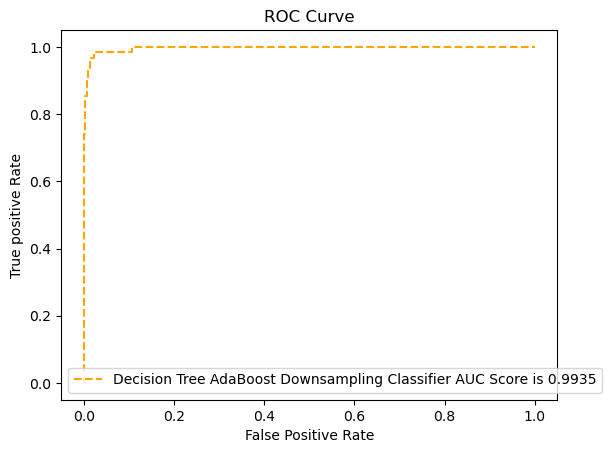

In [1055]:
plt.plot(fpr1_ada_down, tpr1_ada_down, linestyle='--',color='orange', label='Decision Tree AdaBoost Downsampling Classifier AUC Score is {:.4f}'.format(auc_score_ada_down))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
plt.savefig('ROC', dpi=300)
plt.show()

In [1056]:
end_dt_ada_down = time.time()

In [1057]:
Training_time_dt_ada_down = end_dt_ada_down-start_dt_ada_down

In [1058]:
print("The time of execution of Decision Tree AdaBoost DownSampling Classifier Model is :",
      Training_time_dt_ada_down , "ms")

The time of execution of Decision Tree AdaBoost DownSampling Classifier Model is : 74.26336884498596 ms


In [1059]:
#Random Forest Classifier

In [1060]:
start_rf_down = time.time()

In [1061]:
model4_rfc_down = RandomForestClassifier(n_estimators=100, random_state=42)

In [1062]:
model4_rfc_down = model4_rfc_down.fit(X_train_down_s,y_train_down_s)

In [1063]:
y_pred_train_rfc_down = model4_rfc_down.predict(X_train_down_s)

In [1064]:
y_pred_test_rfc_down = model4_rfc_down.predict(X_test_down_s)

In [1065]:
y_proba_rfc_down = model4_rfc_down.predict_proba(X_test_down_s)

In [1066]:
report4_rfc_down = classification_report(y_test_down_s, y_pred_test_rfc_down)
print(f"Classification Report for Random Forest Downsampling Classifier: \n{report4_rfc_down}")

Classification Report for Random Forest Downsampling Classifier: 
              precision    recall  f1-score   support

           0       0.93      0.98      0.95        51
           1       0.86      0.87      0.86        62
           2       1.00      0.93      0.96        56
           3       1.00      1.00      1.00        48
           4       1.00      1.00      1.00        54
           5       0.82      0.88      0.85        51
           6       0.94      0.87      0.90        52

    accuracy                           0.93       374
   macro avg       0.93      0.93      0.93       374
weighted avg       0.93      0.93      0.93       374



In [1067]:
acc_train_rfc_down = accuracy_score(y_train_down_s, y_pred_train_rfc_down)
acc_test_rfc_down = accuracy_score(y_test_down_s, y_pred_test_rfc_down)
prec_rfc_down = precision_score(y_test_down_s, y_pred_test_rfc_down, average='weighted')
recall_rfc_down = recall_score(y_test_down_s, y_pred_test_rfc_down, average='weighted')
f1_score_rfc_down = f1_score(y_test_down_s, y_pred_test_rfc_down, average='weighted')
auc_roc_log_rfc_down = roc_auc_score(y_test_down_s, y_proba_rfc_down, average='weighted', multi_class='ovr')

In [1068]:
print('Random Forest Classifier Accuracy Train percentage is:', round(acc_train_rfc_down*100,2))
print('Random Forest Classifier Accuracy percentage is:', round(acc_test_rfc_down*100,2))
print('Random Forest Classifier Precision percentage is:', round(prec_rfc_down*100,2))
print('Random Forest Classifier Recall percentage is:', round(recall_rfc_down*100,2))
print('Random Forest Classifier F1-score percentage is:', round(f1_score_rfc_down*100,2))
print('Random Forest Classifier AUC ROC percentage is:', auc_roc_log_rfc_down)

Random Forest Classifier Accuracy Train percentage is: 100.0
Random Forest Classifier Accuracy percentage is: 93.05
Random Forest Classifier Precision percentage is: 93.27
Random Forest Classifier Recall percentage is: 93.05
Random Forest Classifier F1-score percentage is: 93.09
Random Forest Classifier AUC ROC percentage is: 0.9933714160168032


In [1069]:
# Display the confusion matrix
conf_matrix4_rfc_down= confusion_matrix(y_test_down_s, y_pred_test_rfc_down)
display(conf_matrix4_rfc_down)

array([[50,  1,  0,  0,  0,  0,  0],
       [ 3, 54,  0,  0,  0,  4,  1],
       [ 1,  1, 52,  0,  0,  1,  1],
       [ 0,  0,  0, 48,  0,  0,  0],
       [ 0,  0,  0,  0, 54,  0,  0],
       [ 0,  5,  0,  0,  0, 45,  1],
       [ 0,  2,  0,  0,  0,  5, 45]])

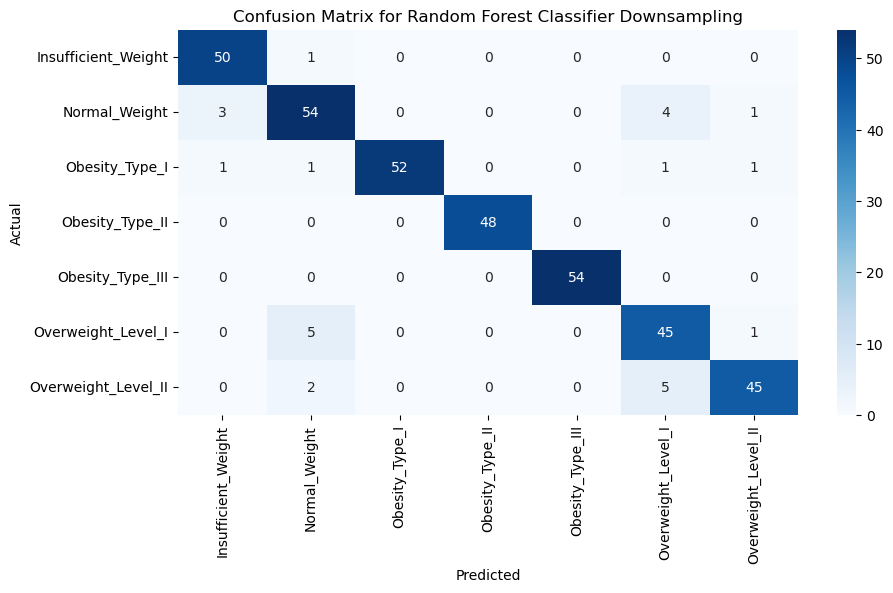

In [1070]:
plt.figure(figsize=(10, 5))
sns.heatmap(conf_matrix4_rfc_down, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest Classifier Downsampling')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix4_rfc_down)
#disp.plot()
#plt.show()

In [1071]:
clf_rfc_down = OneVsRestClassifier(RandomForestClassifier(n_estimators=100, random_state=42))

In [1072]:
clf_rfc_down.fit(X_train_down_s,y_train_down_s)

OneVsRestClassifier(estimator=RandomForestClassifier(random_state=42))

In [1073]:
pred_rfc_down = clf_rfc_down.predict(X_test_down_s)

In [1074]:
pred_prob_rfc_down = clf_rfc_down.predict_proba(X_test_down_s)

In [1075]:
fpr_rfc_down={}
tpr_rfc_down={}
thresh_rfc_down={}
n_classes_rfc_down = 7

In [1076]:
for i in range(n_classes_rfc_down):
    fpr_rfc_down[i],tpr_rfc_down[i],thresh_rfc_down[i] = roc_curve(y_test_down_s, pred_prob_rfc_down[:,i], pos_label=i)

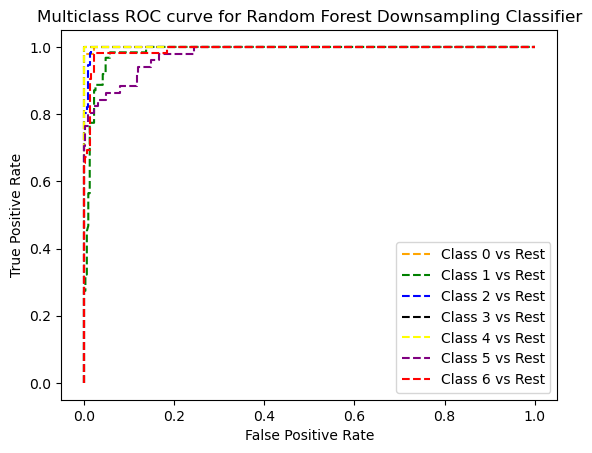

In [1077]:
#Plotting
plt.plot(fpr_rfc_down[0],tpr_rfc_down[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_rfc_down[1],tpr_rfc_down[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_rfc_down[2],tpr_rfc_down[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_rfc_down[3],tpr_rfc_down[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_rfc_down[4],tpr_rfc_down[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_rfc_down[5],tpr_rfc_down[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_rfc_down[6],tpr_rfc_down[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for Random Forest Downsampling Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC for Random Forest Downsampling Classifier', dpi=300)

In [1078]:
fpr1_rfc_down, tpr1_rfc_down, thresh1_rfc_down = roc_curve(y_test_down_s, y_proba_rfc_down[:,1], pos_label=1)

In [1079]:
random_probs_rfc_down = [0 for i in range(len(y_test_down_s))]
p_fpr_rfc_down, p_tpr_rfc_down, _ = roc_curve(y_test_down_s,random_probs_rfc_down,pos_label=1)

In [1080]:
auc_score_rfc_down = roc_auc_score(y_test_down_s, y_proba_rfc_down, multi_class='ovr')
print(auc_score_rfc_down)

0.9935929065596962


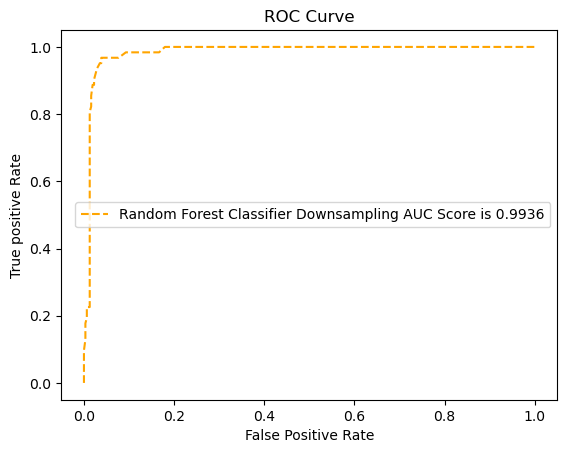

In [1081]:
plt.plot(fpr1_rfc_down, tpr1_rfc_down, linestyle='--',color='orange', label='Random Forest Classifier Downsampling AUC Score is {:.4f}'.format(auc_score_rfc_down))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [1082]:
end_rf_down = time.time()

In [1083]:
Training_time_rf_down = end_rf_down-start_rf_down

In [1084]:
print("The time of execution of Random Forest Classifier Downsampling Model is :",
      Training_time_rf_down , "ms")

The time of execution of Random Forest Classifier Downsampling Model is : 29.322321891784668 ms


In [1085]:
start_svc_down = time.time()

In [1086]:
svc_down = SVC(probability=True, kernel='linear')

In [1087]:
adb_svc_down = AdaBoostClassifier(n_estimators=100, random_state=42, base_estimator=svc, learning_rate=0.01)

In [1088]:
model7_scv_down = adb_svc_down.fit(X_train_down_s,y_train_down_s)

In [1089]:
y_pred_train_svc_down = model7_scv_down.predict(X_train_down_s)

In [1090]:
y_pred_test_svc_down = model7_scv_down.predict(X_test_down_s)

In [1091]:
y_proba_svc_down = model7_scv_down.predict_proba(X_test_down_s)

In [1092]:
report7_svc_down = classification_report(y_test_down_s, y_pred_test_svc_down)
print(f"Classification Report for Support Vector Classifier Downsampling: \n{report7_svc_down}")

Classification Report for Support Vector Classifier Downsampling: 
              precision    recall  f1-score   support

           0       0.75      0.92      0.82        51
           1       0.64      0.63      0.63        62
           2       0.57      0.70      0.63        56
           3       0.80      1.00      0.89        48
           4       1.00      1.00      1.00        54
           5       0.71      0.63      0.67        51
           6       0.74      0.33      0.45        52

    accuracy                           0.74       374
   macro avg       0.74      0.74      0.73       374
weighted avg       0.74      0.74      0.72       374



In [1093]:
acc_train_svc_down = accuracy_score(y_train_down_s, y_pred_train_svc_down)
acc_test_svc_down = accuracy_score(y_test_down_s, y_pred_test_svc_down)
prec_svc_down = precision_score(y_test_down_s, y_pred_test_svc_down, average='weighted')
recall_svc_down = recall_score(y_test_down_s, y_pred_test_svc_down, average='weighted')
f1_score_svc_down = f1_score(y_test_down_s, y_pred_test_svc_down, average='weighted')
auc_roc_log_svc_down = roc_auc_score(y_test_down_s, y_proba_svc_down, average='weighted', multi_class='ovr')

In [1094]:
print('Support Vector Classifier Downsampling Accuracy Train percentage is:', round(acc_train_svc_down*100,2))
print('Support Vector Classifier Downsampling Accuracy percentage is:', round(acc_test_svc_down*100,2))
print('Support Vector Classifier Downsampling Precision percentage is:', round(prec_svc_down*100,2))
print('Support Vector Classifier Downsampling Recall percentage is:', round(recall_svc_down*100,2))
print('Support Vector Classifier Downsampling F1-score percentage is:', round(f1_score_svc_down*100,2))
print('Support Vector Classifier Downsampling AUC ROC percentage is:', auc_roc_log_svc_down)

Support Vector Classifier Downsampling Accuracy Train percentage is: 74.45
Support Vector Classifier Downsampling Accuracy percentage is: 73.8
Support Vector Classifier Downsampling Precision percentage is: 74.04
Support Vector Classifier Downsampling Recall percentage is: 73.8
Support Vector Classifier Downsampling F1-score percentage is: 72.42
Support Vector Classifier Downsampling AUC ROC percentage is: 0.9442035234055626


In [1095]:
# Display the confusion matrix
conf_matrix7_svc_down = confusion_matrix(y_test_down_s, y_pred_test_svc_down)
display(conf_matrix7_svc_down)

array([[47,  4,  0,  0,  0,  0,  0],
       [16, 39,  0,  0,  0,  5,  2],
       [ 0,  3, 39, 11,  0,  3,  0],
       [ 0,  0,  0, 48,  0,  0,  0],
       [ 0,  0,  0,  0, 54,  0,  0],
       [ 0,  9,  6,  0,  0, 32,  4],
       [ 0,  6, 23,  1,  0,  5, 17]])

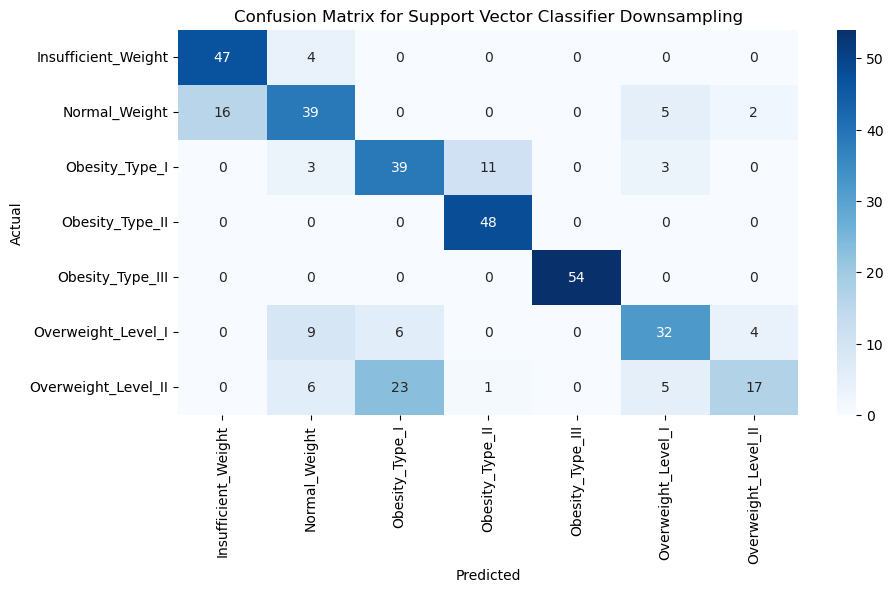

In [1096]:
plt.figure(figsize=(10, 5))
sns.heatmap(conf_matrix7_svc_down, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Support Vector Classifier Downsampling')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix7_svc_down)
#disp.plot()
#plt.show()

In [1097]:
clf_svc_down = OneVsRestClassifier(AdaBoostClassifier(n_estimators=100, random_state=42, base_estimator=svc, learning_rate=0.01))

In [1098]:
clf_svc_down.fit(X_train_down_s,y_train_down_s)

OneVsRestClassifier(estimator=AdaBoostClassifier(base_estimator=SVC(kernel='linear',
                                                                    probability=True),
                                                 learning_rate=0.01,
                                                 n_estimators=100,
                                                 random_state=42))

In [1099]:
pred_svc_down = clf_svc_down.predict(X_test_down_s)

In [1100]:
pred_prob_svc_down = clf_svc_down.predict_proba(X_test_down_s)

In [1101]:
fpr_svc_down={}
tpr_svc_down={}
thresh_svc_down={}
n_classes_svc_down = 7

In [1102]:
for i in range(n_classes_svc_down):
    fpr_svc_down[i],tpr_svc_down[i],thresh_svc_down[i] = roc_curve(y_test_down_s, pred_prob_svc_down[:,i], pos_label=i)

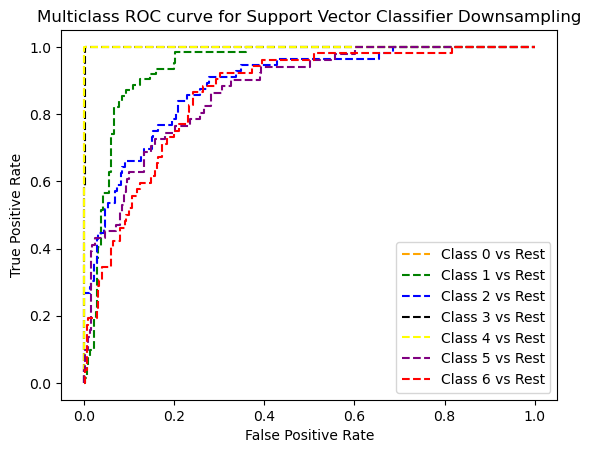

In [1103]:
#Plotting
plt.plot(fpr_svc_down[0],tpr_svc_down[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_svc_down[1],tpr_svc_down[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_svc_down[2],tpr_svc_down[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_svc_down[3],tpr_svc_down[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_svc_down[4],tpr_svc_down[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_svc_down[5],tpr_svc_down[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_svc_down[6],tpr_svc_down[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for Support Vector Classifier Downsampling')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('Multiclass ROC for Support Vector Classifier', dpi=300)

In [1104]:
fpr1_svc_down, tpr1_svc_down, thresh1_svc_down = roc_curve(y_test_down_s, y_proba_svc_down[:,1], pos_label=1)

In [1105]:
random_probs_svc_down = [0 for i in range(len(y_test_down_s))]
p_fpr_svc_down, p_tpr_svc_down, _ = roc_curve(y_test_down_s,random_probs_svc_down,pos_label=1)

In [1106]:
auc_score_svc_down = roc_auc_score(y_test_down_s, y_proba_svc_down, multi_class='ovr')
print(auc_score_svc_down)

0.9455621207980539


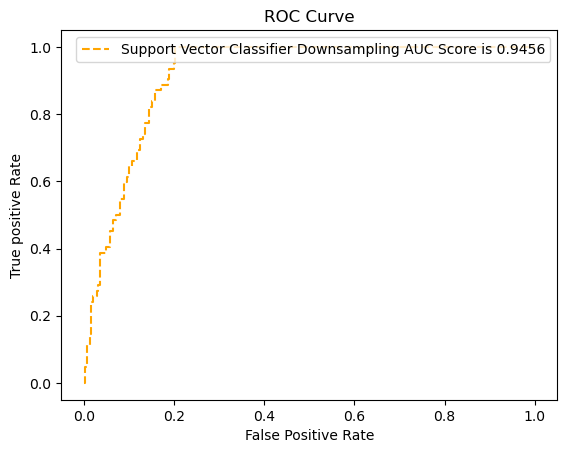

In [1107]:
plt.plot(fpr1_svc_down, tpr1_svc_down, linestyle='--',color='orange', label='Support Vector Classifier Downsampling AUC Score is {:.4f}'.format(auc_score_svc_down))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [1108]:
end_svc_down = time.time()

In [1109]:
Training_time_svc_down = end_svc_down - start_svc_down

In [1110]:
print("The time of execution of Support Vector Classifier Downsampling Model is :",
      Training_time_svc_down , "ms")

The time of execution of Support Vector Classifier Downsampling Model is : 231.520024061203 ms


In [1111]:
#Decision Tree Classifier

In [1112]:
start_dt_down = time.time()

In [1113]:
model6_dtc_down = DecisionTreeClassifier(criterion='entropy',random_state=0)

In [1114]:
model6_dtc_down = model6_dtc_down.fit(X_train_down_s,y_train_down_s)

In [1115]:
y_pred_train_dtc_down = model6_dtc_down.predict(X_train_down_s)

In [1116]:
y_pred_test_dtc_down = model6_dtc_down.predict(X_test_down_s)

In [1117]:
y_proba_dtc_down = model6_dtc_down.predict_proba(X_test_down_s)

In [1118]:
report6_dtc_down = classification_report(y_test_down_s, y_pred_test_dtc_down)
print(f"Classification Report for Decision Tree Downsampling Classifier: \n{report6_dtc_down}")

Classification Report for Decision Tree Downsampling Classifier: 
              precision    recall  f1-score   support

           0       0.83      0.78      0.81        51
           1       0.98      0.85      0.91        62
           2       0.86      0.91      0.89        56
           3       0.90      0.92      0.91        48
           4       0.93      0.96      0.95        54
           5       0.72      0.82      0.77        51
           6       0.84      0.81      0.82        52

    accuracy                           0.87       374
   macro avg       0.87      0.87      0.87       374
weighted avg       0.87      0.87      0.87       374



In [1119]:
acc_train_dtc_down = accuracy_score(y_train_down_s, y_pred_train_dtc_down)
acc_test_dtc_down = accuracy_score(y_test_down_s, y_pred_test_dtc_down)
prec_dtc_down = precision_score(y_test_down_s, y_pred_test_dtc_down, average='weighted')
recall_dtc_down = recall_score(y_test_down_s, y_pred_test_dtc_down, average='weighted')
f1_score_dtc_down = f1_score(y_test_down_s, y_pred_test_dtc_down, average='weighted')
auc_roc_log_dtc_down = roc_auc_score(y_test_down_s, y_proba_dtc_down, average='weighted', multi_class='ovr')

In [1120]:
print('Decision Tree Classifier Downsampling Accuracy Train percentage is:', round(acc_train_dtc_down*100,2))
print('Decision Tree Classifier Downsampling Accuracy percentage is:', round(acc_test_dtc_down*100,2))
print('Decision Tree Classifier Downsampling Precision percentage is:', round(prec_dtc_down*100,2))
print('Decision Tree Classifier Downsampling Recall percentage is:', round(recall_dtc_down*100,2))
print('Decision Tree Classifier Downsampling F1-score percentage is:', round(f1_score_dtc_down*100,2))
print('Decision Tree Classifier Downsampling AUC ROC percentage is:', auc_roc_log_dtc_down)

Decision Tree Classifier Downsampling Accuracy Train percentage is: 100.0
Decision Tree Classifier Downsampling Accuracy percentage is: 86.63
Decision Tree Classifier Downsampling Precision percentage is: 87.06
Decision Tree Classifier Downsampling Recall percentage is: 86.63
Decision Tree Classifier Downsampling F1-score percentage is: 86.7
Decision Tree Classifier Downsampling AUC ROC percentage is: 0.9223260448539681


In [1121]:
# Display the confusion matrix
conf_matrix6_dtc_down = confusion_matrix(y_test_down_s, y_pred_test_dtc_down)
display(conf_matrix6_dtc_down)

array([[40,  0,  0,  0,  0, 11,  0],
       [ 5, 53,  0,  0,  0,  4,  0],
       [ 0,  0, 51,  5,  0,  0,  0],
       [ 0,  0,  0, 44,  4,  0,  0],
       [ 2,  0,  0,  0, 52,  0,  0],
       [ 0,  1,  0,  0,  0, 42,  8],
       [ 1,  0,  8,  0,  0,  1, 42]])

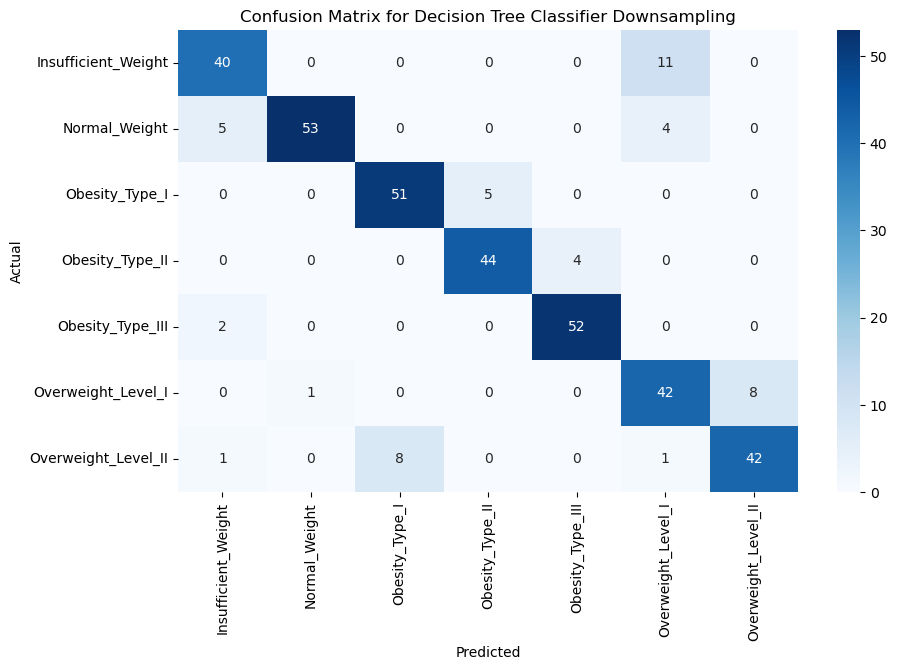

In [1122]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix6_dtc_down, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Decision Tree Classifier Downsampling')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix6_dtc_down)
#disp.plot()
#plt.show()

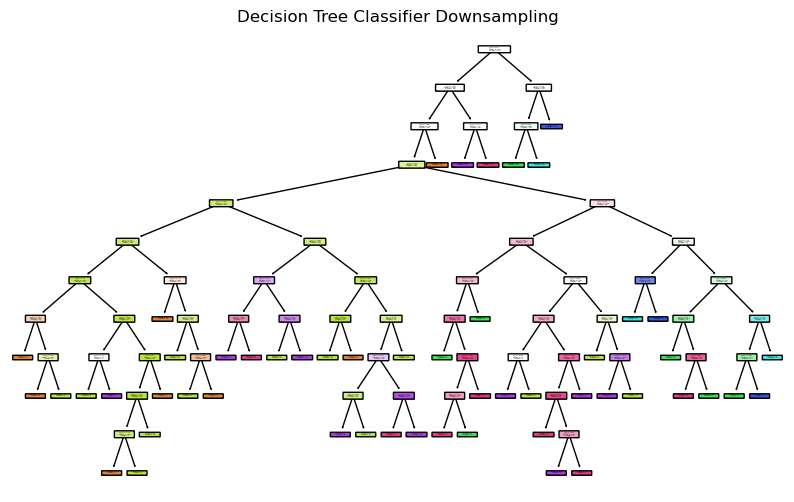

In [1123]:
# Visualize the decision tree
plt.figure(figsize=(10, 6))
plot_tree(model6_dtc_down, filled=True, rounded=True)
plt.title('Decision Tree Classifier Downsampling')
plt.show()

#, class_names=['Class 0', 'Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5', 'Class 6'], feature_names=['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Feature 5', 'Feature 6', 'Feature 7']

In [1124]:
end_dt_down = time.time()

In [1125]:
Training_time_dt_down = end_dt_down-start_dt_down

In [1126]:
print("The time of execution of Decision Tree Classifier Downsampling Model is :",
      Training_time_dt_down , "ms")

The time of execution of Decision Tree Classifier Downsampling Model is : 8.61393404006958 ms


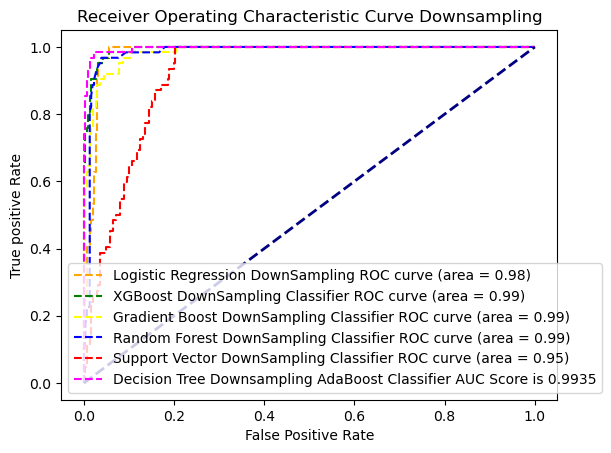

In [1127]:
plt.plot(fpr1_lr_down, tpr1_lr_down, linestyle='--',color='orange', label='Logistic Regression DownSampling ROC curve (area = %0.2f)' %auc_score1_lr_down)
plt.plot(fpr1_xgb_down, tpr1_xgb_down, linestyle='--',color='green', label='XGBoost DownSampling Classifier ROC curve (area = %0.2f)' %auc_score_xgb_down)
plt.plot(fpr1_grb_down, tpr1_grb_down, linestyle='--',color='yellow', label='Gradient Boost DownSampling Classifier ROC curve (area = %0.2f)' %auc_score_grb_down)
plt.plot(fpr1_rfc_down, tpr1_rfc_down, linestyle='--',color='blue', label='Random Forest DownSampling Classifier ROC curve (area = %0.2f)' %auc_score_rfc_down)
plt.plot(fpr1_svc_down, tpr1_svc_down, linestyle='--',color='red', label='Support Vector DownSampling Classifier ROC curve (area = %0.2f)' %auc_score_svc_down)
plt.plot(fpr1_ada_down, tpr1_ada_down, linestyle='--',color='magenta', label='Decision Tree Downsampling AdaBoost Classifier AUC Score is {:.4f}'.format(auc_score_ada_down))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--') 



plt.title('Receiver Operating Characteristic Curve Downsampling')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [1128]:
##Neural Network

In [1129]:
start_nn_down = time.time()

In [1139]:
model_down = tf.keras.models.Sequential()

In [1140]:
model_down.add(tf.keras.layers.Flatten(input_shape=(32,)))

In [1141]:
model_down.add(tf.keras.layers.Dense(32,activation='relu'))

In [1142]:
model_down.add(tf.keras.layers.Dense(64,activation='softmax'))

In [1143]:
model_down.add(Dropout(0.001))

In [1144]:
model_down.compile(optimizer='adam',
             loss='sparse_categorical_crossentropy',
             metrics=['accuracy'])

In [1145]:
model_down.summary()

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_3 (Flatten)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         2,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,168 (12.38 KB)

 Trainable params: 3,168 (12.38 KB)

 Non-trainable params: 0 (0.00 B)

In [1146]:
history_down = model_down.fit(X_train_down_s,y_train_down_s,
                   batch_size=64, epochs=150,
                   validation_split=0.2)

Epoch 1/150
19/19 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.0563 - loss: 4.1009 - val_accuracy: 0.1773 - val_loss: 3.7534
Epoch 2/150
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.2023 - loss: 3.6127 - val_accuracy: 0.2575 - val_loss: 3.3015
Epoch 3/150
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.3008 - loss: 3.1511 - val_accuracy: 0.3344 - val_loss: 2.8593
Epoch 4/150
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.3767 - loss: 2.6474 - val_accuracy: 0.3913 - val_loss: 2.4453
Epoch 5/150
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.4360 - loss: 2.2564 - val_accuracy: 0.4281 - val_loss: 2.0940
Epoch 6/150
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5071 - loss: 1.8461 - val_accuracy: 0.4415 - val_loss: 1.8203
Epoch 7/150
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.5238 - loss: 1.6721 - val_accuracy: 0.4682 - val_loss: 1.6148
Epoch 8/150
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - accuracy: 0.5766 - loss: 1.4281 - val_accuracy: 0.4983 - 

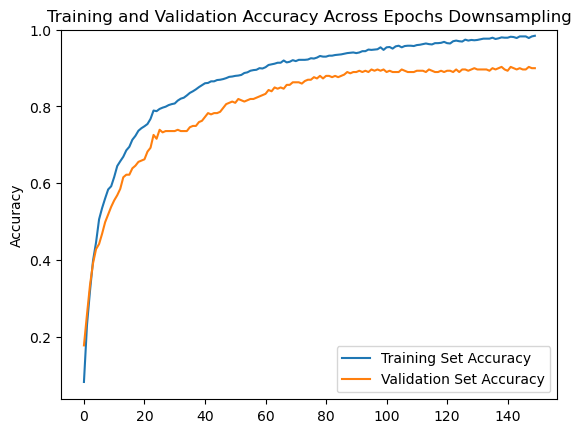

In [1147]:
accuracy_nn_down = history_down.history['accuracy']
validation_accuracy_down = history_down.history['val_accuracy']

plt.plot(accuracy_nn_down, label='Training Set Accuracy')
plt.plot(validation_accuracy_down, label='Validation Set Accuracy')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy Across Epochs Downsampling')
plt.legend()

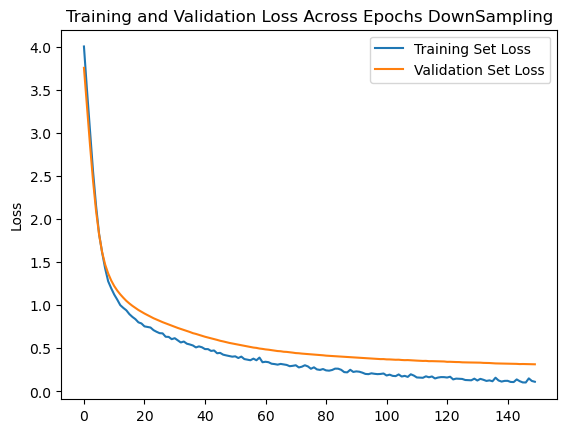

In [1148]:
loss_nn_down = history_down.history['loss']
validation_loss_nn_down = history_down.history['val_loss']

plt.plot(loss_nn_down, label='Training Set Loss')
plt.plot(validation_loss_nn_down, label='Validation Set Loss')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Across Epochs DownSampling')
plt.legend()

In [1149]:
y_pred_train_nn_down = model_down.predict(X_train_down_s)
y_pred_train_nn_down = y_pred_train_nn_down.argmax(axis=1)

47/47 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


In [1150]:
y_pred_test_nn_down = model_down.predict(X_test_down_s)
y_pred_test_nn_down = y_pred_test_nn_down.argmax(axis=1)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


In [1151]:
cm_nn_down = confusion_matrix(y_test_down_s, y_pred_test_nn_down)

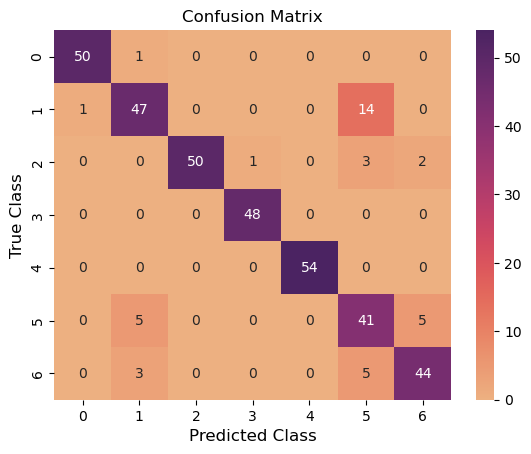

In [1152]:
ax = sns.heatmap(cm_nn_down, cmap='flare', annot=True, fmt='d')
plt.xlabel("Predicted Class", fontsize=12)
plt.ylabel("True Class",fontsize=12)
plt.title("Confusion Matrix", fontsize=12)

plt.show()

In [1153]:
print(classification_report(y_test_down_s,y_pred_test_nn_down))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98        51
           1       0.84      0.76      0.80        62
           2       1.00      0.89      0.94        56
           3       0.98      1.00      0.99        48
           4       1.00      1.00      1.00        54
           5       0.65      0.80      0.72        51
           6       0.86      0.85      0.85        52

    accuracy                           0.89       374
   macro avg       0.90      0.90      0.90       374
weighted avg       0.90      0.89      0.90       374



In [1154]:
acc_train_nn_down = accuracy_score(y_train_down_s, y_pred_train_nn_down)
acc_test_nn_down = accuracy_score(y_test_down_s, y_pred_test_nn_down)
prec_nn_down = precision_score(y_test_down_s, y_pred_test_nn_down, average='weighted')
recall_nn_down = recall_score(y_test_down_s, y_pred_test_nn_down, average='weighted')
f1_score_nn_down = f1_score(y_test_down_s, y_pred_test_nn_down, average='weighted')

In [1155]:
print('Neural Network Accuracy Train percentage is:', round(acc_train_nn_down*100,2))
print('Neural Network Accuracyp Test Percentage is:', round(acc_test_nn_down*100,2))
print('Neural Network Precision percentage is:', round(prec_nn_down*100,2))
print('Neural Network Recall percentage is:', round(recall_nn_down*100,2))
print('Neural Network F1-score percentage is:', round(f1_score_nn_down*100,2))

Neural Network Accuracy Train percentage is: 96.86
Neural Network Accuracyp Test Percentage is: 89.3
Neural Network Precision percentage is: 90.14
Neural Network Recall percentage is: 89.3
Neural Network F1-score percentage is: 89.53


In [1156]:
end_nn_down = time.time()

In [1157]:
Training_time_nn_down = end_nn_down - start_nn_down

In [1158]:
print("The time of execution of Recurrent Neural Network Model DownSampling is :",
      Training_time_nn_down , "ms")

The time of execution of Recurrent Neural Network Model DownSampling is : 74.70094990730286 ms


In [1159]:
metrics = [[acc_train_lr_downsample,acc_test_lr_downsample,prec_lr_downsample,recall_lr_downsample,f1_score_lr_downsample,auc_roc_log_lr_downsample,Training_time_lr_downsample],
           [acc_train_xgb_down,acc_test_xgb_down,prec_xgb_down,recall_xgb_down,f1_score_xgb_down,auc_roc_log_xgb_down,Training_time_xg_down],
           [acc_train_GrB_down,acc_test_GrB_down,prec_GrB_down,recall_GrB_down,f1_score_GrB_down,auc_roc_log_GrB_down,Training_time_gb_down],
           [acc_train_rfc_down,acc_test_rfc_down,prec_rfc_down,recall_rfc_down,f1_score_rfc_down,auc_roc_log_rfc_down,Training_time_rf_down],
           [acc_train_dtc_down,acc_test_dtc_down,prec_dtc_down,recall_dtc_down,f1_score_dtc_down,auc_roc_log_dtc_down,Training_time_dt_down],
           [acc_train_ada_down,acc_test_ada_down,prec_ada_down,recall_ada_down,f1_score_ada_down,auc_roc_log_ada_down,Training_time_dt_ada_down],
           [acc_train_svc_down,acc_test_svc_down,prec_svc_down,recall_svc_down,f1_score_svc_down,auc_roc_log_svc_down,Training_time_svc_down],
           [acc_train_nn_down,acc_test_nn_down,prec_nn_down,recall_nn_down,f1_score_nn_down,'0.0','0.0']
          ]

In [1160]:
Final_result_DownSampling = pd.DataFrame(metrics, columns=['Train Accuracy', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1 Score', 'AUC ROC Score', 'Training Time(ms)'],
                           index=['Logistic Regression','XGBoost','Gradient Boosting', 'Random Forest', 'Decision Tree Classifier', 'Decision Tree AdaBoost', 'Support Vector Machines', 'Recurrent Neural Network'])

In [1161]:
Final_result_DownSampling

,Train Accuracy,Test Accuracy,Test Precision,Test Recall,Test F1 Score,AUC ROC Score,Training Time(ms)
Logistic Regression,0.910368,0.874332,0.870299,0.874332,0.871606,0.983998,11.522665
XGBoost,1.000000,0.874332,0.886877,0.874332,0.876805,0.990834,12.885085
Gradient Boosting,1.000000,0.901070,0.900587,0.901070,0.900423,0.992233,12.656634
Random Forest,1.000000,0.930481,0.932734,0.930481,0.930928,0.993371,29.322322
Decision Tree Classifier,1.000000,0.866310,0.870627,0.866310,0.867016,0.922326,8.613934
Decision Tree AdaBoost,1.000000,0.925134,0.930541,0.925134,0.925891,0.993463,74.263369
Support Vector Machines,0.744482,0.737968,0.740391,0.737968,0.724159,0.944204,231.520024
Recurrent Neural Network,0.968562,0.893048,0.901362,0.893048,0.895285,0.0,0.0


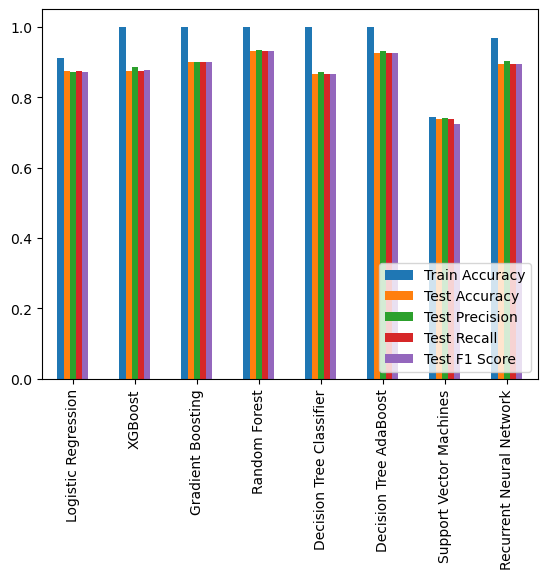

In [1162]:
Final_result_DownSampling.plot(kind='bar')

plt.legend(loc = 'lower right')

In [1163]:
#Up Sampling

In [1164]:
X_train_UpScaled, X_test_UpScaled, y_train_UpScaled, y_test_UpScaled = train_test_split(X_upsampling, y_upsampling, test_size = 0.2, random_state = 42)

In [1165]:
X_train_UpScaled.shape

(1948, 32)

In [1166]:
y_train_UpScaled.shape

(1948,)

In [1167]:
X_test_UpScaled.shape

(488, 32)

In [1168]:
y_test_UpScaled.shape

(488,)

In [1169]:
#Logistic Regression UpSampling

In [1170]:
start_lr_UpScaled = time.time()

In [1171]:
model1_lr_UpScaled = LogisticRegression(max_iter=100)

In [1172]:
model1_lr_UpScaled.fit(X_train_UpScaled,y_train_UpScaled)

LogisticRegression()

In [1173]:
y_pred_train_lr_UpScaled = model1_lr_UpScaled.predict(X_train_UpScaled)

In [1174]:
y_pred_test_lr_UpScaled = model1_lr_UpScaled.predict(X_test_UpScaled)

In [1175]:
y_proba_lr_UpScaled = model1_lr_UpScaled.predict_proba(X_test_UpScaled)

In [1176]:
report1_lr_UpScaled = classification_report(y_test_UpScaled, y_pred_test_lr_UpScaled)
print(f"Classification Report: \n{report1_lr_UpScaled}")

Classification Report: 
              precision    recall  f1-score   support

           0       0.66      0.57      0.61        72
           1       0.56      0.74      0.63        72
           2       0.06      0.05      0.06        75
           3       0.38      0.62      0.47        65
           4       0.67      0.79      0.72        63
           5       0.30      0.10      0.15        72
           6       0.24      0.20      0.22        69

    accuracy                           0.43       488
   macro avg       0.41      0.44      0.41       488
weighted avg       0.40      0.43      0.40       488



In [1177]:
acc_train_lr_UpScaled = accuracy_score(y_train_UpScaled, y_pred_train_lr_UpScaled)
acc_test_lr_UpScaled = accuracy_score(y_test_UpScaled, y_pred_test_lr_UpScaled)
prec_lr_UpScaled = precision_score(y_test_UpScaled, y_pred_test_lr_UpScaled, average='weighted')
recall_lr_UpScaled = recall_score(y_test_UpScaled, y_pred_test_lr_UpScaled, average='weighted')
f1_score_lr_UpScaled = f1_score(y_test_UpScaled, y_pred_test_lr_UpScaled, average='weighted')
auc_roc_log_lr_UpScaled = roc_auc_score(y_test_UpScaled, y_proba_lr_UpScaled, average='weighted', multi_class='ovr')

In [1178]:
print('Logistic Regression UpScaling Accuracy Train percentage is:', round(acc_train_lr_UpScaled*100,2))
print('Logistic Regression UpScaling Accuracy percentage is:', round(acc_test_lr_UpScaled*100,2))
print('Logistic Regression UpScaling Precision percentage is:', round(prec_lr_UpScaled*100,2))
print('Logistic Regression UpScaling Recall percentage is:', round(recall_lr_UpScaled*100,2))
print('Logistic Regression UpScaling F1-score percentage is:', round(f1_score_lr_UpScaled*100,2))
print('Logistic Regression UpScaling AUC ROC percentage is:', auc_roc_log_lr_UpScaled)

Logistic Regression UpScaling Accuracy Train percentage is: 47.13
Logistic Regression UpScaling Accuracy percentage is: 42.83
Logistic Regression UpScaling Precision percentage is: 40.42
Logistic Regression UpScaling Recall percentage is: 42.83
Logistic Regression UpScaling F1-score percentage is: 40.13
Logistic Regression UpScaling AUC ROC percentage is: 0.7906860354620301


In [1179]:
clf_lr_UpScaled = OneVsRestClassifier(LogisticRegression())

In [1180]:
clf_lr_UpScaled.fit(X_train_UpScaled,y_train_UpScaled)

OneVsRestClassifier(estimator=LogisticRegression())

In [1181]:
pred_lr_UpScaled = clf_lr_UpScaled.predict(X_test_UpScaled)

In [1182]:
pred_prob_lr_UpScaled = clf_lr_UpScaled.predict_proba(X_test_UpScaled)

In [1183]:
fpr_lr_up={}
tpr_lr_up={}
thresh_lr_up={}
n_classes_lr_up = 7

In [1184]:
for i in range(n_classes):
    fpr_lr_up[i],tpr_lr_up[i],thresh_lr_up[i] = roc_curve(y_test_UpScaled, pred_prob_lr_UpScaled[:,i], pos_label=i)

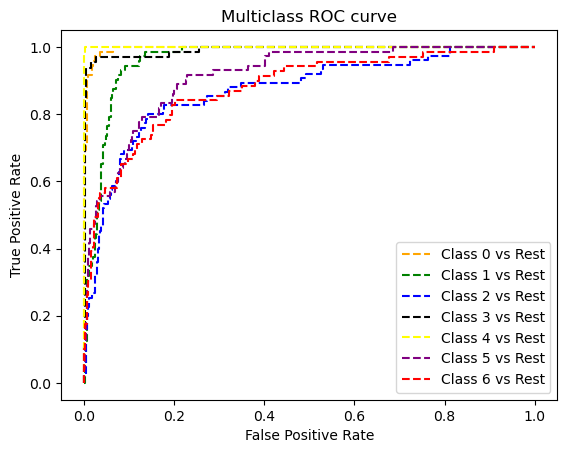

In [1185]:
#Plotting
plt.plot(fpr_lr_up[0],tpr_lr_up[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_lr_up[1],tpr_lr_up[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_lr_up[2],tpr_lr_up[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_lr_up[3],tpr_lr_up[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_lr_up[4],tpr_lr_up[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_lr_up[5],tpr_lr_up[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_lr_up[6],tpr_lr_up[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC', dpi=300)

In [1186]:
fpr1_lr_up, tpr1_lr_up, thresh1_lr_up = roc_curve(y_test_UpScaled, y_proba_lr_UpScaled[:,1], pos_label=1)

In [1187]:
random_probs_lr_UpScaled = [0 for i in range(len(y_test_UpScaled))]
p_fpr_lr_UpScaled, p_tpr_lr_UpScaled, _ = roc_curve(y_test_UpScaled,random_probs_lr_UpScaled,pos_label=1)

In [1188]:
auc_score1_lr_UpScaled = roc_auc_score(y_test_UpScaled, y_proba_lr_UpScaled, multi_class='ovr')
print(auc_score1_lr_UpScaled)

0.7945707969789755


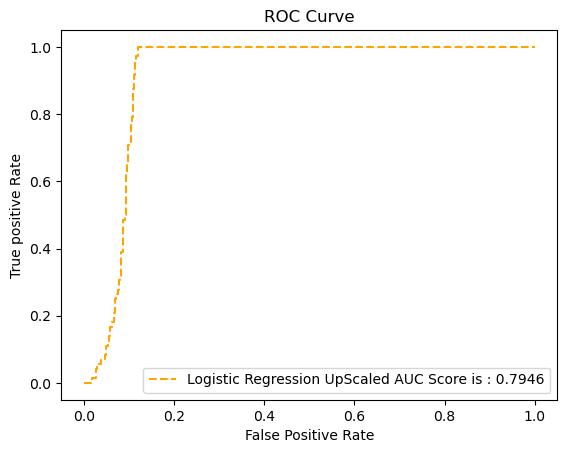

In [1189]:
plt.plot(fpr1_lr_up, tpr1_lr_up, linestyle='--',color='orange', label='Logistic Regression UpScaled AUC Score is : {:.4f}'.format(auc_score1_lr_UpScaled))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [1190]:
# Display the confusion matrix
conf_matrix1_lr_UpScaled = confusion_matrix(y_test_UpScaled, y_pred_test_lr_UpScaled)
display(conf_matrix1_lr_UpScaled)

array([[41,  4,  4,  0,  0,  8, 15],
       [11, 53,  0,  0,  0,  8,  0],
       [ 0,  9,  4, 36, 12,  0, 14],
       [ 0,  4,  3, 40,  9,  0,  9],
       [ 0,  2,  0, 11, 50,  0,  0],
       [ 9,  6, 42,  2,  0,  7,  6],
       [ 1, 17, 16, 17,  4,  0, 14]])

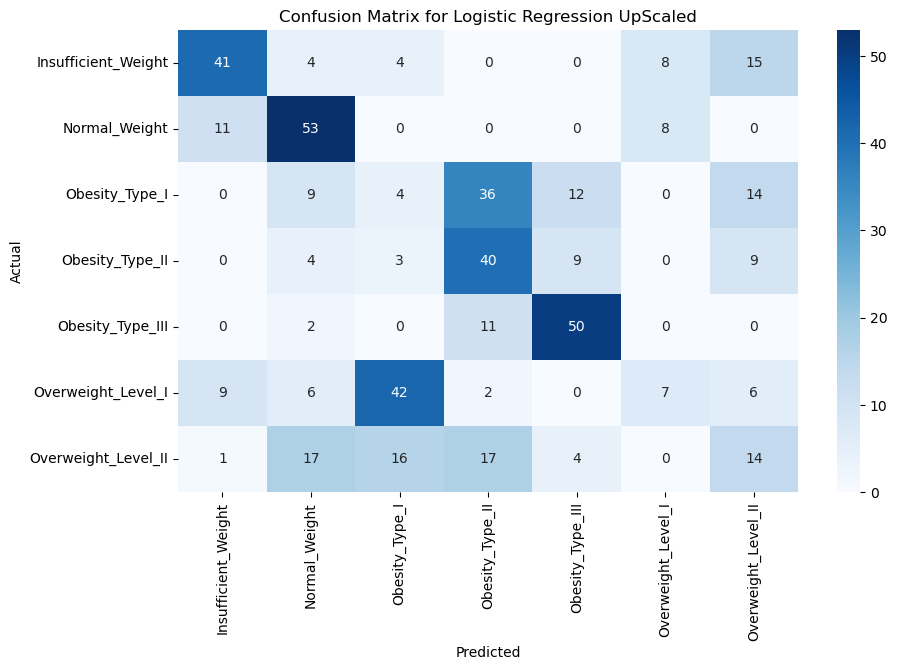

In [1191]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix1_lr_UpScaled, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Logistic Regression UpScaled')
plt.show()


#disp = ConfusionMatrixDisplay(conf_matrix1_lr_UpScaled)
#disp.plot()
#plt.show()

In [1192]:
end_lr_UpScaled = time.time()

In [1193]:
Training_time_lr_UpScaled = end_lr_UpScaled - start_lr_UpScaled

In [1194]:
print("The time of execution of Logistic Regression UpScaled Model is :",
      Training_time_lr_UpScaled , "ms")

The time of execution of Logistic Regression UpScaled Model is : 12.929606199264526 ms


In [1195]:
##XGBoost Classifier

In [1196]:
start_xg_up = time.time()

In [1197]:
model2_xgb_UpScaled = XGBClassifier(random_state=42, n_estimators=100, max_depth=20, min_samples_split=2, min_samples_leaf=1)

In [1198]:
model2_xgb_UpScaled = model2_xgb_UpScaled.fit(X_train_UpScaled,y_train_UpScaled)

In [1199]:
y_pred_train_xgb_UpScaled = model2_xgb_UpScaled.predict(X_train_UpScaled)

In [1200]:
y_pred_test_xgb_UpScaled = model2_xgb_UpScaled.predict(X_test_UpScaled)

In [1201]:
y_proba_xgb_UpScaled = model2_xgb_UpScaled.predict_proba(X_test_UpScaled)

In [1202]:
report2_xgb_UpScaled = classification_report(y_test_UpScaled, y_pred_test_xgb_UpScaled)
print(f"Classification Report: \n{report2_xgb_UpScaled}")

Classification Report: 
              precision    recall  f1-score   support

           0       0.97      0.94      0.96        72
           1       0.92      0.94      0.93        72
           2       0.96      0.99      0.97        75
           3       1.00      0.97      0.98        65
           4       1.00      1.00      1.00        63
           5       0.93      0.96      0.95        72
           6       0.96      0.93      0.94        69

    accuracy                           0.96       488
   macro avg       0.96      0.96      0.96       488
weighted avg       0.96      0.96      0.96       488



In [1203]:
acc_train_xgb_UpScaled = accuracy_score(y_train_UpScaled, y_pred_train_xgb_UpScaled)
acc_test_xgb_UpScaled = accuracy_score(y_test_UpScaled, y_pred_test_xgb_UpScaled)
prec_xgb_UpScaled = precision_score(y_test_UpScaled, y_pred_test_xgb_UpScaled, average='weighted')
recall_xgb_UpScaled = recall_score(y_test_UpScaled, y_pred_test_xgb_UpScaled, average='weighted')
f1_score_xgb_UpScaled = f1_score(y_test_UpScaled, y_pred_test_xgb_UpScaled, average='weighted')
auc_roc_log_xgb_UpScaled = roc_auc_score(y_test_UpScaled, y_proba_xgb_UpScaled, average='weighted', multi_class='ovr')

In [1204]:
print('XGBoost Classifier UpScaling Accuracy Train percentage is:', round(acc_train_xgb_UpScaled*100,2))
print('XGBoost Classifier UpScaling Accuracy percentage is:', round(acc_test_xgb_UpScaled*100,2))
print('XGBoost Classifier UpScaling Precision percentage is:', round(prec_xgb_UpScaled*100,2))
print('XGBoost Classifier UpScaling Recall percentage is:', round(recall_xgb_UpScaled*100,2))
print('XGBoost Classifier UpScaling F1-score percentage is:', round(f1_score_xgb_UpScaled*100,2))
print('XGBoost Classifier UpScaling AUC ROC percentage is:', auc_roc_log_xgb_UpScaled)

XGBoost Classifier UpScaling Accuracy Train percentage is: 100.0
XGBoost Classifier UpScaling Accuracy percentage is: 96.11
XGBoost Classifier UpScaling Precision percentage is: 96.15
XGBoost Classifier UpScaling Recall percentage is: 96.11
XGBoost Classifier UpScaling F1-score percentage is: 96.11
XGBoost Classifier UpScaling AUC ROC percentage is: 0.999061506460338


In [1205]:
# Display the confusion matrix
conf_matrix2_xgb_UpScaled = confusion_matrix(y_test_UpScaled, y_pred_test_xgb_UpScaled)
display(conf_matrix2_xgb_UpScaled)

array([[68,  4,  0,  0,  0,  0,  0],
       [ 2, 68,  0,  0,  0,  2,  0],
       [ 0,  0, 74,  0,  0,  0,  1],
       [ 0,  0,  2, 63,  0,  0,  0],
       [ 0,  0,  0,  0, 63,  0,  0],
       [ 0,  1,  0,  0,  0, 69,  2],
       [ 0,  1,  1,  0,  0,  3, 64]])

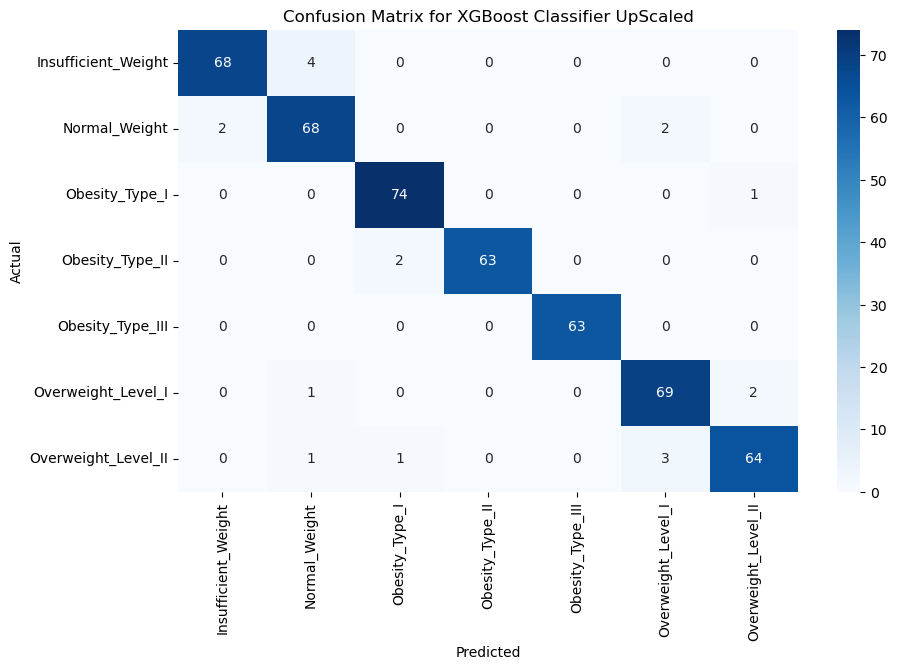

In [1206]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix2_xgb_UpScaled, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for XGBoost Classifier UpScaled')
plt.show()



#disp = ConfusionMatrixDisplay(conf_matrix2_xgb_UpScaled)
#disp.plot()
#plt.show()

In [1207]:
clf1_xgb_UpScaled = OneVsRestClassifier(XGBClassifier(random_state=42, n_estimators=100, max_depth=20, min_samples_split=2, min_samples_leaf=1))

In [1208]:
clf1_xgb_UpScaled.fit(X_train_UpScaled,y_train_UpScaled)

OneVsRestClassifier(estimator=XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=None, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=None,
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=None, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=20,
                                            max_leaves=None,
                                            min_child_weight=None,
                                            min_samples_leaf=1,
                                            min_samples_split=2, missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=100, n_jobs=None, ...))

In [1209]:
pred1_xgb_UpScaled = clf1_xgb_UpScaled.predict(X_test_UpScaled)

In [1210]:
pred_prob_xgb_UpScaled = clf1_xgb_UpScaled.predict_proba(X_test_UpScaled)

In [1211]:
fpr_xgb_up={}
tpr_xgb_up={}
thresh_xgb_up={}
n_classes_xgb_up = 7

In [1212]:
for i in range(n_classes_xgb_up):
    fpr_xgb_up[i],tpr_xgb_up[i],thresh_xgb_up[i] = roc_curve(y_test_UpScaled, pred_prob_xgb_UpScaled[:,i], pos_label=i)

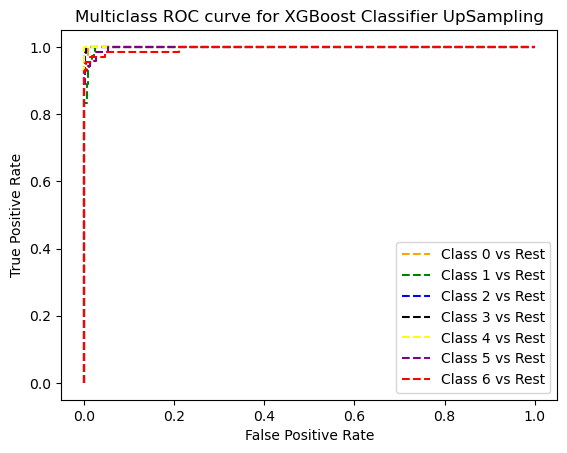

In [1213]:
#Plotting
plt.plot(fpr_xgb_up[0],tpr_xgb_up[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_xgb_up[1],tpr_xgb_up[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_xgb_up[2],tpr_xgb_up[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_xgb_up[3],tpr_xgb_up[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_xgb_up[4],tpr_xgb_up[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_xgb_up[5],tpr_xgb_up[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_xgb_up[6],tpr_xgb_up[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for XGBoost Classifier UpSampling')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('Multiclass ROC for XGBoost Classifier', dpi=300)
plt.show()

In [1214]:
fpr1_xgb_up, tpr1_xgb_up, thresh1_xgb_up = roc_curve(y_test_UpScaled, y_proba_xgb_UpScaled[:,1], pos_label=1)

In [1215]:
random_probs_xgb_UpScaled = [0 for i in range(len(y_test_UpScaled))]
p_fpr_xgb_UpScaled, p_tpr_xgb_UpScaled, _ = roc_curve(y_test_UpScaled,random_probs_xgb_UpScaled,pos_label=1)

In [1216]:
auc_score_xgb_UpScaled = roc_auc_score(y_test_UpScaled, y_proba_xgb_UpScaled, multi_class='ovr')
print(auc_score_xgb_UpScaled)

0.9990773078245647


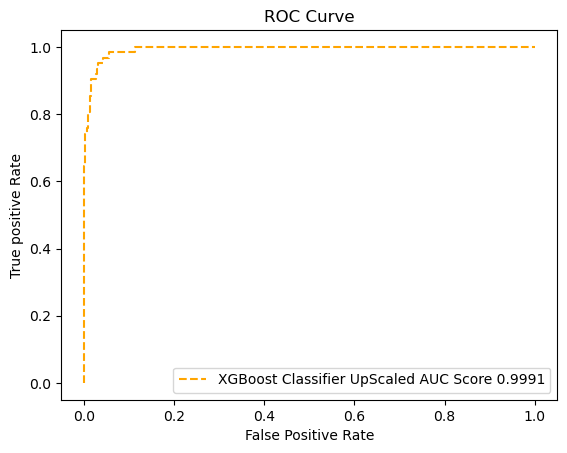

In [1217]:
plt.plot(fpr1_xgb_down, tpr1_xgb_down, linestyle='--',color='orange', label='XGBoost Classifier UpScaled AUC Score {:.4f}'.format(auc_score_xgb_UpScaled))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [1218]:
end_xg_up = time.time()

In [1219]:
Training_time_xg_up = end_xg_up - start_xg_up

In [1220]:
print("The time of execution of XGBoost UpScaled Classifier Model is :",
      Training_time_xg_up , "ms")

The time of execution of XGBoost UpScaled Classifier Model is : 12.736386060714722 ms


In [1221]:
##Gradient Boost Classifier

In [1222]:
start_gb_up = time.time()

In [1223]:
model3_GrB_UpScaled = GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1)

In [1224]:
model3_GrB_UpScaled = model3_GrB_UpScaled.fit(X_train_UpScaled,y_train_UpScaled)

In [1225]:
y_pred_train_GrB_UpScaled = model3_GrB_UpScaled.predict(X_train_UpScaled)

In [1226]:
y_pred_test_GrB_UpScaled = model3_GrB_UpScaled.predict(X_test_UpScaled)

In [1227]:
y_proba_GrB_UpScaled = model3_GrB_UpScaled.predict_proba(X_test_UpScaled)

In [1228]:
report3_GrB_UpScaled = classification_report(y_test_UpScaled, y_pred_test_GrB_UpScaled)
print(f"Classification Report: \n{report3_GrB_UpScaled}")

Classification Report: 
              precision    recall  f1-score   support

           0       0.99      0.94      0.96        72
           1       0.89      0.90      0.90        72
           2       0.94      1.00      0.97        75
           3       1.00      0.97      0.98        65
           4       1.00      1.00      1.00        63
           5       0.89      0.94      0.92        72
           6       0.97      0.90      0.93        69

    accuracy                           0.95       488
   macro avg       0.95      0.95      0.95       488
weighted avg       0.95      0.95      0.95       488



In [1229]:
acc_train_GrB_UpScaled = accuracy_score(y_train_UpScaled, y_pred_train_GrB_UpScaled)
acc_test_GrB_UpScaled = accuracy_score(y_test_UpScaled, y_pred_test_GrB_UpScaled)
prec_GrB_UpScaled = precision_score(y_test_UpScaled, y_pred_test_GrB_UpScaled, average='weighted')
recall_GrB_UpScaled = recall_score(y_test_UpScaled, y_pred_test_GrB_UpScaled, average='weighted')
f1_score_GrB_UpScaled = f1_score(y_test_UpScaled, y_pred_test_GrB_UpScaled, average='weighted')
auc_roc_log_GrB_UpScaled = roc_auc_score(y_test_UpScaled, y_proba_GrB_UpScaled, average='weighted', multi_class='ovr')

In [1230]:
print('Gradient Boost UpScaling Accuracy Train percentage is:', round(acc_train_GrB_UpScaled*100,2))
print('Gradient Boost UpScaling Accuracy percentage is:', round(acc_test_GrB_UpScaled*100,2))
print('Gradient Boost UpScaling Precision percentage is:', round(prec_GrB_UpScaled*100,2))
print('Gradient Boost UpScaling Recall percentage is:', round(recall_GrB_UpScaled*100,2))
print('Gradient Boost UpScaling F1-score percentage is:', round(f1_score_GrB_UpScaled*100,2))
print('Gradient Boost UpScaling AUC ROC percentage is:', auc_roc_log_GrB_UpScaled)

Gradient Boost UpScaling Accuracy Train percentage is: 99.95
Gradient Boost UpScaling Accuracy percentage is: 95.08
Gradient Boost UpScaling Precision percentage is: 95.21
Gradient Boost UpScaling Recall percentage is: 95.08
Gradient Boost UpScaling F1-score percentage is: 95.09
Gradient Boost UpScaling AUC ROC percentage is: 0.9981499495659416


In [1231]:
# Display the confusion matrix
conf_matrix3_GrB_UpScaled = confusion_matrix(y_test_UpScaled, y_pred_test_GrB_UpScaled)
display(conf_matrix3_GrB_UpScaled)

array([[68,  4,  0,  0,  0,  0,  0],
       [ 1, 65,  0,  0,  0,  5,  1],
       [ 0,  0, 75,  0,  0,  0,  0],
       [ 0,  0,  2, 63,  0,  0,  0],
       [ 0,  0,  0,  0, 63,  0,  0],
       [ 0,  3,  0,  0,  0, 68,  1],
       [ 0,  1,  3,  0,  0,  3, 62]])

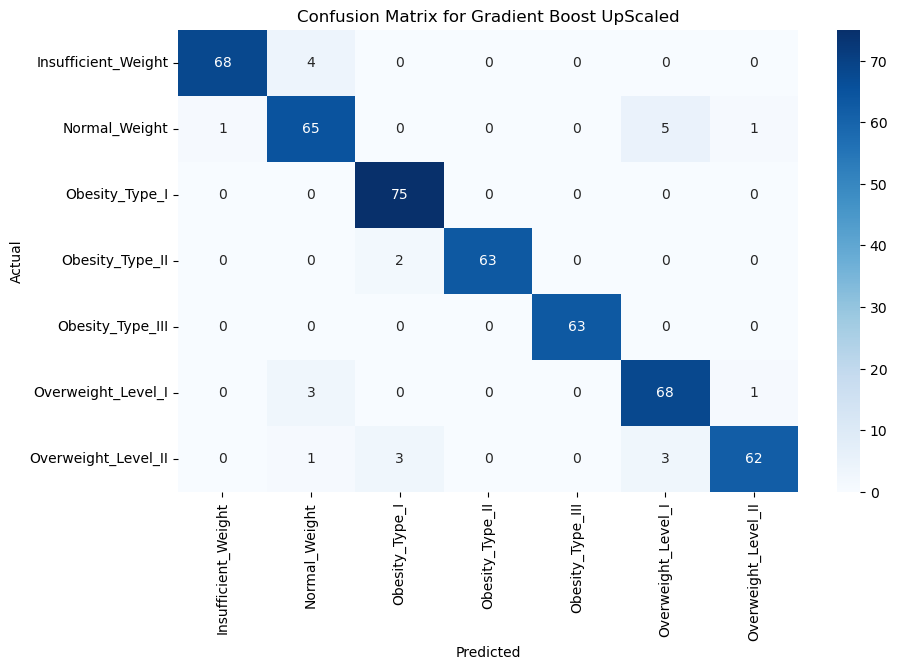

In [1232]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix3_GrB_UpScaled, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Gradient Boost UpScaled')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix3_GrB_UpScaled)
#disp.plot()
#plt.show()

In [1233]:
clf_grb_UpScaled = OneVsRestClassifier(GradientBoostingClassifier(n_estimators=100, learning_rate=1.0, max_depth=1))

In [1234]:
clf_grb_UpScaled.fit(X_train_UpScaled,y_train_UpScaled)

OneVsRestClassifier(estimator=GradientBoostingClassifier(learning_rate=1.0,
                                                         max_depth=1))

In [1235]:
pred_grb_UpScaled = clf_grb_UpScaled.predict(X_test_UpScaled)

In [1236]:
pred_prob_grb_UpScaled = clf_grb_UpScaled.predict_proba(X_test_UpScaled)

In [1237]:
fpr_grb_up={}
tpr_grb_up={}
thresh_grb_up={}
n_classes_grb_up = 7

In [1238]:
for i in range(n_classes_grb_up):
    fpr_grb_up[i],tpr_grb_up[i],thresh_grb_up[i] = roc_curve(y_test_UpScaled, pred_prob_grb_UpScaled[:,i], pos_label=i)

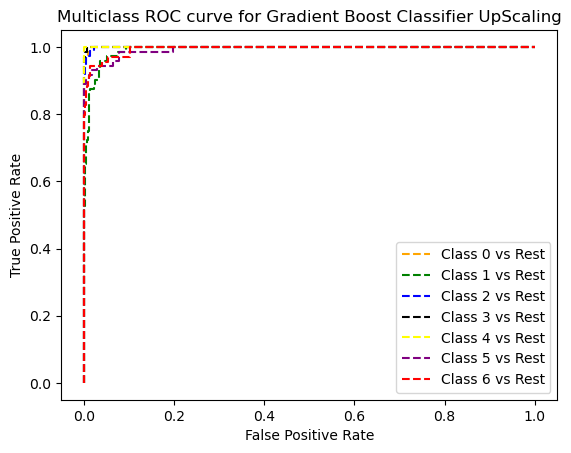

In [1239]:
#Plotting
plt.plot(fpr_grb_up[0],tpr_grb_up[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_grb_up[1],tpr_grb_up[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_grb_up[2],tpr_grb_up[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_grb_up[3],tpr_grb_up[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_grb_up[4],tpr_grb_up[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_grb_up[5],tpr_grb_up[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_grb_up[6],tpr_grb_up[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for Gradient Boost Classifier UpScaling')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC for Gradient Boost Classifier UpScaling', dpi=300)

In [1240]:
fpr1_grb_up, tpr1_grb_up, thresh1_grb_up = roc_curve(y_test_UpScaled, y_proba_GrB_UpScaled[:,1], pos_label=1)

In [1241]:
random_probs_grb_up = [0 for i in range(len(y_test_UpScaled))]
p_fpr_grb_up, p_tpr_grb_up, _ = roc_curve(y_test_UpScaled,random_probs_grb_up,pos_label=1)

In [1242]:
auc_score_grb_up = roc_auc_score(y_test_UpScaled, y_proba_GrB_UpScaled, multi_class='ovr')
print(auc_score_grb_up)

0.9981960810005065


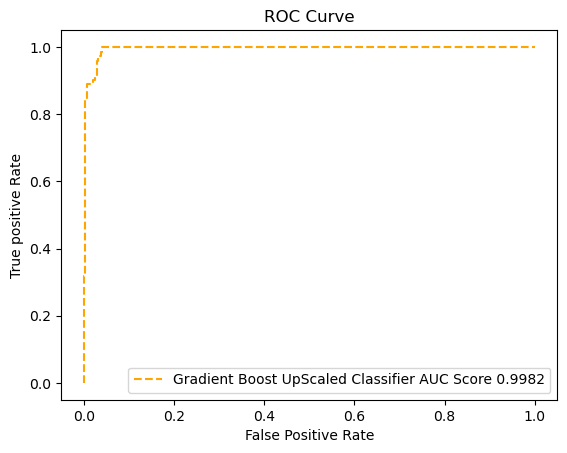

In [1243]:
plt.plot(fpr1_grb_up, tpr1_grb_up, linestyle='--',color='orange', label='Gradient Boost UpScaled Classifier AUC Score {:.4f}'.format(auc_score_grb_up))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [1244]:
end_gb_up = time.time()

In [1245]:
Training_time_gb_up = end_gb_up-start_gb_up

In [1246]:
print("The time of execution of Gradient Boost UpScaling Classifier Model is :",
      Training_time_gb_up , "ms")

The time of execution of Gradient Boost UpScaling Classifier Model is : 12.260298728942871 ms


In [1247]:
##AdaBoost (Adaptive Boosting)

In [1248]:
start_dt_ada_up = time.time()

In [1249]:
tree_up = DecisionTreeClassifier(max_depth=8, criterion='entropy', random_state=1)

In [1250]:
ada_up = AdaBoostClassifier(base_estimator=tree, n_estimators=5000, random_state=1, learning_rate=0.1)

In [1251]:
tree_up.fit(X_train_UpScaled, y_train_UpScaled)

DecisionTreeClassifier(criterion='entropy', max_depth=8, random_state=1)

In [1252]:
ada_up.fit(X_train_UpScaled, y_train_UpScaled)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(criterion='entropy',
                                                         max_depth=8,
                                                         random_state=1),
                   learning_rate=0.1, n_estimators=5000, random_state=1)

In [1253]:
y_pred_test_ada_UpScaled = ada_up.predict(X_test_UpScaled)

In [1254]:
y_pred_train_ada_UpScaled = ada_up.predict(X_train_UpScaled)

In [1255]:
y_proba_ada_UpScaled = ada_up.predict_proba(X_test_UpScaled)

In [1256]:
report6_rfc_UpScaled = classification_report(y_test_UpScaled, y_pred_test_ada_UpScaled)
print(f"Classification Report for AdaBoost UpScaling Classifier: \n{report6_rfc_UpScaled}")

Classification Report for AdaBoost UpScaling Classifier: 
              precision    recall  f1-score   support

           0       0.97      1.00      0.99        72
           1       0.99      0.96      0.97        72
           2       0.95      1.00      0.97        75
           3       1.00      0.95      0.98        65
           4       1.00      1.00      1.00        63
           5       0.95      0.96      0.95        72
           6       0.97      0.94      0.96        69

    accuracy                           0.97       488
   macro avg       0.97      0.97      0.97       488
weighted avg       0.97      0.97      0.97       488



In [1257]:
acc_train_ada_up = accuracy_score(y_train_UpScaled, y_pred_train_ada_UpScaled)
acc_test_ada_up = accuracy_score(y_test_UpScaled, y_pred_test_ada_UpScaled)
prec_ada_up = precision_score(y_test_UpScaled, y_pred_test_ada_UpScaled, average='weighted')
recall_ada_up = recall_score(y_test_UpScaled, y_pred_test_ada_UpScaled, average='weighted')
f1_score_ada_up = f1_score(y_test_UpScaled, y_pred_test_ada_UpScaled, average='weighted')
auc_roc_log_ada_up = roc_auc_score(y_test_UpScaled, y_proba_ada_UpScaled, average='weighted', multi_class='ovr')

In [1258]:
print('AdaBoost UpScaling Classifier Accuracy Train percentage is:', round(acc_train_ada_up*100,2))
print('AdaBoost UpScaling Classifier Accuracy percentage is:', round(acc_test_ada_up*100,2))
print('AdaBoost UpScaling Classifier Precision percentage is:', round(prec_ada_up*100,2))
print('AdaBoost UpScaling Classifier Recall percentage is:', round(recall_ada_up*100,2))
print('AdaBoost UpScaling Classifier F1-score percentage is:', round(f1_score_ada_up*100,2))
print('AdaBoost UpScaling Classifier AUC ROC percentage is:', auc_roc_log_ada_up)

AdaBoost UpScaling Classifier Accuracy Train percentage is: 100.0
AdaBoost UpScaling Classifier Accuracy percentage is: 97.34
AdaBoost UpScaling Classifier Precision percentage is: 97.38
AdaBoost UpScaling Classifier Recall percentage is: 97.34
AdaBoost UpScaling Classifier F1-score percentage is: 97.33
AdaBoost UpScaling Classifier AUC ROC percentage is: 0.9970957662465855


In [1259]:
# Display the confusion matrix
conf_matrix6_ada_UpScaled= confusion_matrix(y_test_UpScaled, y_pred_test_ada_UpScaled)
display(conf_matrix6_ada_UpScaled)

array([[72,  0,  0,  0,  0,  0,  0],
       [ 2, 69,  0,  0,  0,  1,  0],
       [ 0,  0, 75,  0,  0,  0,  0],
       [ 0,  0,  3, 62,  0,  0,  0],
       [ 0,  0,  0,  0, 63,  0,  0],
       [ 0,  1,  0,  0,  0, 69,  2],
       [ 0,  0,  1,  0,  0,  3, 65]])

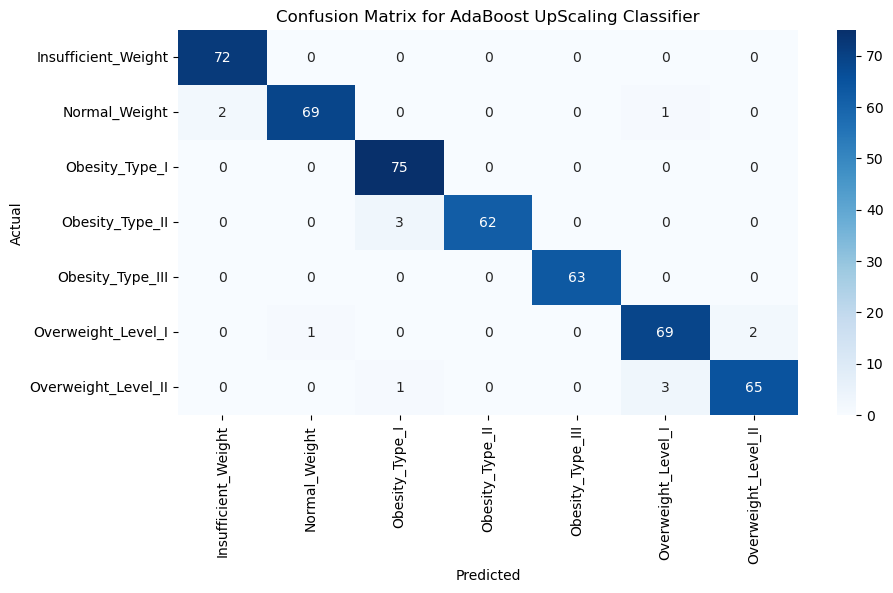

In [1260]:
plt.figure(figsize=(10, 5))
sns.heatmap(conf_matrix6_ada_UpScaled, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for AdaBoost UpScaling Classifier')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix6_ada_UpScaled)
#disp.plot()
#plt.show()

In [1261]:
clf_ada_up = OneVsRestClassifier(AdaBoostClassifier(base_estimator=tree, n_estimators=5000, random_state=1, learning_rate=0.1))

In [1274]:
clf_ada_up.fit(X_train_UpScaled,y_train_UpScaled)

OneVsRestClassifier(estimator=AdaBoostClassifier(base_estimator=DecisionTreeClassifier(criterion='entropy',
                                                                                       max_depth=8,
                                                                                       random_state=1),
                                                 learning_rate=0.1,
                                                 n_estimators=5000,
                                                 random_state=1))

In [1275]:
pred_prob_ada_up = clf_ada_up.predict_proba(X_test_UpScaled)

In [1276]:
fpr_ada_up={}
tpr_ada_up={}
thresh_ada_up={}
n_classes_ada_up = 7

In [1277]:
for i in range(n_classes_ada_up):
    fpr_ada_up[i],tpr_ada_up[i],thresh_ada_up[i] = roc_curve(y_test_UpScaled, pred_prob_ada_up[:,i], pos_label=i)

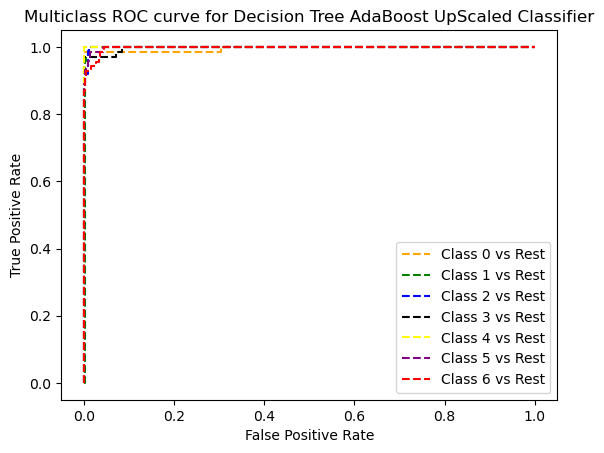

In [1278]:
#Plotting
plt.plot(fpr_ada_up[0],tpr_ada_up[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_ada_up[1],tpr_ada_up[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_ada_up[2],tpr_ada_up[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_ada_up[3],tpr_ada_up[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_ada_up[4],tpr_ada_up[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_ada_up[5],tpr_ada_up[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_ada_up[6],tpr_ada_up[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for Decision Tree AdaBoost UpScaled Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC for Decision Tree AdaBoost UpScaled Classifier', dpi=300)

In [1279]:
fpr1_ada_up, tpr1_ada_up, thresh1_ada_up = roc_curve(y_test_UpScaled, y_proba_ada_UpScaled[:,1], pos_label=1)

In [1280]:
random_probs_ada_up = [0 for i in range(len(y_test_UpScaled))]
p_fpr_ada_up, p_tpr_ada_up, _ = roc_curve(y_test_UpScaled,random_probs_ada_up,pos_label=1)

In [1281]:
auc_score_ada_up = roc_auc_score(y_test_UpScaled, y_proba_ada_UpScaled, multi_class='ovr')
print(auc_score_ada_up)

0.9970715660212185


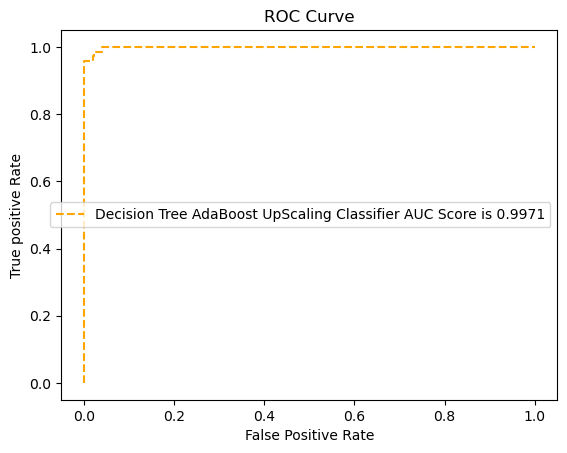

In [1282]:
plt.plot(fpr1_ada_up, tpr1_ada_up, linestyle='--',color='orange', label='Decision Tree AdaBoost UpScaling Classifier AUC Score is {:.4f}'.format(auc_score_ada_up))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
plt.savefig('ROC', dpi=300)
plt.show()

In [1283]:
end_dt_ada_up = time.time()

In [1284]:
Training_time_dt_ada_up = end_dt_ada_up-start_dt_ada_up

In [1285]:
print("The time of execution of Decision Tree AdaBoost UpScaled Classifier Model is :",
      Training_time_dt_ada_up , "ms")

The time of execution of Decision Tree AdaBoost UpScaled Classifier Model is : 500.4696660041809 ms


In [1286]:
#Random Forest Classifier

In [1287]:
start_rf_up = time.time()

In [1288]:
model4_rfc_UpScaled = RandomForestClassifier(n_estimators=100, random_state=42)

In [1289]:
model4_rfc_UpScaled = model4_rfc_UpScaled.fit(X_train_UpScaled,y_train_UpScaled)

In [1290]:
y_pred_train_rfc_UpScaled = model4_rfc_UpScaled.predict(X_train_UpScaled)

In [1291]:
y_pred_test_rfc_UpScaled = model4_rfc_UpScaled.predict(X_test_UpScaled)

In [1292]:
y_proba_rfc_UpScaled = model4_rfc_UpScaled.predict_proba(X_test_UpScaled)

In [1293]:
report4_rfc_UpScaled = classification_report(y_test_UpScaled, y_pred_test_rfc_UpScaled)
print(f"Classification Report for Random Forest UpScaling Classifier: \n{report4_rfc_UpScaled}")

Classification Report for Random Forest UpScaling Classifier: 
              precision    recall  f1-score   support

           0       1.00      0.94      0.97        72
           1       0.81      1.00      0.89        72
           2       0.94      0.96      0.95        75
           3       1.00      0.95      0.98        65
           4       1.00      1.00      1.00        63
           5       0.99      0.94      0.96        72
           6       0.98      0.86      0.91        69

    accuracy                           0.95       488
   macro avg       0.96      0.95      0.95       488
weighted avg       0.96      0.95      0.95       488



In [1294]:
acc_train_rfc_up = accuracy_score(y_train_UpScaled, y_pred_train_rfc_UpScaled)
acc_test_rfc_up = accuracy_score(y_test_UpScaled, y_pred_test_rfc_UpScaled)
prec_rfc_up = precision_score(y_test_UpScaled, y_pred_test_rfc_UpScaled, average='weighted')
recall_rfc_up = recall_score(y_test_UpScaled, y_pred_test_rfc_UpScaled, average='weighted')
f1_score_rfc_up = f1_score(y_test_UpScaled, y_pred_test_rfc_UpScaled, average='weighted')
auc_roc_log_rfc_up = roc_auc_score(y_test_UpScaled, y_proba_rfc_UpScaled, average='weighted', multi_class='ovr')

In [1295]:
print('Random Forest UpScaling Classifier Accuracy Train percentage is:', round(acc_train_rfc_up*100,2))
print('Random Forest UpScaling Classifier Accuracy percentage is:', round(acc_test_rfc_up*100,2))
print('Random Forest UpScaling Classifier Precision percentage is:', round(prec_rfc_up*100,2))
print('Random Forest UpScaling Classifier Recall percentage is:', round(recall_rfc_up*100,2))
print('Random Forest UpScaling Classifier F1-score percentage is:', round(f1_score_rfc_up*100,2))
print('Random Forest UpScaling Classifier AUC ROC percentage is:', auc_roc_log_rfc_up)

Random Forest UpScaling Classifier Accuracy Train percentage is: 100.0
Random Forest UpScaling Classifier Accuracy percentage is: 95.08
Random Forest UpScaling Classifier Precision percentage is: 95.73
Random Forest UpScaling Classifier Recall percentage is: 95.08
Random Forest UpScaling Classifier F1-score percentage is: 95.17
Random Forest UpScaling Classifier AUC ROC percentage is: 0.9970868605213716


In [1296]:
# Display the confusion matrix
conf_matrix4_rfc_UpScaled= confusion_matrix(y_test_UpScaled, y_pred_test_rfc_UpScaled)
display(conf_matrix4_rfc_UpScaled)

array([[68,  4,  0,  0,  0,  0,  0],
       [ 0, 72,  0,  0,  0,  0,  0],
       [ 0,  3, 72,  0,  0,  0,  0],
       [ 0,  0,  3, 62,  0,  0,  0],
       [ 0,  0,  0,  0, 63,  0,  0],
       [ 0,  3,  0,  0,  0, 68,  1],
       [ 0,  7,  2,  0,  0,  1, 59]])

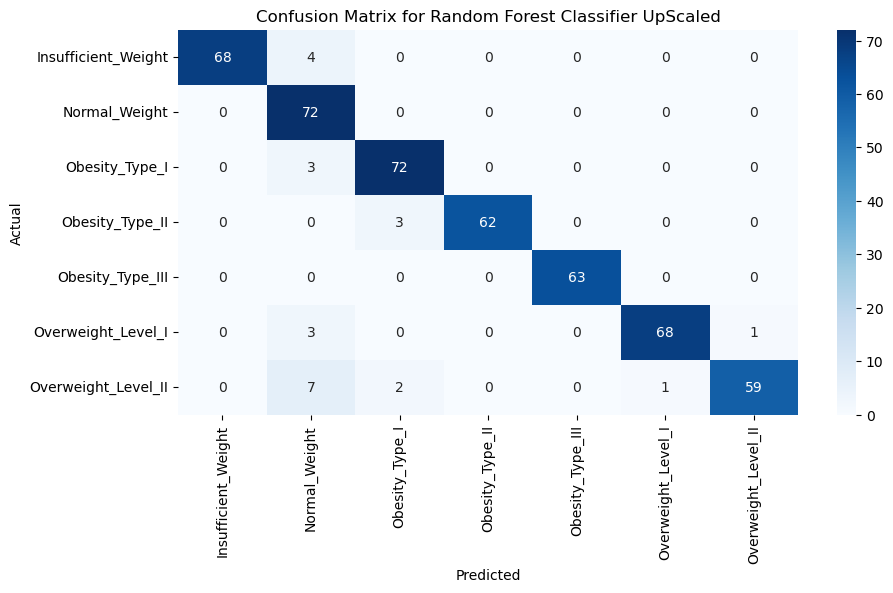

In [1297]:
plt.figure(figsize=(10, 5))
sns.heatmap(conf_matrix4_rfc_UpScaled, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest Classifier UpScaled')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix4_rfc_UpScaled)
#disp.plot()
#plt.show()

In [1298]:
clf_rfc_UpScaled = OneVsRestClassifier(RandomForestClassifier(n_estimators=100, random_state=42))

In [1299]:
clf_rfc_UpScaled.fit(X_train_UpScaled,y_train_UpScaled)

OneVsRestClassifier(estimator=RandomForestClassifier(random_state=42))

In [1300]:
pred_rfc_UpScaled = clf_rfc_down.predict(X_test_UpScaled)

In [1301]:
pred_prob_rfc_UpScaled = clf_rfc_UpScaled.predict_proba(X_test_UpScaled)

In [1302]:
fpr_rfc_up={}
tpr_rfc_up={}
thresh_rfc_up={}
n_classes_rfc_up = 7

In [1303]:
for i in range(n_classes_rfc_up):
    fpr_rfc_up[i],tpr_rfc_up[i],thresh_rfc_up[i] = roc_curve(y_test_UpScaled, pred_prob_rfc_UpScaled[:,i], pos_label=i)

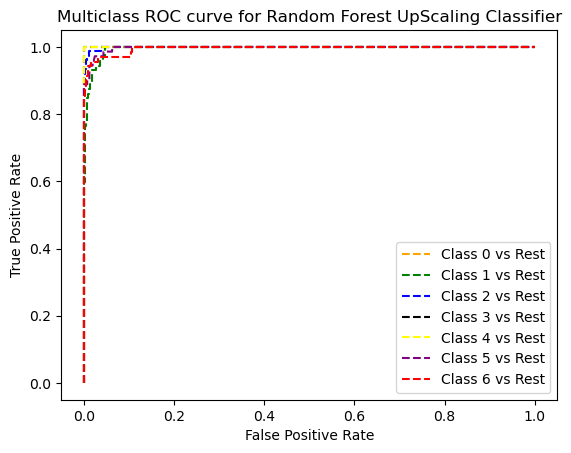

In [1304]:
#Plotting
plt.plot(fpr_rfc_up[0],tpr_rfc_up[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_rfc_up[1],tpr_rfc_up[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_rfc_up[2],tpr_rfc_up[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_rfc_up[3],tpr_rfc_up[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_rfc_up[4],tpr_rfc_up[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_rfc_up[5],tpr_rfc_up[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_rfc_up[6],tpr_rfc_up[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for Random Forest UpScaling Classifier')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
plt.savefig('Multiclass ROC for Random Forest UpScaling Classifier', dpi=300)

In [1305]:
fpr1_rfc_up, tpr1_rfc_up, thresh1_rfc_up = roc_curve(y_test_UpScaled, y_proba_rfc_UpScaled[:,1], pos_label=1)

In [1306]:
random_probs_rfc_up = [0 for i in range(len(y_test_UpScaled))]
p_fpr_rfc_up, p_tpr_rfc_up, _ = roc_curve(y_test_UpScaled,random_probs_rfc_up,pos_label=1)

In [1307]:
auc_score_rfc_up = roc_auc_score(y_test_UpScaled, y_proba_rfc_UpScaled, multi_class='ovr')
print(auc_score_rfc_up)

0.9971311395922428


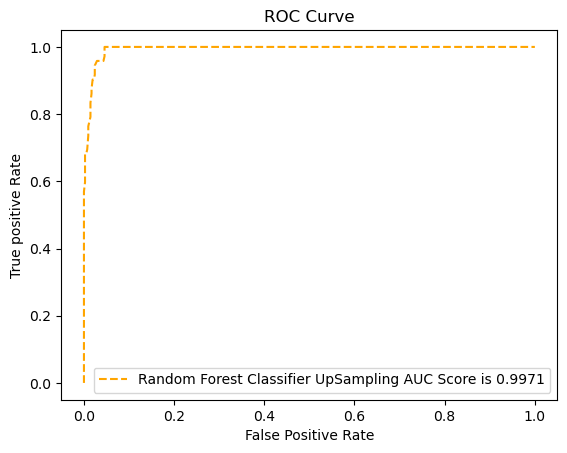

In [1308]:
plt.plot(fpr1_rfc_up, tpr1_rfc_up, linestyle='--',color='orange', label='Random Forest Classifier UpSampling AUC Score is {:.4f}'.format(auc_score_rfc_up))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [1309]:
end_rf_up = time.time()

In [1310]:
Training_time_rf_up = end_rf_up - start_rf_up

In [1311]:
print("The time of execution of Random Forest Classifier UpScaled Model is :",
      Training_time_rf_up , "ms")

The time of execution of Random Forest Classifier UpScaled Model is : 18.427281141281128 ms


In [1312]:
start_svc_up = time.time()

In [1313]:
svc_UpScaled = SVC(probability=True, kernel='linear')

In [1314]:
adb_svc_UpScaled = AdaBoostClassifier(n_estimators=100, random_state=42, base_estimator=svc, learning_rate=0.01)

In [ ]:
model7_scv_UpScaled = adb_svc_UpScaled.fit(X_train_UpScaled,y_train_UpScaled)

In [ ]:
y_pred_train_svc_UpScaled = model7_scv_UpScaled.predict(X_train_UpScaled)

In [ ]:
y_pred_test_svc_UpScaled = model7_scv_UpScaled.predict(X_test_UpScaled)

In [ ]:
y_proba_svc_UpScaled = model7_scv_UpScaled.predict_proba(X_test_UpScaled)

In [ ]:
report7_svc_UpScaled = classification_report(y_test_UpScaled, y_pred_test_svc_UpScaled)
print(f"Classification Report for Support Vector Classifier UpScaled: \n{report7_svc_UpScaled}")

In [ ]:
acc_train_svc_up = accuracy_score(y_train_UpScaled, y_pred_train_svc_UpScaled)
acc_test_svc_up = accuracy_score(y_test_UpScaled, y_pred_test_svc_UpScaled)
prec_svc_up = precision_score(y_test_UpScaled, y_pred_test_svc_UpScaled, average='weighted')
recall_svc_up = recall_score(y_test_UpScaled, y_pred_test_svc_UpScaled, average='weighted')
f1_score_svc_up = f1_score(y_test_UpScaled, y_pred_test_svc_UpScaled, average='weighted')
auc_roc_log_svc_up = roc_auc_score(y_test_UpScaled, y_proba_svc_UpScaled, average='weighted', multi_class='ovr')

In [ ]:
print('Support Vector Classifier UpScaled Accuracy Train percentage is:', round(acc_train_svc_up*100,2))
print('Support Vector Classifier UpScaled Accuracy percentage is:', round(acc_test_svc_up*100,2))
print('Support Vector Classifier UpScaled Precision percentage is:', round(prec_svc_up*100,2))
print('Support Vector Classifier UpScaled Recall percentage is:', round(recall_svc_up*100,2))
print('Support Vector Classifier UpScaled F1-score percentage is:', round(f1_score_svc_up*100,2))
print('Support Vector Classifier UpScaled AUC ROC percentage is:', auc_roc_log_svc_up)

In [ ]:
# Display the confusion matrix
conf_matrix7_svc_up = confusion_matrix(y_test_UpScaled, y_pred_test_svc_UpScaled)
display(conf_matrix7_svc_up)

In [ ]:
plt.figure(figsize=(10, 5))
sns.heatmap(conf_matrix7_svc_up, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Support Vector Classifier UpScaled')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix7_svc_up)
#disp.plot()
#plt.show()

In [ ]:
clf_svc_UpScaled = OneVsRestClassifier(AdaBoostClassifier(n_estimators=100, random_state=42, base_estimator=svc, learning_rate=0.01))

In [ ]:
clf_svc_UpScaled.fit(X_train_UpScaled,y_train_UpScaled)

In [ ]:
pred_svc_UpScaled = clf_svc_UpScaled.predict(X_test_UpScaled)

In [ ]:
pred_prob_svc_UpScaled = clf_svc_UpScaled.predict_proba(X_test_UpScaled)

In [ ]:
fpr_svc_up={}
tpr_svc_up={}
thresh_svc_up={}
n_classes_svc_up = 7

In [ ]:
for i in range(n_classes_svc_up):
    fpr_svc_up[i],tpr_svc_up[i],thresh_svc_up[i] = roc_curve(y_test_UpScaled, pred_prob_svc_UpScaled[:,i], pos_label=i)

In [ ]:
#Plotting
plt.plot(fpr_svc_up[0],tpr_svc_up[0],linestyle='--',color='orange',label='Class 0 vs Rest')
plt.plot(fpr_svc_up[1],tpr_svc_up[1],linestyle='--',color='green',label='Class 1 vs Rest')
plt.plot(fpr_svc_up[2],tpr_svc_up[2],linestyle='--',color='blue',label='Class 2 vs Rest')
plt.plot(fpr_svc_up[3],tpr_svc_up[3],linestyle='--',color='black',label='Class 3 vs Rest')
plt.plot(fpr_svc_up[4],tpr_svc_up[4],linestyle='--',color='yellow',label='Class 4 vs Rest')
plt.plot(fpr_svc_up[5],tpr_svc_up[5],linestyle='--',color='purple',label='Class 5 vs Rest')
plt.plot(fpr_svc_up[6],tpr_svc_up[6],linestyle='--',color='red',label='Class 6 vs Rest')
plt.title('Multiclass ROC curve for Support Vector Classifier UpScaled')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('Multiclass ROC for Support Vector Classifier', dpi=300)

In [ ]:
fpr1_svc_up, tpr1_svc_up, thresh1_svc_up = roc_curve(y_test_UpScaled, y_proba_svc_UpScaled[:,1], pos_label=1)

In [ ]:
random_probs_svc_up = [0 for i in range(len(y_test_UpScaled))]
p_fpr_svc_up, p_tpr_svc_up, _ = roc_curve(y_test_UpScaled,random_probs_svc_up,pos_label=1)

In [ ]:
auc_score_svc_up = roc_auc_score(y_test_UpScaled, y_proba_svc_UpScaled, multi_class='ovr')
print(auc_score_svc_up)

In [ ]:
plt.plot(fpr1_svc_up, tpr1_svc_up, linestyle='--',color='orange', label='Support Vector Classifier UpScaling AUC Score is {:.4f}'.format(auc_score_svc_up))
plt.title('ROC Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [ ]:
end_svc_up = time.time()

In [ ]:
Training_time_svc_up = end_svc_up - start_svc_up

In [ ]:
print("The time of execution of Support Vector Classifier UpScaled Model is :",
      Training_time_svc_up , "ms")

In [ ]:
#Decision Tree Classifier

In [ ]:
start_dt_up = time.time()

In [ ]:
model6_dtc_UpScaled = DecisionTreeClassifier(criterion='entropy',random_state=0)

In [ ]:
model6_dtc_UpScaled = model6_dtc_UpScaled.fit(X_train_UpScaled,y_train_UpScaled)

In [ ]:
y_pred_train_dtc_UpScaled = model6_dtc_UpScaled.predict(X_train_UpScaled)

In [ ]:
y_pred_test_dtc_UpScaled = model6_dtc_UpScaled.predict(X_test_UpScaled)

In [ ]:
y_proba_dtc_UpScaled = model6_dtc_UpScaled.predict_proba(X_test_UpScaled)

In [ ]:
report6_dtc_UpScaled = classification_report(y_test_UpScaled, y_pred_test_dtc_UpScaled)
print(f"Classification Report for Decision Tree UpScaled Classifier: \n{report6_dtc_UpScaled}")

In [ ]:
acc_train_dtc_up = accuracy_score(y_train_UpScaled, y_pred_train_dtc_UpScaled)
acc_test_dtc_up = accuracy_score(y_test_UpScaled, y_pred_test_dtc_UpScaled)
prec_dtc_up = precision_score(y_test_UpScaled, y_pred_test_dtc_UpScaled, average='weighted')
recall_dtc_up = recall_score(y_test_UpScaled, y_pred_test_dtc_UpScaled, average='weighted')
f1_score_dtc_up = f1_score(y_test_UpScaled, y_pred_test_dtc_UpScaled, average='weighted')
auc_roc_log_dtc_up = roc_auc_score(y_test_UpScaled, y_proba_dtc_UpScaled, average='weighted', multi_class='ovr')

In [ ]:
print('Decision Tree Classifier UpScaling Accuracy Train percentage is:', round(acc_train_dtc_up*100,2))
print('Decision Tree Classifier UpScaling Accuracy percentage is:', round(acc_test_dtc_up*100,2))
print('Decision Tree Classifier UpScaling Precision percentage is:', round(prec_dtc_up*100,2))
print('Decision Tree Classifier UpScaling Recall percentage is:', round(recall_dtc_up*100,2))
print('Decision Tree Classifier UpScaling F1-score percentage is:', round(f1_score_dtc_up*100,2))
print('Decision Tree Classifier UpScaling AUC ROC percentage is:', auc_roc_log_dtc_up)

In [ ]:
# Display the confusion matrix
conf_matrix6_dtc_UpScaled = confusion_matrix(y_test_UpScaled, y_pred_test_dtc_UpScaled)
display(conf_matrix6_dtc_UpScaled)

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(conf_matrix6_dtc_UpScaled, annot=True, fmt='d', cmap='Blues', xticklabels=label_enc.classes_, yticklabels=label_enc.classes_)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Decision Tree Classifier UpScaling')
plt.show()




#disp = ConfusionMatrixDisplay(conf_matrix6_dtc_UpScaled)
#disp.plot()
#plt.show()

In [ ]:
# Visualize the decision tree
plt.figure(figsize=(10, 6))
plot_tree(model6_dtc_UpScaled, filled=True, rounded=True)
plt.title('Decision Tree Classifier UpScaled')
plt.show()

#, class_names=['Class 0', 'Class 1', 'Class 2', 'Class 3', 'Class 4', 'Class 5', 'Class 6'], feature_names=['Feature 1', 'Feature 2', 'Feature 3', 'Feature 4', 'Feature 5', 'Feature 6', 'Feature 7']

In [ ]:
end_dt_up = time.time()

In [ ]:
Training_time_dt_up = end_dt_up - start_dt_up

In [ ]:
print("The time of execution of Decision Tree Classifier UpScaling Model is :",
      Training_time_dt_up , "ms")

In [ ]:
plt.plot(fpr1_lr_up, tpr1_lr_up, linestyle='--',color='orange', label='Logistic Regression UpScaled ROC curve (area = %0.2f)' %auc_score1_lr_UpScaled)
plt.plot(fpr1_xgb_up, tpr1_xgb_up, linestyle='--',color='green', label='XGBoost UpScaled Classifier ROC curve (area = %0.2f)' %auc_score_xgb_UpScaled)
plt.plot(fpr1_grb_up, tpr1_grb_up, linestyle='--',color='yellow', label='Gradient Boost UpScaled Classifier ROC curve (area = %0.2f)' %auc_score_grb_up)
plt.plot(fpr1_rfc_up, tpr1_rfc_up, linestyle='--',color='blue', label='Random Forest UpScaled Classifier ROC curve (area = %0.2f)' %auc_score_rfc_up)
plt.plot(fpr1_svc_up, tpr1_svc_up, linestyle='--',color='red', label='Support Vector UpScaled Classifier ROC curve (area = %0.2f)' %auc_score_svc_up)
plt.plot(fpr1_ada_up, tpr1_ada_up, linestyle='--',color='magenta', label='Decision Tree UpScaled AdaBoost Classifier AUC Score is {:.4f}'.format(auc_score_ada_up))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--') 



plt.title('Receiver Operating Characteristic Curve UpScaled')
plt.xlabel('False Positive Rate')
plt.ylabel('True positive Rate')

plt.legend(loc='best')
#plt.savefig('ROC', dpi=300)
plt.show()

In [ ]:
##Neural Network

In [ ]:
start_nn_up = time.time()

In [ ]:
model_up = tf.keras.models.Sequential()

In [ ]:
model_up.add(tf.keras.layers.Flatten(input_shape=(32,)))

In [ ]:
model_up.add(tf.keras.layers.Dense(32,activation='relu'))

In [ ]:
model_up.add(tf.keras.layers.Dense(64,activation='softmax'))

In [ ]:
model_up.add(Dropout(0.01))

In [ ]:
model_up.compile(optimizer='adam',
             loss='sparse_categorical_crossentropy',
             metrics=['accuracy'])

In [ ]:
model_up.summary()

In [ ]:
history_up = model_up.fit(X_train_UpScaled,y_train_UpScaled,
                   batch_size=64, epochs=500,
                   validation_split=0.2)

In [ ]:
accuracy_nn_up = history_up.history['accuracy']
validation_accuracy_up = history_up.history['val_accuracy']

plt.plot(accuracy_nn_up, label='Training Set Accuracy')
plt.plot(validation_accuracy_up, label='Validation Set Accuracy')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy Across Epochs UpScaled')
plt.legend()

In [ ]:
loss_nn_up = history_up.history['loss']
validation_loss_nn_up = history_up.history['val_loss']

plt.plot(loss_nn_up, label='Training Set Loss')
plt.plot(validation_loss_nn_up, label='Validation Set Loss')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Across Epochs UpScaled')
plt.legend()

In [ ]:
y_pred_train_nn_up = model_down.predict(X_train_UpScaled)
y_pred_train_nn_up = y_pred_train_nn_up.argmax(axis=1)

In [ ]:
y_pred_test_nn_up = model_up.predict(X_test_UpScaled)
y_pred_test_nn_up = y_pred_test_nn_up.argmax(axis=1)

In [ ]:
cm_nn_up = confusion_matrix(y_test_UpScaled, y_pred_test_nn_up)

In [ ]:
ax = sns.heatmap(cm_nn_up, cmap='flare', annot=True, fmt='d')
plt.xlabel("Predicted Class", fontsize=12)
plt.ylabel("True Class",fontsize=12)
plt.title("Confusion Matrix", fontsize=12)

plt.show()

In [ ]:
print(classification_report(y_test_UpScaled,y_pred_test_nn_up))

In [ ]:
acc_train_nn_up = accuracy_score(y_train_UpScaled, y_pred_train_nn_up)
acc_test_nn_up = accuracy_score(y_test_UpScaled, y_pred_test_nn_up)
prec_nn_up = precision_score(y_test_UpScaled, y_pred_test_nn_up, average='weighted')
recall_nn_up = recall_score(y_test_UpScaled, y_pred_test_nn_up, average='weighted')
f1_score_nn_up = f1_score(y_test_UpScaled, y_pred_test_nn_up, average='weighted')

In [ ]:
print('Neural Network UpScaled Accuracy Train percentage is:', round(acc_train_nn_up*100,2))
print('Neural Network UpScaled Accuracy Test Percentage is:', round(acc_test_nn_up*100,2))
print('Neural Network UpScaled Precision percentage is:', round(prec_nn_up*100,2))
print('Neural Network UpScaled Recall percentage is:', round(recall_nn_up*100,2))
print('Neural Network UpScaled F1-score percentage is:', round(f1_score_nn_up*100,2))

In [ ]:
end_nn_up = time.time()

In [ ]:
Training_time_nn_up = end_nn_up - start_nn_up

In [ ]:
print("The time of execution of Recurrent Neural Network Model UpScaled is :",
      Training_time_nn_up , "ms")

In [ ]:
metrics_up = [[acc_train_lr_UpScaled,acc_test_lr_UpScaled,prec_lr_UpScaled,recall_lr_UpScaled,f1_score_lr_UpScaled,auc_roc_log_lr_UpScaled,Training_time_lr_UpScaled],
           [acc_train_xgb_UpScaled,acc_test_xgb_UpScaled,prec_xgb_UpScaled,recall_xgb_UpScaled,f1_score_xgb_UpScaled,auc_roc_log_xgb_UpScaled,Training_time_xg_up],
           [acc_train_GrB_UpScaled,acc_test_GrB_UpScaled,prec_GrB_UpScaled,recall_GrB_UpScaled,f1_score_GrB_UpScaled,auc_roc_log_GrB_UpScaled,Training_time_gb_up],
           [acc_train_rfc_up,acc_test_rfc_up,prec_rfc_up,recall_rfc_up,f1_score_rfc_up,auc_roc_log_rfc_up,Training_time_rf_up],
           [acc_train_dtc_up,acc_test_dtc_up,prec_dtc_up,recall_dtc_up,f1_score_dtc_up,auc_roc_log_dtc_up,Training_time_dt_up],
           [acc_train_ada_up,acc_test_ada_up,prec_ada_up,recall_ada_up,f1_score_ada_up,auc_roc_log_ada_up,Training_time_dt_ada_up],
           [acc_train_svc_up,acc_test_svc_up,prec_svc_up,recall_svc_up,f1_score_svc_up,auc_roc_log_svc_up,Training_time_svc_up],
           [acc_train_nn_up,acc_test_nn_up,prec_nn_up,recall_nn_up,f1_score_nn_up,'0.0','0.0']
          ]

In [ ]:
Final_result_UpScaled = pd.DataFrame(metrics_up, columns=['Train Accuracy', 'Test Accuracy', 'Test Precision', 'Test Recall', 'Test F1 Score', 'AUC ROC Score', 'Training Time(ms)'],
                           index=['Logistic Regression','XGBoost','Gradient Boosting', 'Random Forest', 'Decision Tree Classifier', 'Decision Tree AdaBoost', 'Support Vector Machines', 'Recurrent Neural Network'])

In [ ]:
Final_result_UpScaled

In [ ]:
Final_result_UpScaled.plot(kind='bar')

plt.legend(loc = 'lower right')